In [1]:
from utils.utils import *

structures_path = "1.Minimal_structures/Minimal_structures"

Cif.path = structures_path
Cif.original_cifs_path = "/home/fnerin/Desktop/allodb_new/src/data" # <pdb>_updated.cif.gz

# allodb

In [2]:
import sys
sys.path.append("..")

from src import *

db.init('../database.db')
dbpdbs = set(i.entry_id for i in PDB.select())
db.close()

True

# Data

In [3]:
holos_featuresf = "4.Features/features.pkl"

with open(holos_featuresf, "rb") as f:
    holos_featuresd = pickle.load(f)

holos_featuresd

{'6ta3':     Residues                                                          \
          pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
 0       6ta3               2             B            1            A   
 1       6ta3               2             B            2            A   
 2       6ta3               2             B            3            A   
 3       6ta3               2             B            4            A   
 4       6ta3               2             B            5            A   
 ..       ...             ...           ...          ...          ...   
 767     6ta3               3             C          387            K   
 768     6ta3               3             C          388            K   
 769     6ta3               3             C          389            K   
 770     6ta3               3             C          390            K   
 771     6ta3               3             C          391            K   
 
                                   Label 

In [4]:
representatives = list(holos_featuresd.keys())

len(representatives), representatives

(289,
 ['6ta3',
  '5kwj',
  '6t4k',
  '5mo6',
  '3o0n',
  '1tjp',
  '4bqh',
  '1og0',
  '5jv1',
  '3auy',
  '5dl1',
  '1qqb',
  '6hgj',
  '4aau',
  '7juv',
  '6nzf',
  '5uyy',
  '5xez',
  '2b08',
  '2c2b',
  '3i0s',
  '4dpq',
  '2d5x',
  '7amj',
  '2qmx',
  '3e5u',
  '4bo1',
  '6mo1',
  '2him',
  '5aa4',
  '5h08',
  '3kq7',
  '2qei',
  '8jii',
  '5y66',
  '6pgr',
  '2ha2',
  '5dzh',
  '7anw',
  '6e5g',
  '4pcu',
  '6bky',
  '6gfm',
  '4ejl',
  '5f2e',
  '6r4d',
  '7ehm',
  '6o0h',
  '4a79',
  '3dc2',
  '6ueg',
  '3kh5',
  '8hnn',
  '5ngz',
  '7mew',
  '5m1a',
  '3smq',
  '5hue',
  '4lrl',
  '5urj',
  '6huj',
  '1hkb',
  '2ldb',
  '2cdq',
  '5lvx',
  '2dz9',
  '6bvn',
  '1jlr',
  '5fii',
  '6sbv',
  '4bxc',
  '5ifu',
  '7ljc',
  '2jfz',
  '6o0n',
  '5swo',
  '6w6d',
  '4dn0',
  '6dhm',
  '5on7',
  '5hot',
  '3kjn',
  '6shq',
  '4coj',
  '6qjw',
  '5tkb',
  '5mro',
  '6i5g',
  '2bu6',
  '4zsk',
  '5x33',
  '5m0s',
  '6f7i',
  '6usa',
  '2vk1',
  '5kcv',
  '3f6g',
  '4avc',
  '3cmu',
  '5

In [5]:
holos_sitesf = "1.Minimal_structures/sites.pkl"

with open(holos_sitesf, "rb") as f:
    holos_sites = {k: v for k, v in pickle.load(f).items() if k in representatives} 

holos_sites

{'5c2o': {130: {'mod':   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
   0           TTP             F               4            .                 ?   
   
     auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
   0         704          TTP            A                  1              704   
   
     pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
   0                       ?                      ?                      ?   
   
     pdbx_sifts_xref_db_res  
   0                      ?  ,
   'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
   0            ALA             A               1          106                 ?   
   1            ALA             A               1          110                 ?   
   2            ALA             A               1           75                 ?   
   3            ALA             A               1           83               

# Apos

In [6]:
apos_path = "8.Apos"

os.makedirs(apos_path, exist_ok=True)

In [7]:
apos_original_cifs_path = f"{apos_path}/origcifs"
os.makedirs(apos_original_cifs_path, exist_ok=True)

apos_structures_path = f"{apos_path}/cifs"
os.makedirs(apos_structures_path, exist_ok=True)

apos_pockets_path = f"{apos_path}/pockets"
os.makedirs(apos_pockets_path, exist_ok=True)

apos_features_path = apos_path
os.makedirs(f"{apos_features_path}/features", exist_ok=True)

## Get representative's sites annos

Dictionary with the site's residues, modulators, chains, and its uniprots. For each uniprot, the corresponding site residues, chains and its residues, and range.

In [8]:
def get_sites_ups(p, sites):
    sites_ups = {}
    for sid, site in sites.items():
        # The annotation is based on Uniprots, so equivalent sites of the site are assumed to have the same Uniprots
        site_res = site["site"]

        # Skip site if any of the chains of the site do not have more than 3 Uniprot-associated residues participating in it
        if any(
            len(ares.query("pdbx_sifts_xref_db_acc != '?'")) < 3 
            for aid, ares in site_res.groupby("label_asym_id")
        ):
            continue

        # For each Uniprot in the site, annotate the chain IDs, the residues of the site and of the chains (that have Uniprots) and the min-max of the Uniprot
        site_ups = {}
        for u, ures in site_res.query("pdbx_sifts_xref_db_acc != '?'").groupby("pdbx_sifts_xref_db_acc"):
            asym_ids = ures.label_asym_id.unique().tolist()
            chains_res = p.residues.query(f"label_asym_id in {asym_ids} and pdbx_sifts_xref_db_acc == '{u}'") # maybe simplify
            site_ups[u] = {
                "ulabel_asym_id": asym_ids, 
                "usiteres": ures,
                "ures": chains_res,
                "umin": chains_res.pdbx_sifts_xref_db_num.astype(int).min(),
                "umax": chains_res.pdbx_sifts_xref_db_num.astype(int).max()
            }
        if len(site_ups) == 0: continue

        sites_ups[sid] = {
            "siteres": site_res,
            "label_asym_id": site_res.query("pdbx_sifts_xref_db_acc != '?'").label_asym_id.unique().tolist(),
            "uniprots": site_ups,
            "modulator": site['mod'].label_asym_id.unique().tolist()
        }
        
    return sites_ups

## Detect ligands close to site

Any elements closer than 6A from the center of geometry of a passed site to detect true apos.

In [9]:
import pymol2

def get_apo_ligands(newpdb, newp, site, threshold=6):
     # Define the PyMOL-style selection of the modulator residues
    sele = " or ".join(
        f"{res['label_asym_id']}/{res['auth_asym_id']}/{res['auth_comp_id']}`{res['auth_seq_id']}{res['pdbx_PDB_ins_code'].replace('?', '')}/*"
        for i, res in site.iterrows()
    )

    with pymol2.PyMOL() as pymol, newp.cif.ciff() as f:
        pymol.cmd.feedback(
            "disable", "executive", "details"
        )  # to silence "ExecutiveLoad-Detail: Detected mmCIF"
        pymol.cmd.load(f.name)

        # Crete a pseudoatom in the center of mass of the site's residues
        pymol.cmd.pseudoatom("pa", selection=sele)

        # Retrieve all atoms within the threshold of the selection
        atoms = pymol.cmd.get_model(f"(br. all within {threshold} of pa) and not (pa or {sele})")
        
    # Process the atom selection to obtain residue identifiers
    residue_ids = set(
        tuple(
            (
                a.segi, a.chain, a.resn,
                a.resi_number, a.ins_code or '?' # pdbx_PDB_ins_code or "?" if none
            ) 
            for a in atoms.atom
        )
    )

    # Transform the PyMOL-derived residue identifiers into a standard table of residues that can be used to retrieve the rows/residues from the parent structure's .residues table    
    residues = (
        newp.residues.merge(
            pd.DataFrame(
                residue_ids,
                columns=[
                    "label_asym_id", "auth_asym_id", "auth_comp_id",
                    "auth_seq_id", "pdbx_PDB_ins_code"
                ],
                dtype=str
            )
        )
        .query("auth_comp_id != 'HOH'")
        .query(f"label_asym_id not in {site.label_asym_id.unique().tolist()}")
    )

    # If there are any residues
    if len(residues) > 0:
        # Get the cif field with entity data        
        edata = pd.DataFrame(newpdb.cif.data["_entity"], dtype=str)
        
        # Get dictionaries of the info of only non-polymer items
        ligands = [
            e
            for e in (
                edata
                .query(f"id in {residues.label_entity_id.unique().tolist()}")[
                    ["pdbx_description", "type"]
                ].to_dict("records")
            )
        ]
        
        ions = all(e["pdbx_description"].lower().endswith(" ion") for e in ligands)

        # Return the info
        if ions: # if found molecules is all ions: no lig
            return {
            ("apo", "has_lig"): False,
            ("apo", "lig_types"): ["ion",],
            ("apo", "lig"): residues
        }
        else: #
            return {
                ("apo", "has_lig"): True,
                ("apo", "lig_types"): list(set(e["type"] for e in ligands)),
                ("apo", "lig"): residues
            }
    else:
        return {("apo", "has_lig"): False}

## Check overlaps in a new putative apo pdb

In [10]:
from utils.new_pdbs import Pdb
import numpy as np
import gzip

In [11]:
def check_pdb(newpdb, pdb, sites_ups, ups):
    newpdb = Pdb(newpdb.lower())

    # If the new PDB doesn't have a column for Uniprotts or doesn't have all Uniprots of holo, skip
    if "pdbx_sifts_xref_db_acc" not in newpdb.residues.columns: return
    if not all(u in newpdb.residues.pdbx_sifts_xref_db_acc.unique() for u in ups): return

    # Use structure of the assembly if it's different from the model and it isn't repetition-based
    newp = newpdb
    try:
        if newpdb.assembly is not None and newpdb.assembly._repetitions is None:
            newp = newpdb.assembly
    except: # fix/patch for structures with multiple models to use only first
        with newpdb._extended_temp_ciff({
            "_atom_site": newpdb.atoms.query("pdbx_PDB_model_num == '1'").to_dict(orient="list")
        }) as f:
            newpdb.cif._cif_content = gzip.compress(f.read().encode())
        if newpdb.assembly is not None and newpdb.assembly._repetitions is None:
            newp = newpdb.assembly
    # we assume that all sites_uniprots are going to be found in the pdb, AND:
    # we don't care that the chains with the ups of interest have other ups (chimeras)

    # Check each Uniprot-based site for overlaps
    for sid, site in sites_ups.items():
        # Obtain the residues of the Uniprot-based site in the new structure, and skip if not found
        merged_site = (
            newp.residues
            .query(f"pdbx_PDB_model_num == '1'")
            .merge(
                site["siteres"],
                on=['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num'],
                suffixes = (None, '_del')
            )
            .loc[:, lambda x: [c for c in x if not c.endswith("_del")]]
        )
        if len(merged_site) == 0:
            continue

        # Get the ligands found in the correspnding Uniprot-based site, if any
        ligands = {
            asym_id: get_apo_ligands(newpdb, newp, merged_siteres)
            for asym_id, merged_siteres in merged_site.groupby("label_asym_id")
        }

        # Create the base Uniprot-site dictionary with the holo information
        sd = {
            ("allodb", "pdb"): pdb.entry_id,
            ("allodb", "site_id"): sid,
            ("allodb", "label_asym_id"): site["label_asym_id"],
            ("allodb", "mod"): site["modulator"],
            ("allodb", "siteres"): site["siteres"],
        }
        # Create the base Uniprot-site dictionary with the apo information at the whole-site level
        apo_sd = {
            ("apo", "site"): round(
                (
                    len( merged_site[['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates() ) 
                    / len( site["siteres"][['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates() )
                ),               
                2
            ),
            ("apo", "siteres"): merged_site,
            ("apo", "any_apo_chain"): any(not c[("apo", "has_lig")] for c in ligands.values()),
            ("apo", "ligands"): ligands,
        }
        # Yield a dictinary for each Uniprot on the original Uniprot-site, containing sd and apo_sd together with other Uniprot-specific information
        for u, ud in site["uniprots"].items():
            d = sd.copy()

            # Obtain the Uniprot residues of the structure and calculate chain and site overlaps
            ures = newp.residues.query(f"pdbx_sifts_xref_db_acc == '{u}' and pdbx_PDB_model_num == '1'")
            if len(ures) == 0:
                break
            umin, umax = ures.pdbx_sifts_xref_db_num.astype(int).min(), ures.pdbx_sifts_xref_db_num.astype(int).max()
            usite = ures.merge(
                ud["usiteres"], 
                on=['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num'],
                suffixes = (None, '_del')
            ).loc[:, lambda x: [c for c in x if not c.endswith("_del")]]
                            
            udrange = range(ud["umin"], ud["umax"]+1)
            urange = range(umin, umax+1)
            merge = ud["ures"].drop_duplicates().merge(ures[['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates())

            # Return the Uniprot-specific dictionary with all holo, apo, Uniprot and chain and site overlap info
            d.update({
                ("allodb", "uniprot"): u,
                **{("allodb", k): v for k, v in ud.items() if k != "ures"},
                ("apo", "pdb"): newpdb.entry_id, 
                ("apo", "label_asym_id"): ures.label_asym_id.unique().tolist(), 
                **apo_sd,
                ("apo", "umin"): umin,
                ("apo", "umax"): umax,
                ("apo", "usite"): round(
                    len(
                        usite[
                            ['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']
                        ].drop_duplicates()
                    )  / len( ud["usiteres"][['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates() ),
                    2
                ),
                ("overlap", "a_in_h_minmax"): len(np.intersect1d(udrange, urange)) / len(urange),
                ("overlap", "h_in_a_minmax"): len(np.intersect1d(udrange, urange)) / len(udrange),
                ("overlap", "a_in_h_merge"): len(merge) / len( ures[['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates() ),
                ("overlap", "h_in_a_merge"): len(merge) / len( ud["ures"][['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates() ),
            })
            yield d

## Function

In [12]:
from rcsbsearchapi import rcsb_attributes
from functools import partial

In [13]:
def get_apos(pdb):
    pdb = Cif(pdb)
    if "pdbx_sifts_xref_db_acc" not in pdb.residues.columns:
        print(f"{pdb.entry_id}: No Uniprot column in original pdb")
        return []
        
    # protein or others. allo modulators. Ions?
    sites_ups = get_sites_ups(pdb, holos_sites[pdb.entry_id])
    if len(sites_ups) == 0:
        print(f"{pdb.entry_id}: No valid Uniprots in any site")
    
    ups = list(set(u for sd in sites_ups.values() for u in sd["uniprots"].keys()))

    
    pdbs = False
    for q in (
        rcsb_attributes.rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_accession == up
        for up in ups
    ):
        pdbs = q if not pdbs else pdbs & q
    
    if not pdbs:
        print(f"{pdb.entry_id}: No valid Uniprots in any site")
        return []
        
    pdbs = set(i.lower() for i in pdbs()) - dbpdbs
    if len(pdbs) == 0: 
        print(f"{pdb.entry_id}: No other PDBs of Uniprots")
        return []

    for newpdb in tqdm(pdbs, smoothing=0, desc=pdb.entry_id):
        for r in check_pdb(newpdb, pdb, sites_ups, ups):
            yield r

## Run

In [14]:
matchesf = f"{apos_path}/matches.pkl"

In [15]:
df = pd.DataFrame(columns=pd.MultiIndex.from_tuples(
    (('allodb', 'pdb'), ('allodb', 'site_id'), ('allodb', 'label_asym_id'), ('allodb', 'mod'), ('allodb', 'uniprot'), ('allodb', 'ulabel_asym_id'), ('allodb', 'usiteres'), ('allodb', 'umin'), ('allodb', 'umax'), ('apo', 'pdb'), ('apo', 'label_asym_id'), ('apo', 'site'), ('apo', 'siteres'), ('apo', 'ligands'), ('apo', 'any_apo_chain'), ('apo', 'umin'), ('apo', 'umax'), ('apo', 'usite'), ('overlap', 'a_in_h_minmax'), ('overlap', 'h_in_a_minmax'), ('overlap', 'a_in_h_merge'), ('overlap', 'h_in_a_merge'))
))

In [16]:
# Retrieve processed elements from the DataFrame
processed = df[("allodb", "pdb")].unique().tolist()

In [17]:
# Load the existing DataFrame if it exists
if os.path.exists(matchesf):
    df = pd.read_pickle(matchesf)
    processed.extend(df[("allodb", "pdb")].unique().tolist())

In [36]:
# Process the reps keys
for p in tqdm(representatives, smoothing=0):
    if p not in processed:
        p_df = pd.DataFrame(get_apos(p))
        if len(p_df):
            p_df.columns = pd.MultiIndex.from_tuples(p_df.columns)
            df = pd.concat([df, p_df])
            df.to_pickle(matchesf)
        processed.append(p)

  0%|          | 0/289 [00:00<?, ?it/s]

3o0n: No other PDBs of Uniprots
4bqh: No other PDBs of Uniprots
2qmx: No other PDBs of Uniprots
5aa4: No other PDBs of Uniprots


5h08:   0%|          | 0/5 [00:00<?, ?it/s]

6gfm:   0%|          | 0/1 [00:00<?, ?it/s]

3dc2:   0%|          | 0/2 [00:00<?, ?it/s]

7mew: No other PDBs of Uniprots
5m1a: No other PDBs of Uniprots
2cdq: No other PDBs of Uniprots


6sbv:   0%|          | 0/43 [00:00<?, ?it/s]

4bxc:   0%|          | 0/1 [00:00<?, ?it/s]

6qjw:   0%|          | 0/36 [00:00<?, ?it/s]

5x33: No other PDBs of Uniprots


5m0s:   0%|          | 0/227 [00:00<?, ?it/s]

2vk1:   0%|          | 0/4 [00:00<?, ?it/s]

3f6g:   0%|          | 0/3 [00:00<?, ?it/s]

6px5:   0%|          | 0/460 [00:00<?, ?it/s]

1ygc:   0%|          | 0/109 [00:00<?, ?it/s]

5iv3:   0%|          | 0/18 [00:00<?, ?it/s]

4n7j:   0%|          | 0/28 [00:00<?, ?it/s]

6qxl: No other PDBs of Uniprots
6kun: No other PDBs of Uniprots


4gqq:   0%|          | 0/17 [00:00<?, ?it/s]

4q9o: No other PDBs of Uniprots
2bty: No other PDBs of Uniprots


7dtu:   0%|          | 0/24 [00:00<?, ?it/s]

4ov9: No other PDBs of Uniprots
6ku3: No other PDBs of Uniprots
5klq: No other PDBs of Uniprots
5w6y: No other PDBs of Uniprots


6eg3:   0%|          | 0/19 [00:00<?, ?it/s]

1dku: No other PDBs of Uniprots
6qzh: No other PDBs of Uniprots


3edc:   0%|          | 0/16 [00:00<?, ?it/s]

6yz4:   0%|          | 0/35 [00:00<?, ?it/s]

2jfn: No other PDBs of Uniprots
6ui4: No other PDBs of Uniprots


6n3n:   0%|          | 0/6 [00:00<?, ?it/s]

5ue4:   0%|          | 0/27 [00:00<?, ?it/s]

6jvu: No other PDBs of Uniprots
5j6f: No other PDBs of Uniprots
3mwb: No other PDBs of Uniprots


3fzy:   0%|          | 0/1 [00:00<?, ?it/s]

8gti: No other PDBs of Uniprots
1i1q: No other PDBs of Uniprots


4i7w:   0%|          | 0/2 [00:00<?, ?it/s]

5lwe: No other PDBs of Uniprots
3l76: No other PDBs of Uniprots
1ne7: No other PDBs of Uniprots
4fha: No Uniprot column in original pdb


4zht:   0%|          | 0/4 [00:00<?, ?it/s]

# Analysis

In [19]:
df = df.reset_index(drop=True)
df

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
0      6ta3    1195        [B, C]  [H]  P52732            [C]   
1      6ta3    1195        [B, C]  [H]  Q2XVP4            [B]   
2      5kwj    4036           [B]  [D]  P9WQN9            [B]   
3      5kwj    4036           [B]  [D]  P9WQN9            [B]   
4      5kwj    4036           [B]  [D]  P9WQN9            [B]   
...     ...     ...           ...  ...     ...            ...   
8383   5ue4    3310           [B]  [O]  P14780            [B]   
8384   5ue4    3310           [B]  [O]  P14780            [B]   
8385   5ue4    3310           [B]  [O]  P14780            [B]   
8386   5ue4    3310           [B]  [O]  P14780            [B]   
8387   5ue4    3310           [B]  [O]  P14780            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
0        label_comp_id label_asym_id label_entity_id...   15  369  6ta4  ...   
1        label_comp_id label_asym_id label_entity_id...    1  438  6ta4  ...   
2       label_comp_id label_asym_id label_entity_id ...   47  328  4qe3  ...   
3       label_comp_id label_asym_id label_entity_id ...   47  328  4qdx  ...   
4       label_comp_id label_asym_id label_entity_id ...   47  328  4qdt  ...   
...                                                 ...  ...  ...   ...  ...   
8383     label_comp_id label_asym_id label_entity_id...   41  444  4jij  ...   
8384     label_comp_id label_asym_id label_entity_id...   41  444  5cuh  ...   
8385     label_comp_id label_asym_id label_entity_id...   41  444  2ow1  ...   
8386     label_comp_id label_asym_id label_entity_id...   41  444  4h1q  ...   
8387     label_comp_id label_asym_id label_entity_id...   41  444  8k5v  ...   

                                                                            \
                                                ligands any_apo_chain umin   
0     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   17   
1     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    1   
2                    {'A': {('apo', 'has_lig'): False}}          True   52   
3                    {'A': {('apo', 'has_lig'): False}}          True   52   
4                    {'A': {('apo', 'has_lig'): False}}          True   52   
...                                                 ...           ...  ...   
8383  {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False  107   
8384  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False  107   
8385                 {'A': {('apo', 'has_lig'): False}}          True  110   
8386  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False  110   
8387  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
0     366  1.00      1.000000      0.985915     0.940000     0.985030   
1     438  1.00      1.000000      1.000000     1.000000     1.000000   
2     328  1.00      1.000000      0.982270     1.000000     0.946809   
3     328  1.00      1.000000      0.982270     1.000000     0.960993   
4     328  1.00      1.000000      0.982270     1.000000     0.968085   
...   ...   ...           ...           ...          ...          ...   
8383  444  0.78      1.000000      0.836634     0.975460     0.722727   
8384  444  0.78      1.000000      0.836634     0.975460     0.722727   
8385  443  0.78      1.000000      0.826733     1.000000     0.722727   
8386  444  0.78      1.000000      0.829208     1.000000     0.727273   
8387  444  0.94      0.992629      1.000000     0.948052     0.995455   

                                                 allodb  
                                                siteres  
0        label_comp_id label_asym_id 

## No apos

In [38]:
no_matches = set(representatives) - set(df[("allodb", "pdb")].unique())

len(no_matches), no_matches

(37,
 {'1dku',
  '1i1q',
  '1ne7',
  '2bty',
  '2cdq',
  '2jfn',
  '2qmx',
  '3f6g',
  '3fzy',
  '3l76',
  '3mwb',
  '3o0n',
  '4bqh',
  '4fha',
  '4i7w',
  '4ov9',
  '4q9o',
  '4zht',
  '5aa4',
  '5h08',
  '5j6f',
  '5klq',
  '5lwe',
  '5m0s',
  '5m1a',
  '5w6y',
  '5x33',
  '6eg3',
  '6jvu',
  '6ku3',
  '6kun',
  '6n3n',
  '6qxl',
  '6qzh',
  '6ui4',
  '7mew',
  '8gti'})

## Site overlap

<Axes: >

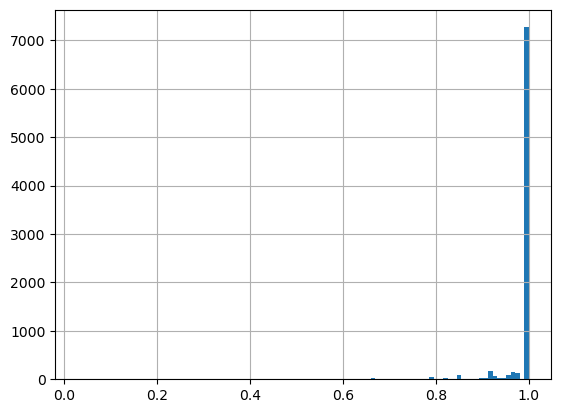

In [39]:
df[("apo", "site")].hist(bins=100)

<Axes: >

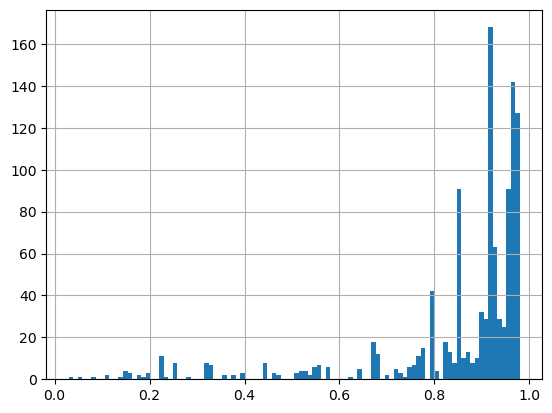

In [40]:
df[df[[("apo", "site")]] < 1][("apo", "site")].hist(bins=100)

### Overlapping structures without site overlap

In [41]:
temp = (
    df[
        (df["overlap"].mean(axis=1) > 0) & (df[("apo", "site")] < 0.5)
    ]
    .sort_values(("apo", "site"), ascending=False)
)
temp.drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")]).iloc[:40]

allodb                                                                 \
        pdb site_id label_asym_id   mod uniprot ulabel_asym_id  umin  umax   
5047   5npk    4103           [A]   [J]  P66937            [A]   417   641   
5048   5npk    4103           [A]   [J]  Q99XG5            [A]    10   491   
3875   6dhm    4488           [E]  [BA]  P00366            [E]    58   552   
3903   3kjn    2851        [A, B]   [D]  Q14790         [A, B]   223   479   
3863   6dhm    4488           [E]  [BA]  P00366            [E]    58   552   
5583   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5538   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5085   4b6e    2595           [B]   [E]  P26663            [B]  1029  1689   
5540   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5585   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5556   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5542   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5084   4b6e    2595           [B]   [E]  P26663            [B]  1029  1689   
5593   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5551   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
5533   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
4607   6c98    4165        [A, B]   [F]  P55899            [A]    27   290   
4608   6c98    4165        [A, B]   [F]  P61769            [B]    21   119   
5552   5xzr    3334           [A]   [B]  Q06124            [A]     1   534   
3152   6bky    3958        [A, B]   [I]  O75874         [A, B]     3   414   
4200   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
4206   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
4224   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
5079   4b6e    2595           [B]   [E]  P26663            [B]  1029  1689   
4218   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
4204   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
4216   5kcv    5629           [A]   [B]  P31749            [A]     6   438   
478    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
494    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
489    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
479    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
488    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
490    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
484    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
480    6hgj    4284        [A, B]   [C]  P01011         [A, B]    45   423   
6351   6x9h    4307           [A]   [E]  Q1XA76            [A]    43   454   
3173   5f2e    3086           [A]   [E]  P01116            [A]     1   167   
3197   5f2e    3086           [A]   [E]  P01116            [A]     1   167   
3202   5f2e    3086           [A]   [E]  P01116            [A]     1   167   
3183   5f2e    3086           [A]   [E]  P01116            [A]     1   167   

       apo                                                            \
       pdb       label_asym_id  site any_apo_chain  umin  umax usite   
5047  2xcq                 [A]  0.47          True   411   611  0.00   
5048  2xcq                 [A]  0.47          True    27   491  0.75   
3875  5k12  [A, B, C, D, E, F]  0.46          True   110   546  0.46   
3903  6px9              [A, B]  0.46          True   223   479  0.46   
3863  8ew0  [A, B, C, D, E, F]  0.46          True   110   546  0.46   
5583  3b7o                 [A]  0.44          True   246   528  0.44   
5538  7ppm                 [A]  0.44          True   246   527  0.44   
5085  3rvb                 [A]  0.44          True  1212  1656  0.44   
5540  7p

In [50]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5npk' ) & ( x[("apo", "pdb")] == '2xcq' )]

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
5047   5npk    4103           [A]  [J]  P66937            [A]   
5048   5npk    4103           [A]  [J]  Q99XG5            [A]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
5047     label_comp_id label_asym_id label_entity_id...  417  641  2xcq  ...   
5048     label_comp_id label_asym_id label_entity_id...   10  491  2xcq  ...   

                                                                        \
                                 ligands any_apo_chain umin umax usite   
5047  {'A': {('apo', 'has_lig'): False}}          True  411  611  0.00   
5048  {'A': {('apo', 'has_lig'): False}}          True   27  491  0.75   

           overlap                                          \
     a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
5047      0.970149      0.866667     0.795812     0.804233   
5048      1.000000      0.964730     1.000000     0.958506   

                                                 allodb  
                                                siteres  
5047     label_comp_id label_asym_id label_entity_id...  
5048     label_comp_id label_asym_id label_entity_id...  

[2 rows x 23 columns]

In [52]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5npk' ) & ( x[("apo", "pdb")] == '2xcq' )][("allodb", "siteres")].iloc[0].sort_values("pdbx_sifts_xref_db_num")

,label_comp_id,label_asym_id,label_entity_id,label_seq_id,pdbx_PDB_ins_code,auth_seq_id,auth_comp_id,auth_asym_id,pdbx_PDB_model_num,pdbx_label_index,pdbx_sifts_xref_db_name,pdbx_sifts_xref_db_acc,pdbx_sifts_xref_db_num,pdbx_sifts_xref_db_res
18,VAL,A,1,378,?,1177,VAL,B,1,378,UNP,Q99XG5,177,V
6,GLY,A,1,379,?,1178,GLY,B,1,379,UNP,Q99XG5,178,G
14,MET,A,1,380,?,1179,MET,B,1,380,UNP,Q99XG5,179,M
13,MET,A,1,228,?,1027,MET,B,1,228,UNP,Q99XG5,27,M
9,ILE,A,1,231,?,1030,ILE,B,1,231,UNP,Q99XG5,30,I
17,VAL,A,1,232,?,1031,VAL,B,1,232,UNP,Q99XG5,31,V
10,ILE,A,1,537,?,1336,ILE,B,1,537,UNP,Q99XG5,336,I
7,GLY,A,1,542,?,1341,GLY,B,1,542,UNP,Q99XG5,341,G
2,ARG,A,1,543,?,1342,ARG,B,1,543,UNP,Q99XG5,342,R
15,PRO,A,1,544,?,1343,PRO,B,1,544,UNP,Q99XG5,343,P


In [53]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5npk' ) & ( x[("apo", "pdb")] == '2xcq' )][("apo", "siteres")].iloc[0].sort_values("pdbx_sifts_xref_db_num")

,label_comp_id,label_asym_id,label_entity_id,label_seq_id,pdbx_PDB_ins_code,auth_seq_id,auth_comp_id,auth_asym_id,pdbx_PDB_model_num,pdbx_label_index,pdbx_sifts_xref_db_name,pdbx_sifts_xref_db_acc,pdbx_sifts_xref_db_num,pdbx_sifts_xref_db_res
0,MET,A,1,262,?,1027,MET,A,1,262,UNP,Q99XG5,27,M
1,ILE,A,1,265,?,1030,ILE,A,1,265,UNP,Q99XG5,30,I
2,VAL,A,1,266,?,1031,VAL,A,1,266,UNP,Q99XG5,31,V
3,ILE,A,1,571,?,1336,ILE,A,1,571,UNP,Q99XG5,336,I
4,GLY,A,1,576,?,1341,GLY,A,1,576,UNP,Q99XG5,341,G
5,ARG,A,1,577,?,1342,ARG,A,1,577,UNP,Q99XG5,342,R
6,PRO,A,1,578,?,1343,PRO,A,1,578,UNP,Q99XG5,343,P
7,LYS,A,1,579,?,1344,LYS,A,1,579,UNP,Q99XG5,344,K
8,LEU,A,1,580,?,1345,LEU,A,1,580,UNP,Q99XG5,345,L


In [55]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5npk' ) & ( x[("apo", "pdb")] == '2xcq' )][("apo", "siteres")].iloc[0].sort_values("pdbx_sifts_xref_db_num")

,label_comp_id,label_asym_id,label_entity_id,label_seq_id,pdbx_PDB_ins_code,auth_seq_id,auth_comp_id,auth_asym_id,pdbx_PDB_model_num,pdbx_label_index,pdbx_sifts_xref_db_name,pdbx_sifts_xref_db_acc,pdbx_sifts_xref_db_num,pdbx_sifts_xref_db_res
0,MET,A,1,262,?,1027,MET,A,1,262,UNP,Q99XG5,27,M
1,ILE,A,1,265,?,1030,ILE,A,1,265,UNP,Q99XG5,30,I
2,VAL,A,1,266,?,1031,VAL,A,1,266,UNP,Q99XG5,31,V
3,ILE,A,1,571,?,1336,ILE,A,1,571,UNP,Q99XG5,336,I
4,GLY,A,1,576,?,1341,GLY,A,1,576,UNP,Q99XG5,341,G
5,ARG,A,1,577,?,1342,ARG,A,1,577,UNP,Q99XG5,342,R
6,PRO,A,1,578,?,1343,PRO,A,1,578,UNP,Q99XG5,343,P
7,LYS,A,1,579,?,1344,LYS,A,1,579,UNP,Q99XG5,344,K
8,LEU,A,1,580,?,1345,LEU,A,1,580,UNP,Q99XG5,345,L


Indeed part of the site is not present.

<br>

### Threshold

In [56]:
temp = (
    df[
        (df["overlap"].mean(axis=1) > 0) & (df[("apo", "site")] >= 0.8)
    ]
    # temporary: pdbs not in database
    .loc[lambda x: [i not in dbpdbs for i in x[("apo", "pdb")]]]
    .sort_values(("apo", "site"), ascending=True)
    .drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")])
    .iloc[:40]
)
temp

allodb                                                                  \
        pdb site_id label_asym_id     mod uniprot ulabel_asym_id umin  umax   
6222   5gug     284           [A]     [C]  P11881            [A]    6  2217   
6118   6bbq    4220           [A]     [B]  P62330            [A]    2   173   
3330   6r4d    5721           [A]     [F]  O14965            [A]  127   391   
6401   1opl    2405           [A]     [C]  P00519            [A]   62   512   
363    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
341    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
8329   7dtu     961           [A]     [G]  P41180            [A]   21   859   
404    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
673    3i0s    2205           [A]     [C]  P04585            [A]  588  1144   
3621   2dz9     945           [A]     [C]  O57883            [A]    1   235   
388    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
661    3i0s    2205           [A]     [C]  P04585            [A]  588  1144   
309    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
475    1qqb    2516           [B]     [C]  P0ACP7            [B]    3   340   
407    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
340    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
476    1qqb    2516           [B]     [C]  P0ACP7            [B]    3   340   
659    3i0s    2205           [A]     [C]  P04585            [A]  588  1144   
7934   6px5    3051           [B]     [F]  P00734            [B]  364   620   
3147   6bky    3958        [A, B]     [I]  O75874         [A, B]    3   414   
335    1tjp    2283           [A]     [C]  P00929            [A]    1   267   
7497   8dwg    5855           [E]     [G]  Q96LB2            [E]   23   275   
2790   5dzh    1248           [A]     [E]  P03372            [A]  304   549   
5418   2fhy    1262        [A, D]  [F, L]  P09467         [A, D]   10   336   
3070   7anw    4289           [A]     [I]  Q6SZW1            [A]   56   700   
8350   6yz4    4412           [A]     [O]  O14733            [A]  101   404   
6857   6hv0    3398           [A]     [B]  O75460            [A]  562   963   
6864   6hv0    3398           [A]     [B]  O75460            [A]  562   963   
3059   7anw    4289           [A]     [I]  Q6SZW1            [A]   56   700   
5824   4nes    2314           [A]     [B]  Q58899            [A]    1   364   
6693   6ms7    5368           [A]  [C, D]  P37231            [A]  234   503   
8356   6yz4    4412           [A]     [O]  O14733            [A]  101   404   
6868   6hv0    3398           [A]     [B]  O75460            [A]  562   963   
6867   6hv0    3398           [A]     [B]  O75460            [A]  562   963   
8342   6yz4    4412           [A]     [O]  O14733            [A]  101   404   
4647   1q43    2415           [A]     [C]  O88703            [A]  443   635   
6263   5in4    4134        [A, B]     [G]  O60547         [A, B]   23   372   
4656   2zb2    1685           [A]     [D]  P06737            [A]   23   831   
6260   5in4    4134        [A, B]     [G]  O60547         [A, B]   23   372   
234    5mo6    5641           [B]     [C]  P68400            [B]    3   327   

       apo                                                          \
       pdb                                     label_asym_id  site   
6222  5x9z                                               [A]  0.80   
6118  3n5c                                               [A]  0.80   
3330  3w18                                               [A]  0.80   
6401  3qrj                                               [A]  0.80   
363   8b05                                               [A]  0.82   
341   4y6g                                               [A]  0.82   
8329  7e6u                                            [A, C]  0.82   
404   5bw6                                              

In [57]:
temp.loc[lambda x: ( x[("allodb", "pdb")] == '5gug' ) & ( x[("apo", "pdb")] == '5x9z' )]

allodb                                                               \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin  umax   
6222   5gug     284           [A]  [C]  P11881            [A]    6  2217   

       apo                                                         overlap  \
       pdb label_asym_id site any_apo_chain umin  umax usite a_in_h_minmax   
6222  5x9z           [A]  0.8          True    7  2217   0.8           1.0   

                                              
     h_in_a_minmax a_in_h_merge h_in_a_merge  
6222      0.999548     0.990058      0.98373

There are certain parts of the binding site that are unmodelled, as they are loops, but the site is present.

<br>

### Below threshold

In [58]:
no_site = set( df[("allodb", "pdb")].unique() ) - set( df[df[("apo", "site")] >= 0.8][("allodb", "pdb")].unique() )
len(no_site), no_site

(1, {'6vvd'})

In [59]:
(
    df
    .loc[ lambda x: [i in no_site for i in x[("allodb", "pdb")]] ]
    .drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")])
)

allodb                                                               apo  \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
5738   6vvd    4425           [A]  [D]  Q5ZSB6            [A]   24  317  6vvc   

                                                             overlap  \
     label_asym_id  site any_apo_chain umin umax usite a_in_h_minmax   
5738           [A]  0.74         False   10  321  0.74      0.942308   

                                              
     h_in_a_minmax a_in_h_merge h_in_a_merge  
5738           1.0     0.933333     0.903226

In [60]:
temp = (
    df
    .loc[lambda x: (i in no_site for i in x[("allodb", "pdb")]) ]
    .sort_values([("allodb", "pdb"), ("apo", "site")], ascending=False)
    .groupby(("allodb", "pdb"))
    .head(3)
)

temp.drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")])

allodb                                                               apo  \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
5738   6vvd    4425           [A]  [D]  Q5ZSB6            [A]   24  317  6vvc   

                                                             overlap  \
     label_asym_id  site any_apo_chain umin umax usite a_in_h_minmax   
5738           [A]  0.74         False   10  321  0.74      0.942308   

                                              
     h_in_a_minmax a_in_h_merge h_in_a_merge  
5738           1.0     0.933333     0.903226

In [61]:
temp.loc[lambda x: ( x[("allodb", "pdb")] == '6vvd' ) & ( x[("apo", "pdb")] == '6vvc' )]

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
5738   6vvd    4425           [A]  [D]  Q5ZSB6            [A]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
5738     label_comp_id label_asym_id label_entity_id...   24  317  6vvc  ...   

                                                                            \
                                                ligands any_apo_chain umin   
5738  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   10   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
5738  321  0.74      0.942308           1.0     0.933333     0.903226   

                                                 allodb  
                                                siteres  
5738     label_comp_id label_asym_id label_entity_id...  

[1 rows x 23 columns]

In [62]:
temp.loc[lambda x: ( x[("allodb", "pdb")] == '6vvd' ) & ( x[("apo", "pdb")] == '6vvc' )][("apo", "ligands")].item()

{'A': {('apo', 'has_lig'): True,
  ('apo', 'lig_types'): ['non-polymer'],
  ('apo',
   'lig'):   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  1           EDO             B               2            .                 ?   
  
    auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
  1         401          EDO            A                  1              401   
  
    pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
  1                       ?                      ?                      ?   
  
    pdbx_sifts_xref_db_res  
  1                      ?  }}

For 6vvd, 0.74 of overlap could be considered good enough althought it's low, and it has a ligand detected in the site, althought it is co-crystallization molecule (ethylene glycol).

<br>

In [63]:
filt_df = df[df[("apo", "site")] >= 0.8]

filt_df

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
0      6ta3    1195        [B, C]  [H]  P52732            [C]   
1      6ta3    1195        [B, C]  [H]  Q2XVP4            [B]   
2      5kwj    4036           [B]  [D]  P9WQN9            [B]   
3      5kwj    4036           [B]  [D]  P9WQN9            [B]   
4      5kwj    4036           [B]  [D]  P9WQN9            [B]   
...     ...     ...           ...  ...     ...            ...   
8369   5ue4    3310           [B]  [O]  P14780            [B]   
8372   5ue4    3310           [B]  [O]  P14780            [B]   
8376   5ue4    3310           [B]  [O]  P14780            [B]   
8381   5ue4    3310           [B]  [O]  P14780            [B]   
8387   5ue4    3310           [B]  [O]  P14780            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
0        label_comp_id label_asym_id label_entity_id...   15  369  6ta4  ...   
1        label_comp_id label_asym_id label_entity_id...    1  438  6ta4  ...   
2       label_comp_id label_asym_id label_entity_id ...   47  328  4qe3  ...   
3       label_comp_id label_asym_id label_entity_id ...   47  328  4qdx  ...   
4       label_comp_id label_asym_id label_entity_id ...   47  328  4qdt  ...   
...                                                 ...  ...  ...   ...  ...   
8369     label_comp_id label_asym_id label_entity_id...   41  444  5ue3  ...   
8372     label_comp_id label_asym_id label_entity_id...   41  444  8k5y  ...   
8376     label_comp_id label_asym_id label_entity_id...   41  444  8k5w  ...   
8381     label_comp_id label_asym_id label_entity_id...   41  444  5th6  ...   
8387     label_comp_id label_asym_id label_entity_id...   41  444  8k5v  ...   

                                                                            \
                                                ligands any_apo_chain umin   
0     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   17   
1     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    1   
2                    {'A': {('apo', 'has_lig'): False}}          True   52   
3                    {'A': {('apo', 'has_lig'): False}}          True   52   
4                    {'A': {('apo', 'has_lig'): False}}          True   52   
...                                                 ...           ...  ...   
8369                 {'A': {('apo', 'has_lig'): False}}          True   41   
8372  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   
8376  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   
8381                 {'A': {('apo', 'has_lig'): False}}          True   41   
8387  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
0     366  1.00      1.000000      0.985915     0.940000     0.985030   
1     438  1.00      1.000000      1.000000     1.000000     1.000000   
2     328  1.00      1.000000      0.982270     1.000000     0.946809   
3     328  1.00      1.000000      0.982270     1.000000     0.960993   
4     328  1.00      1.000000      0.982270     1.000000     0.968085   
...   ...   ...           ...           ...          ...          ...   
8369  443  1.00      1.000000      0.997525     0.960526     0.995455   
8372  444  1.00      0.992629      1.000000     0.948276     1.000000   
8376  444  0.94      0.992629      1.000000     0.956332     0.995455   
8381  443  1.00      1.000000      0.997525     0.986364     0.986364   
8387  444  0.94      0.992629      1.000000     0.948052     0.995455   

                                                 allodb  
                                                siteres  
0        label_comp_id label_asym_id 

## Chain overlap

In [64]:
no_chain = set( filt_df[("allodb", "pdb")].unique() ) - set( filt_df[filt_df["overlap"].mean(axis=1) >= 0.8][("allodb", "pdb")].unique() )
no_chain

{'3ho6', '4or2', '7p2l'}

In [65]:
temp = (
    filt_df
    .loc[lambda x: (i in no_chain for i in x[("allodb", "pdb")]) ]
    .loc[lambda x: x["overlap"].mean(axis=1).sort_values().index]
)

temp.drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")])

allodb                                                               apo  \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
5529   3ho6    3870           [B]  [D]  P16154            [B]  548  803  7pog   
5530   3ho6    3870           [B]  [D]  P16154            [B]  548  803  4r04   
6926   7p2l    5892           [A]  [B]  P41594            [A]  569  834  7fd9   
6925   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0f   
6932   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8t8m   
6923   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0e   
6924   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0g   
6922   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8t7h   
6931   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8t6j   
6928   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0d   
6933   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0c   
6930   7p2l    5892           [A]  [B]  P41594            [A]  569  834  6n51   
6927   7p2l    5892           [A]  [B]  P41594            [A]  569  834  6n52   
6929   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0b   
6934   7p2l    5892           [A]  [B]  P41594            [A]  569  834  8x0h   
5325   4or2    5878           [A]  [C]  Q13255            [A]  581  843  7dgd   
5324   4or2    5878           [A]  [C]  Q13255            [A]  581  843  7dge   

                                                             overlap  \
     label_asym_id site any_apo_chain umin  umax usite a_in_h_minmax   
5529           [A]  1.0          True    2  2383   1.0      0.107473   
5530           [A]  1.0          True    4  1802   1.0      0.142301   
6926        [A, B]  1.0          True   25   826   1.0      0.321696   
6925        [A, B]  1.0          True   25   827   1.0      0.322540   
6932        [A, B]  1.0          True   25   826   1.0      0.321696   
6923        [A, B]  1.0          True   25   827   1.0      0.322540   
6924        [A, B]  1.0          True   25   827   1.0      0.322540   
6922        [A, B]  1.0          True   25   827   1.0      0.322540   
6931        [A, B]  1.0         False   26   827   1.0      0.322943   
6928        [A, B]  1.0         False   25   827   1.0      0.322540   
6933        [A, B]  1.0         False   25   827   1.0      0.322540   
6930        [A, D]  1.0          True   23   826   1.0      0.320896   
6927        [A, B]  1.0          True   26   832   1.0      0.327138   
6929        [A, B]  1.0         False   25   827   1.0      0.322540   
6934        [A, B]  1.0          True   25   827   1.0      0.322540   
5325        [A, B]  1.0          True   35   839   1.0      0.321739   
5324        [A, B]  1.0          True   35   839   1.0      0.321739   

                                              
     h_in_a_minmax a_in_h_merge h_in_a_merge  
5529      1.000000     0.102435     1.000000  
5530      1.000000     0.136085     1.000000  
6926      0.969925     0.307692     0.936508  
6925      0.973684     0.308399     0.932540  
6932      0.969925     0.310300     0.944444  
6923      0.973684     0.311111     0.944444  
6924      0.973684     0.311111     0.944444  
6922      0.973684     0.308786     0.948413  
6931      0.973684     0.311604     0.948413  
6928      0.973684     0.313802     0.956349  
6933      0.973684     0.313802     0.956349  
6930      0.969925     0.307692     0.968254  
6927      0.992481     0.307494     0.944444  
6929      0.973684     0.314103     0.972222  
6934      0.973684     0.314103     0.972222  
5325      0.984791     0.319338     0.984314  
5324      0.984791     0.320153     0.984314

The found apo structures are much bigger than the holos and cover a bigger portion of the Uniprot, although the site is present in all of them.

<br>

In [67]:
filt_df = filt_df[filt_df["overlap"].mean(axis=1) >= 0.8]

filt_df

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
0      6ta3    1195        [B, C]  [H]  P52732            [C]   
1      6ta3    1195        [B, C]  [H]  Q2XVP4            [B]   
2      5kwj    4036           [B]  [D]  P9WQN9            [B]   
3      5kwj    4036           [B]  [D]  P9WQN9            [B]   
4      5kwj    4036           [B]  [D]  P9WQN9            [B]   
...     ...     ...           ...  ...     ...            ...   
8369   5ue4    3310           [B]  [O]  P14780            [B]   
8372   5ue4    3310           [B]  [O]  P14780            [B]   
8376   5ue4    3310           [B]  [O]  P14780            [B]   
8381   5ue4    3310           [B]  [O]  P14780            [B]   
8387   5ue4    3310           [B]  [O]  P14780            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
0        label_comp_id label_asym_id label_entity_id...   15  369  6ta4  ...   
1        label_comp_id label_asym_id label_entity_id...    1  438  6ta4  ...   
2       label_comp_id label_asym_id label_entity_id ...   47  328  4qe3  ...   
3       label_comp_id label_asym_id label_entity_id ...   47  328  4qdx  ...   
4       label_comp_id label_asym_id label_entity_id ...   47  328  4qdt  ...   
...                                                 ...  ...  ...   ...  ...   
8369     label_comp_id label_asym_id label_entity_id...   41  444  5ue3  ...   
8372     label_comp_id label_asym_id label_entity_id...   41  444  8k5y  ...   
8376     label_comp_id label_asym_id label_entity_id...   41  444  8k5w  ...   
8381     label_comp_id label_asym_id label_entity_id...   41  444  5th6  ...   
8387     label_comp_id label_asym_id label_entity_id...   41  444  8k5v  ...   

                                                                            \
                                                ligands any_apo_chain umin   
0     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   17   
1     {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    1   
2                    {'A': {('apo', 'has_lig'): False}}          True   52   
3                    {'A': {('apo', 'has_lig'): False}}          True   52   
4                    {'A': {('apo', 'has_lig'): False}}          True   52   
...                                                 ...           ...  ...   
8369                 {'A': {('apo', 'has_lig'): False}}          True   41   
8372  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   
8376  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   
8381                 {'A': {('apo', 'has_lig'): False}}          True   41   
8387  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   38   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
0     366  1.00      1.000000      0.985915     0.940000     0.985030   
1     438  1.00      1.000000      1.000000     1.000000     1.000000   
2     328  1.00      1.000000      0.982270     1.000000     0.946809   
3     328  1.00      1.000000      0.982270     1.000000     0.960993   
4     328  1.00      1.000000      0.982270     1.000000     0.968085   
...   ...   ...           ...           ...          ...          ...   
8369  443  1.00      1.000000      0.997525     0.960526     0.995455   
8372  444  1.00      0.992629      1.000000     0.948276     1.000000   
8376  444  0.94      0.992629      1.000000     0.956332     0.995455   
8381  443  1.00      1.000000      0.997525     0.986364     0.986364   
8387  444  0.94      0.992629      1.000000     0.948052     0.995455   

                                                 allodb  
                                                siteres  
0        label_comp_id label_asym_id 

## Ligs in site

In [68]:
no_apo = set( filt_df[("allodb", "pdb")].unique() ) - set( filt_df[filt_df[("apo", "any_apo_chain")] == True][("allodb", "pdb")].unique() )
len(no_apo), no_apo

(33,
 {'1egy',
  '1hkb',
  '1msv',
  '1zxm',
  '2him',
  '2o8e',
  '2zv2',
  '3auy',
  '3d2e',
  '3e5u',
  '3eps',
  '3i59',
  '3kh5',
  '3x1m',
  '4op0',
  '5c2o',
  '5hue',
  '5icn',
  '5in4',
  '5v03',
  '5wmv',
  '6bbq',
  '6gfm',
  '6hho',
  '6huj',
  '6izw',
  '6kkb',
  '6nzf',
  '6swx',
  '6ta3',
  '6wkn',
  '7ehm',
  '8hnn'})

In [69]:
temp = (
    filt_df
    .loc[lambda x: (i in no_apo for i in x[("allodb", "pdb")]) ]
    .sort_values(("allodb", "pdb"))
)
temp.drop(columns=[("allodb", "siteres"), ("allodb", "usiteres"), ("apo", "siteres"), ("apo", "ligands")])

allodb                                                               apo  \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
5863   1egy    4669           [A]  [D]  Q00441            [A]    2  404  1jip   
5866   1egy    4669           [A]  [D]  Q00441            [A]    2  404  1z8q   
5865   1egy    4669           [A]  [D]  Q00441            [A]    2  404  1z8o   
5860   1egy    4669           [A]  [D]  Q00441            [A]    2  404  1oxa   
5861   1egy    4669           [A]  [D]  Q00441            [A]    2  404  1jin   
...     ...     ...           ...  ...     ...            ...  ...  ...   ...   
3363   7ehm    4274           [A]  [C]  P13995            [A]   36  330  5tc4   
3358   7ehm    4274           [A]  [C]  P13995            [A]   36  330  6s4e   
3354   7ehm    4274           [A]  [C]  P13995            [A]   36  330  6s4f   
3439   8hnn    5841           [B]  [C]  P41145            [B]  252  276  8k2w   
3440   8hnn    5841           [B]  [C]  P49682            [B]   54  323  8k2w   

                                                            overlap  \
     label_asym_id site any_apo_chain umin umax usite a_in_h_minmax   
5863           [A]  1.0         False    2  404   1.0      1.000000   
5866           [A]  1.0         False    2  404   1.0      1.000000   
5865           [A]  1.0         False    3  404   1.0      1.000000   
5860           [A]  1.0         False    2  404   1.0      1.000000   
5861           [A]  1.0         False    2  404   1.0      1.000000   
...            ...  ...           ...  ...  ...   ...           ...   
3363           [A]  1.0         False   36  332   1.0      0.993266   
3358           [A]  1.0         False   36  332   1.0      0.993266   
3354        [A, B]  1.0         False   36  333   1.0      0.989933   
3439           [B]  1.0         False  252  276   1.0      1.000000   
3440           [B]  1.0         False   54  330   1.0      0.974729   

                                              
     h_in_a_minmax a_in_h_merge h_in_a_merge  
5863      1.000000     1.000000     1.000000  
5866      1.000000     1.000000     1.000000  
5865      0.997519     1.000000     0.997519  
5860      1.000000     1.000000     1.000000  
5861      1.000000     1.000000     1.000000  
...            ...          ...          ...  
3363      1.000000     0.969178     1.000000  
3358      1.000000     0.972509     1.000000  
3354      1.000000     0.949664     1.000000  
3439      1.000000     1.000000     1.000000  
3440      1.000000     0.973077     1.000000  

[298 rows x 19 columns]

In [70]:
temp.value_counts(("allodb", "pdb"))

(allodb, pdb)
5wmv    70
6kkb    30
6wkn    24
2o8e    17
2zv2    16
6nzf    14
6bbq    13
7ehm    12
1msv    12
6hho    12
4op0    10
6huj     9
1egy     7
1hkb     7
6izw     6
5icn     6
5in4     5
5v03     4
2him     3
1zxm     2
3auy     2
8hnn     2
3i59     2
3e5u     2
3x1m     2
6ta3     2
5hue     1
3eps     1
3kh5     1
3d2e     1
5c2o     1
6gfm     1
6swx     1
Name: count, dtype: int64

In [71]:
temp.loc[lambda x: x[("allodb", "pdb")] == "8hnn"]

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
3439   8hnn    5841           [B]  [C]  P41145            [B]   
3440   8hnn    5841           [B]  [C]  P49682            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
3439    label_comp_id label_asym_id label_entity_id ...  252  276  8k2w  ...   
3440     label_comp_id label_asym_id label_entity_id...   54  323  8k2w  ...   

                                                                            \
                                                ligands any_apo_chain umin   
3439  {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False  252   
3440  {'B': {('apo', 'has_lig'): True, ('apo', 'lig_...         False   54   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
3439  276   1.0      1.000000           1.0     1.000000          1.0   
3440  330   1.0      0.974729           1.0     0.973077          1.0   

                                                 allodb  
                                                siteres  
3439     label_comp_id label_asym_id label_entity_id...  
3440     label_comp_id label_asym_id label_entity_id...  

[2 rows x 23 columns]

In [72]:
temp.loc[lambda x: x[("allodb", "pdb")] == "8hnn"].iloc[-2][("apo", "ligands")]

{'B': {('apo', 'has_lig'): True,
  ('apo', 'lig_types'): ['non-polymer'],
  ('apo',
   'lig'):   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0           PCW             D               4            .                 ?   
  
    auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
  0         402          PCW            R                  1              402   
  
    pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
  0                       ?                      ?                      ?   
  
    pdbx_sifts_xref_db_res  
  0                      ?  }}

In [73]:
temp.loc[lambda x: x[("allodb", "pdb")] == "8hnn"].iloc[-1][("apo", "ligands")]

{'B': {('apo', 'has_lig'): True,
  ('apo', 'lig_types'): ['non-polymer'],
  ('apo',
   'lig'):   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0           PCW             D               4            .                 ?   
  
    auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
  0         402          PCW            R                  1              402   
  
    pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
  0                       ?                      ?                      ?   
  
    pdbx_sifts_xref_db_res  
  0                      ?  }}

The original structure has a small-molecule ligand and the other two have, in the same position, a lipid, so they aren't apo structures.

<br>

In [74]:
temp.loc[lambda x: x[("allodb", "pdb")] == "3kh5"]

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
3438   3kh5     894           [A]  [C]  Q58622            [A]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
3438     label_comp_id label_asym_id label_entity_id...    3  280  3lfz  ...   

                                                                            \
                                                ligands any_apo_chain umin   
3438  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    1   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
3438  280   1.0      0.992857           1.0     0.992857          1.0   

                                                 allodb  
                                                siteres  
3438     label_comp_id label_asym_id label_entity_id...  

[1 rows x 23 columns]

In [75]:
temp.loc[lambda x: x[("allodb", "pdb")] == "3kh5"].iloc[0][("apo", "ligands")]

{'A': {('apo', 'has_lig'): True,
  ('apo', 'lig_types'): ['non-polymer'],
  ('apo',
   'lig'):   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0           ATP             D               2            .                 ?   
  
    auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
  0         283          ATP            A                  1              283   
  
    pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
  0                       ?                      ?                      ?   
  
    pdbx_sifts_xref_db_res  
  0                      ?  }}

Both holo and "apo" structures have the same ligand.

<br>

In [79]:
filt_df = filt_df[filt_df[("apo", "any_apo_chain")] == True]
filt_df

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
2      5kwj    4036           [B]  [D]  P9WQN9            [B]   
3      5kwj    4036           [B]  [D]  P9WQN9            [B]   
4      5kwj    4036           [B]  [D]  P9WQN9            [B]   
5      5kwj    4036           [B]  [D]  P9WQN9            [B]   
6      5kwj    4036           [B]  [D]  P9WQN9            [B]   
...     ...     ...           ...  ...     ...            ...   
8360   6yz4    4412           [A]  [O]  O14733            [A]   
8361   6yz4    4412           [A]  [O]  O14733            [A]   
8362   5ue4    3310           [B]  [O]  P14780            [B]   
8369   5ue4    3310           [B]  [O]  P14780            [B]   
8381   5ue4    3310           [B]  [O]  P14780            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
2       label_comp_id label_asym_id label_entity_id ...   47  328  4qe3  ...   
3       label_comp_id label_asym_id label_entity_id ...   47  328  4qdx  ...   
4       label_comp_id label_asym_id label_entity_id ...   47  328  4qdt  ...   
5       label_comp_id label_asym_id label_entity_id ...   47  328  4mql  ...   
6       label_comp_id label_asym_id label_entity_id ...   47  328  4qek  ...   
...                                                 ...  ...  ...   ...  ...   
8360     label_comp_id label_asym_id label_entity_id...  101  404  7ovj  ...   
8361     label_comp_id label_asym_id label_entity_id...  101  404  5b2k  ...   
8362     label_comp_id label_asym_id label_entity_id...   41  444  1l6j  ...   
8369     label_comp_id label_asym_id label_entity_id...   41  444  5ue3  ...   
8381     label_comp_id label_asym_id label_entity_id...   41  444  5th6  ...   

                                                                        \
                                 ligands any_apo_chain umin umax usite   
2     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
3     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
4     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
5     {'A': {('apo', 'has_lig'): False}}          True   47  328  1.00   
6     {'A': {('apo', 'has_lig'): False}}          True   48  328  1.00   
...                                  ...           ...  ...  ...   ...   
8360  {'A': {('apo', 'has_lig'): False}}          True  102  403  0.96   
8361  {'A': {('apo', 'has_lig'): False}}          True  104  400  0.96   
8362  {'A': {('apo', 'has_lig'): False}}          True   29  444  1.00   
8369  {'A': {('apo', 'has_lig'): False}}          True   41  443  1.00   
8381  {'A': {('apo', 'has_lig'): False}}          True   41  443  1.00   

           overlap                                          \
     a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
2         1.000000      0.982270     1.000000     0.946809   
3         1.000000      0.982270     1.000000     0.960993   
4         1.000000      0.982270     1.000000     0.968085   
5         1.000000      1.000000     1.000000     1.000000   
6         1.000000      0.996454     1.000000     0.996454   
...            ...           ...          ...          ...   
8360      1.000000      0.993421     0.992754     0.944828   
8361      1.000000      0.976974     0.988636     0.900000   
8362      0.971154      1.000000     0.530864     0.977273   
8369      1.000000      0.997525     0.960526     0.995455   
8381      1.000000      0.997525     0.986364     0.986364   

                                                 allodb  
                                                siteres  
2       label_comp_id label_asym_id label_entity_id ...  
3       label_comp_id label_asym_id label_entity_id ...  
4       label_comp_id label_asym_id label_entity_id ...  
5       label_comp_id label_asym_id label_entity_id ...  


In [80]:
len(filt_df[("allodb", "pdb")].unique()), filt_df[("allodb", "pdb")].unique()

(215,
 array(['5kwj', '6t4k', '5mo6', '1tjp', '1og0', '5jv1', '5dl1', '1qqb',
        '6hgj', '4aau', '7juv', '5uyy', '5xez', '2b08', '2c2b', '3i0s',
        '4dpq', '2d5x', '7amj', '4bo1', '6mo1', '3kq7', '2qei', '8jii',
        '5y66', '6pgr', '2ha2', '5dzh', '7anw', '6e5g', '4pcu', '6bky',
        '4ejl', '5f2e', '6r4d', '6o0h', '4a79', '6ueg', '5ngz', '3smq',
        '4lrl', '5urj', '2ldb', '5lvx', '2dz9', '6bvn', '1jlr', '5fii',
        '5ifu', '7ljc', '2jfz', '6o0n', '5swo', '6w6d', '4dn0', '6dhm',
        '5on7', '5hot', '3kjn', '6shq', '4coj', '5tkb', '5mro', '6i5g',
        '2bu6', '4zsk', '6f7i', '6usa', '5kcv', '4avc', '3cmu', '5i73',
        '3c1n', '4ypl', '5oj0', '5f6y', '5htc', '5nxd', '6cwy', '6uxy',
        '1i6k', '5wsb', '8v8c', '2ylq', '6zgv', '5we8', '6jta', '6qu3',
        '6c98', '1q43', '2zb2', '3uvv', '6mc1', '5zwj', '5npk', '2p9g',
        '4b6e', '6z89', '6li0', '5o2d', '8jr9', '8tb7', '4ofg', '5y8t',
        '7lz4', '7c7q', '8jpf', '5kls', '6x83', '4mi4', '3

# Apo structure selection

In [118]:
apos = {}

## Multiple sites

In [81]:
# PDBs with multiple annotated sites and whether they are found/processed in any of the apos
multiple_sites = {
    p: {
        sid: sid in filt_df[("allodb", "site_id")].unique()
        for sid in sids
    }
    for p, g in filt_df.groupby(("allodb", "pdb"))
    for sids in [
        df.loc[lambda x: x[("allodb", "pdb")] == p]
        .loc[:, ("allodb", "site_id")]
        .unique(),
    ]
    if len(sids) > 1
}

multiple_sites

{'2d5x': {2662: False, 2664: True},
 '2zb2': {1684: True, 1685: True},
 '3kjn': {2850: True, 2851: True},
 '4gqq': {4853: True, 4856: True},
 '4z07': {310: True, 311: False},
 '5swo': {3007: True, 3008: True},
 '5wsb': {4148: True, 4149: True},
 '6dhm': {4487: True, 4488: True},
 '8fe1': {5788: True, 5793: True, 5794: True}}

In [83]:
multiple_sites_df = filt_df[filt_df[("allodb", "pdb")].isin(multiple_sites)]
multiple_sites_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])

/tmp/ipykernel_2551619/1490026758.py:2: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  multiple_sites_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])


allodb                                                     \
        pdb site_id label_asym_id   mod uniprot ulabel_asym_id   
810    2d5x    2664        [B, A]   [H]  P01958            [A]   
811    2d5x    2664        [B, A]   [H]  P02062            [B]   
795    2d5x    2664        [B, A]   [H]  P01958            [A]   
796    2d5x    2664        [B, A]   [H]  P02062            [B]   
819    2d5x    2664        [B, A]   [H]  P01958            [A]   
...     ...     ...           ...   ...     ...            ...   
7565   8fe1    5788        [A, E]   [H]  O93430            [A]   
7566   8fe1    5788        [A, E]   [H]  Q6DC22            [E]   
7567   8fe1    5793        [E, B]   [R]  O93430            [B]   
7568   8fe1    5793        [E, B]   [R]  Q6DC22            [E]   
7569   8fe1    5794        [B, C]  [FA]  O93430         [B, C]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
810      label_comp_id label_asym_id label_entity_id...    2  142  1g0b   
811      label_comp_id label_asym_id label_entity_id...    1  146  1g0b   
795      label_comp_id label_asym_id label_entity_id...    2  142  1ibe   
796      label_comp_id label_asym_id label_entity_id...    1  146  1ibe   
819      label_comp_id label_asym_id label_entity_id...    2  142  1ns6   
...                                                 ...  ...  ...   ...   
7565     label_comp_id label_asym_id label_entity_id...   33  444  7tvi   
7566     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7567     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   
7568     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7569     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   

                                                                            \
     label_asym_id site                                            siteres   
810            [A]  1.0     label_comp_id label_asym_id label_entity_id...   
811            [B]  1.0     label_comp_id label_asym_id label_entity_id...   
795            [A]  1.0     label_comp_id label_asym_id label_entity_id...   
796            [B]  1.0     label_comp_id label_asym_id label_entity_id...   
819            [A]  1.0     label_comp_id label_asym_id label_entity_id...   
...            ...  ...                                                ...   
7565  [A, B, C, D]  1.0     label_comp_id label_asym_id label_entity_id...   
7566           [E]  1.0     label_comp_id label_asym_id label_entity_id...   
7567  [A, B, C, D]  1.0     label_comp_id label_asym_id label_entity_id...   
7568           [E]  1.0     label_comp_id label_asym_id label_entity_id...   
7569  [A, B, C, D]  1.0      label_comp_id label_asym_id label_entity_i...   

                                                                            \
                                                ligands any_apo_chain umin   
810   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    2   
811   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    1   
795   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    2   
796   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    1   
819   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    2   
...                                                 ...           ...  ...   
7565  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   33   
7566  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   53   
7567  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   33   
7568  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   53   
7569  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   33   

                                                            allodb  
     umax usite                                            siteres  
81

In [84]:
# Holos that have all of their sites in the dataframe, and their apos that contain all of their sites
all_multiple_sites = {
    holo: tuple(
        apo
        for apo, apog in multiple_sites_df.loc[lambda x: x[("allodb", "pdb")] == holo].groupby(("apo", "pdb"))
        if set(v) == set(apog[("allodb", "site_id")].unique())
    )
    for holo, v in multiple_sites.items()
    if all(v.values())
}

all_multiple_sites

{'2zb2': ('1fc0', '8ems'),
 '3kjn': (),
 '4gqq': ('1kb3',
  '1kgu',
  '1kgw',
  '1kgx',
  '1xgz',
  '1xh0',
  '4w93',
  '4x9y',
  '5e0f',
  '5emy',
  '5kez',
  '5td4',
  '5u3a',
  '5va9',
  '6obx',
  '6ocn',
  '6z8l'),
 '5swo': ('3hhm',
  '3hiz',
  '4l1b',
  '4l23',
  '4l2y',
  '4ovu',
  '4ovv',
  '4waf',
  '4ykn',
  '5fi4',
  '5itd',
  '5sxj',
  '5xgh',
  '5xgi',
  '5xgj',
  '7myn',
  '7myo',
  '7pg5',
  '7pg6',
  '8am0',
  '8dcp',
  '8dcx',
  '8dd4',
  '8dd8',
  '8gub',
  '8ilr',
  '8ils',
  '8ilv',
  '8tdu',
  '8ts7',
  '8ts8',
  '8ts9',
  '8tsa',
  '8tsb',
  '8tsc',
  '8tsd',
  '8tu6',
  '8v8h',
  '8v8i',
  '8v8j',
  '8v8u',
  '8w9a',
  '8w9b'),
 '5wsb': ('5wrp',),
 '6dhm': ('1nr7', '3jcz', '6dhk', '7vda'),
 '8fe1': ('7tu9', '7tvi')}

In [85]:
# PDBs for which there aren't apos that meet the criteria for all sites of the holo
set(multiple_sites) - set(all_multiple_sites)

{'2d5x', '4z07'}

In [86]:
# PDBs for which there aren't apos that contain all sites of holo at the same time
set(all_multiple_sites) - set((k for k, v in all_multiple_sites.items() if len(v) > 0))

{'3kjn'}

### Apos with all sites

In [87]:
all_multiple_sites_df = multiple_sites_df[
    (
        multiple_sites_df[("allodb", "pdb")].isin(
            (k for k, v in all_multiple_sites.items() if len(v) > 0)
        )
    ) & (
         multiple_sites_df[("apo", "pdb")].isin(
            (apo for k, v in all_multiple_sites.items() if len(v) > 0 for apo in v)
        )
    )
]
all_multiple_sites_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])

/tmp/ipykernel_2551619/579619406.py:12: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  all_multiple_sites_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])


allodb                                                       \
        pdb site_id label_asym_id     mod uniprot ulabel_asym_id   
4657   2zb2    1684        [A, B]  [F, J]  P06737         [A, B]   
4658   2zb2    1685           [A]     [D]  P06737            [A]   
4655   2zb2    1684        [A, B]  [F, J]  P06737         [A, B]   
4656   2zb2    1685           [A]     [D]  P06737            [A]   
8285   4gqq    4853           [A]     [C]  P04746            [A]   
...     ...     ...           ...     ...     ...            ...   
7565   8fe1    5788        [A, E]     [H]  O93430            [A]   
7566   8fe1    5788        [A, E]     [H]  Q6DC22            [E]   
7567   8fe1    5793        [E, B]     [R]  O93430            [B]   
7568   8fe1    5793        [E, B]     [R]  Q6DC22            [E]   
7569   8fe1    5794        [B, C]    [FA]  O93430         [B, C]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
4657     label_comp_id label_asym_id label_entity_id...   23  831  1fc0   
4658     label_comp_id label_asym_id label_entity_id...   23  831  1fc0   
4655     label_comp_id label_asym_id label_entity_id...   23  831  8ems   
4656     label_comp_id label_asym_id label_entity_id...   23  831  8ems   
8285     label_comp_id label_asym_id label_entity_id...   16  511  1kb3   
...                                                 ...  ...  ...   ...   
7565     label_comp_id label_asym_id label_entity_id...   33  444  7tvi   
7566     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7567     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   
7568     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7569     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   

                                                                             \
     label_asym_id  site                                            siteres   
4657        [A, B]  1.00     label_comp_id label_asym_id label_entity_id...   
4658        [A, B]  1.00     label_comp_id label_asym_id label_entity_id...   
4655        [A, B]  1.00     label_comp_id label_asym_id label_entity_id...   
4656        [A, B]  0.84     label_comp_id label_asym_id label_entity_id...   
8285           [A]  1.00     label_comp_id label_asym_id label_entity_id...   
...            ...   ...                                                ...   
7565  [A, B, C, D]  1.00     label_comp_id label_asym_id label_entity_id...   
7566           [E]  1.00     label_comp_id label_asym_id label_entity_id...   
7567  [A, B, C, D]  1.00     label_comp_id label_asym_id label_entity_id...   
7568           [E]  1.00     label_comp_id label_asym_id label_entity_id...   
7569  [A, B, C, D]  1.00      label_comp_id label_asym_id label_entity_i...   

                                                                            \
                                                ligands any_apo_chain umin   
4657  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   24   
4658  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   24   
4655  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   25   
4656  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   25   
8285                 {'A': {('apo', 'has_lig'): False}}          True   16   
...                                                 ...           ...  ...   
7565  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   33   
7566  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   53   
7567  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   33   
7568  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   53   
7569  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   33   

                                                            allodb  
     umax usite                 

In [88]:
all_multiple_sites_d = {}

for holo, holog in all_multiple_sites_df.groupby(("allodb", "pdb")):
    d = {}
    
    # Iterate through the apos sorted by the mean of their site and chain overlaps
    for apo, g in (
        holog
        .sort_values(
            by = ("apo", "pdb"), 
            key = lambda x: (
                holog
                .groupby(("apo", "pdb"))[[
                    ("apo", "site"), ("overlap", "h_in_a_merge"), ("overlap", "a_in_h_merge")
                ]].transform('mean').mean(axis=1)
            ),
            ascending=False
        )
        .groupby(("apo", "pdb"))
    ):            
        if (
            len( 
                g[[("allodb", "site_id"), ("allodb", "uniprot")]].drop_duplicates()
            ) != len(
                df.loc[lambda x: x[("allodb", "pdb")] == holo][[("allodb", "site_id"), ("allodb", "uniprot")]].drop_duplicates()
            )
        ) or not all(
            g[[("allodb", "site_id"), ("allodb", "uniprot")]].drop_duplicates().sort_values([("allodb", "site_id"), ("allodb", "uniprot")]).reset_index(drop=True) == df.loc[lambda x: x[("allodb", "pdb")] == holo][[("allodb", "site_id"), ("allodb", "uniprot")]].drop_duplicates().sort_values([("allodb", "site_id"), ("allodb", "uniprot")]).reset_index(drop=True)
        ):
            d[apo] = "Doesn't have all sites-Uniprots"
            continue

        
        ups = df.loc[lambda x: x[("allodb", "pdb")] == holo][("allodb", "uniprot")].unique()
    
        # Skip if the apo pdb (len of the group) doesn't have all uniprots
        if len(ups) != len(g[("allodb", "uniprot")].unique()):
            d[apo] = "Doesn't have all uniprots"
            continue

        # Skip if not all chains are apo
        if not all(g[("apo", "any_apo_chain")]):
            d[apo] = "Not all apo chains"
            continue
            
        apo_chains = set(c for l in g[("apo", "label_asym_id")] for c in l)
        
        # Skip if the total chains identified in the apo structure doesn't match the total number of chains in the holo
        if len(apo_chains) != len(set(c for l in g[("allodb", "label_asym_id")] for c in l)):
            d[apo] = "Total apo # of chains is different than holo"
            continue

        d = {}
        d[apo] = list(apo_chains)            
        break
            
    all_multiple_sites_d[holo] = d

all_multiple_sites_d

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': 'Total apo # of chains is different than holo'},
 '6dhm': {'1nr7': 'Total apo # of chains is different than holo',
  '3jcz': 'Total apo # of chains is different than holo',
  '6dhk': 'Total apo # of chains is different than holo',
  '7vda': 'Total apo # of chains is different than holo'},
 '8fe1': {'7tu9': 'Total apo # of chains is different than holo',
  '7tvi': 'Total apo # of chains is different than holo'}}

##### Sanity checks

In [89]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '2zb2' ) & ( x[("apo", "pdb")] == '1fc0' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '4gqq' ) & ( x[("apo", "pdb")] == '1kb3' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '5swo' ) & ( x[("apo", "pdb")] == '3hhm' )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/3379149725.py:5: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                       \
        pdb site_id label_asym_id     mod uniprot ulabel_asym_id   
4657   2zb2    1684        [A, B]  [F, J]  P06737         [A, B]   
4658   2zb2    1685           [A]     [D]  P06737            [A]   
8285   4gqq    4853           [A]     [C]  P04746            [A]   
8286   4gqq    4856           [A]  [D, E]  P04746            [A]   
3724   5swo    3007           [A]     [D]  P42336            [A]   
3725   5swo    3008        [B, A]     [E]  P27986            [B]   
3726   5swo    3008        [B, A]     [E]  P42336            [A]   

                                                                     apo  \
                                               usiteres umin  umax   pdb   
4657     label_comp_id label_asym_id label_entity_id...   23   831  1fc0   
4658     label_comp_id label_asym_id label_entity_id...   23   831  1fc0   
8285     label_comp_id label_asym_id label_entity_id...   16   511  1kb3   
8286     label_comp_id label_asym_id label_entity_id...   16   511  1kb3   
3724     label_comp_id label_asym_id label_entity_id...    1  1052  3hhm   
3725    label_comp_id label_asym_id label_entity_id ...  327   598  3hhm   
3726     label_comp_id label_asym_id label_entity_id...    1  1052  3hhm   

                                                                            \
     label_asym_id site                                            siteres   
4657        [A, B]  1.0     label_comp_id label_asym_id label_entity_id...   
4658        [A, B]  1.0     label_comp_id label_asym_id label_entity_id...   
8285           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
8286           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
3724           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
3725           [B]  1.0     label_comp_id label_asym_id label_entity_id...   
3726           [A]  1.0     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
4657  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   24   
4658  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   24   
8285                 {'A': {('apo', 'has_lig'): False}}          True   16   
8286                 {'A': {('apo', 'has_lig'): False}}          True   16   
3724                 {'A': {('apo', 'has_lig'): False}}          True    5   
3725  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True  326   
3726  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True    5   

                                                             allodb  
      umax usite                                            siteres  
4657   832   1.0     label_comp_id label_asym_id label_entity_id...  
4658   832   1.0     label_comp_id label_asym_id label_entity_id...  
8285   511   1.0     label_comp_id label_asym_id label_entity_id...  
8286   511   1.0     label_comp_id label_asym_id label_entity_id...  
3724  1062   1.0     label_comp_id label_asym_id label_entity_id...  
3725   579   1.0     label_comp_id label_asym_id label_entity_id...  
3726  1062   1.0     label_comp_id label_asym_id label_entity_id...

In [90]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5swo' ) & ( x[("apo", "pdb")] == '3hhm' )].iloc[1][("apo", "ligands")]

{'A': {('apo', 'has_lig'): True,
  ('apo', 'lig_types'): ['polymer'],
  ('apo',
   'lig'):   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  1           ARG             B               2           19                 ?   
  
    auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
  1         340          ARG            B                  1               19   
  
    pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
  1                     UNP                 P27986                    340   
  
    pdbx_sifts_xref_db_res  
  1                      R  },
 'B': {('apo', 'has_lig'): False}}

The identified apos are correct. The apo for 5swo appears to have a ligand in the site corresponding to site_id 3008 in chain A, but it's just a residue of chain B that has been mistakenly detected as ligand by the analysis pipeline.

<br>

In [91]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '5wsb' ) & ( x[("apo", "pdb")] == '5wrp' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '6dhm' ) & ( x[("apo", "pdb")].isin(['1nr7', '3jcz', '6dhk', '7vda']) )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '8fe1' ) & ( x[("apo", "pdb")].isin(['7tu9', '7tvi']) )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/3953996406.py:5: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                     \
        pdb site_id label_asym_id   mod uniprot ulabel_asym_id   
4469   5wsb    4148           [A]   [E]  P9WKE5            [A]   
4470   5wsb    4149           [A]   [F]  P9WKE5            [A]   
3854   6dhm    4487           [E]  [CA]  P00366            [E]   
3855   6dhm    4488           [E]  [BA]  P00366            [E]   
3858   6dhm    4487           [E]  [CA]  P00366            [E]   
3859   6dhm    4488           [E]  [BA]  P00366            [E]   
3868   6dhm    4487           [E]  [CA]  P00366            [E]   
3869   6dhm    4488           [E]  [BA]  P00366            [E]   
3876   6dhm    4487           [E]  [CA]  P00366            [E]   
3877   6dhm    4488           [E]  [BA]  P00366            [E]   
7560   8fe1    5788        [A, E]   [H]  O93430            [A]   
7561   8fe1    5788        [A, E]   [H]  Q6DC22            [E]   
7562   8fe1    5793        [E, B]   [R]  O93430            [B]   
7563   8fe1    5793        [E, B]   [R]  Q6DC22            [E]   
7564   8fe1    5794        [B, C]  [FA]  O93430         [B, C]   
7565   8fe1    5788        [A, E]   [H]  O93430            [A]   
7566   8fe1    5788        [A, E]   [H]  Q6DC22            [E]   
7567   8fe1    5793        [E, B]   [R]  O93430            [B]   
7568   8fe1    5793        [E, B]   [R]  Q6DC22            [E]   
7569   8fe1    5794        [B, C]  [FA]  O93430         [B, C]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
4469     label_comp_id label_asym_id label_entity_id...    2  472  5wrp   
4470     label_comp_id label_asym_id label_entity_id...    2  472  5wrp   
3854     label_comp_id label_asym_id label_entity_id...   58  552  1nr7   
3855     label_comp_id label_asym_id label_entity_id...   58  552  1nr7   
3858     label_comp_id label_asym_id label_entity_id...   58  552  3jcz   
3859     label_comp_id label_asym_id label_entity_id...   58  552  3jcz   
3868     label_comp_id label_asym_id label_entity_id...   58  552  7vda   
3869     label_comp_id label_asym_id label_entity_id...   58  552  7vda   
3876     label_comp_id label_asym_id label_entity_id...   58  552  6dhk   
3877     label_comp_id label_asym_id label_entity_id...   58  552  6dhk   
7560     label_comp_id label_asym_id label_entity_id...   33  444  7tu9   
7561     label_comp_id label_asym_id label_entity_id...   40  494  7tu9   
7562     label_comp_id label_asym_id label_entity_id...   31  444  7tu9   
7563     label_comp_id label_asym_id label_entity_id...   40  494  7tu9   
7564     label_comp_id label_asym_id label_entity_id...   31  444  7tu9   
7565     label_comp_id label_asym_id label_entity_id...   33  444  7tvi   
7566     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7567     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   
7568     label_comp_id label_asym_id label_entity_id...   40  494  7tvi   
7569     label_comp_id label_asym_id label_entity_id...   31  444  7tvi   

                               \
           label_asym_id site   
4469        [A, B, C, D]  1.0   
4470        [A, B, C, D]  1.0   
3854  [A, B, C, D, E, F]  1.0   
3855  [A, B, C, D, E, F]  1.0   
3858  [A, B, C, D, E, F]  1.0   
3859  [A, B, C, D, E, F]  1.0   
3868  [A, B, C, D, E, F]  1.0   
3869  [A, B, C, D, E, F]  1.0   
3876  [A, B, C, D, E, F]  1.0   
3877  [A, B, C, D, E, F]  1.0   
7560        [A, B, C, D]  1.0   
7561                 [E]  1.0   
7562        [A, B, C, D]  1.0   
7563                 [E]  1.0   
7564        [A, B, C, D]  1.0   
7565        [A, B, C, D]  1.0   
7566                 [E]  1.0   
7567        [A, B, C, D]  1.0   
7568                 [E]  1.0   
7569        [A, B, C, D]  1.0   

                                                         \
                                                siteres   
4469      label_comp_id label_asym_id label_entity_i... 

The holos for 5wsb and 6dhm are a single chain, while the apos are multi-chain structures (it is assumed that for each, all chains will be the same protein (same Uniprot)). One ligand-free chain of the apo can be manually selected for these two: chain A of 5wrp (and RMSD 1.66, TM-score 0.96 with the selected chain of the holo) and chain A of 1NR7 (first match) (and RMSD 2.58, TM-score 0.91 with the selected chain of the holo).

For 8fe1, selecting chains would require that the quaternary conformation of the selected chains of the apo matches the one of the holo in relative structural location.

<br>

In [119]:
apos.update({
    '2zb2': {'1fc0': ['B', 'A']},
    '4gqq': {'1kb3': ['A']},
    '5swo': {'3hhm': ['B', 'A']},
    '5wsb': {'5wrp': ['A']},
    '6dhm': {'1nr7': ['A']},
})

apos

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': ['A']},
 '6dhm': {'1nr7': ['A']}}

In [93]:
print(len(filt_df[("allodb", "pdb")].unique()))
filt_df = filt_df[~filt_df[("allodb", "pdb")].isin(multiple_sites)]
print(len(filt_df[("allodb", "pdb")].unique()))

215
206


## Heteromers

In [94]:
heteromers = [
    p for p, g in filt_df.groupby(("allodb", "pdb"))
    if len(
        df.loc[lambda x: x[("allodb", "pdb")] == p]
        .loc[:, ("allodb", "uniprot")]
        .unique()
    ) > 1
]
print(heteromers)

['5iov', '5npk', '6c98', '6cwy', '6iq4', '6usa', '7c7q', '7juv', '8jr9']


In [95]:
heteromers_df = filt_df[filt_df[("allodb", "pdb")].isin(heteromers)]
heteromers_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])

/tmp/ipykernel_2551619/501108883.py:2: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  heteromers_df.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])


allodb                                                        \
        pdb site_id label_asym_id  mod     uniprot ulabel_asym_id   
6833   5iov    4210        [C, A]  [G]  A0A1L8F5J9            [A]   
6834   5iov    4210        [C, A]  [G]      A7XY94            [C]   
6837   5iov    4210        [C, A]  [G]  A0A1L8F5J9            [A]   
6838   5iov    4210        [C, A]  [G]      A7XY94            [C]   
6845   5iov    4210        [C, A]  [G]  A0A1L8F5J9            [A]   
...     ...     ...           ...  ...         ...            ...   
5108   8jr9    5869        [E, A]  [F]      Q03431            [E]   
5105   8jr9    5869        [E, A]  [F]      P63092            [A]   
5106   8jr9    5869        [E, A]  [F]      Q03431            [E]   
5109   8jr9    5869        [E, A]  [F]      P63092            [A]   
5110   8jr9    5869        [E, A]  [F]      Q03431            [E]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
6833     label_comp_id label_asym_id label_entity_id...   23  834  5iou   
6834     label_comp_id label_asym_id label_entity_id...   28  839  5iou   
6837     label_comp_id label_asym_id label_entity_id...   23  834  5ipq   
6838     label_comp_id label_asym_id label_entity_id...   28  839  5ipq   
6845     label_comp_id label_asym_id label_entity_id...   23  834  5ipr   
...                                                 ...  ...  ...   ...   
5108     label_comp_id label_asym_id label_entity_id...  185  481  7vvl   
5105     label_comp_id label_asym_id label_entity_id...   27  394  7vvn   
5106     label_comp_id label_asym_id label_entity_id...  185  481  7vvn   
5109     label_comp_id label_asym_id label_entity_id...   27  394  7vvo   
5110     label_comp_id label_asym_id label_entity_id...  185  481  7vvo   

                                                                            \
     label_asym_id site                                            siteres   
6833        [A, B]  1.0     label_comp_id label_asym_id label_entity_id...   
6834        [C, D]  1.0     label_comp_id label_asym_id label_entity_id...   
6837        [A, C]  1.0     label_comp_id label_asym_id label_entity_id...   
6838        [B, D]  1.0     label_comp_id label_asym_id label_entity_id...   
6845        [A, C]  1.0     label_comp_id label_asym_id label_entity_id...   
...            ...  ...                                                ...   
5108           [F]  1.0     label_comp_id label_asym_id label_entity_id...   
5105           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
5106           [F]  1.0     label_comp_id label_asym_id label_entity_id...   
5109           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
5110           [F]  1.0     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
6833  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   23   
6834  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   28   
6837  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   23   
6838  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   26   
6845  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   23   
...                                                 ...           ...  ...   
5108  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   31   
5105  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   12   
5106  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   33   
5109  {'A': {('apo', 'has_lig'): False}, 'F': {('apo...          True   12   
5110  {'A': {('apo', 'has_lig'): False}, 'F': {('apo...          True   33   

                                                            allodb  
     umax usite                 

In [96]:
heteromers_d = {}

for holo, holog in heteromers_df.groupby(("allodb", "pdb")):
    d = {}
    
    # Iterate through the apos sorted by the mean of their site and chain overlaps
    for apo, g in (
        holog
        .sort_values(
            by = ("apo", "pdb"), 
            key = lambda x: (
                holog
                .groupby(("apo", "pdb"))[[
                    ("apo", "site"), ("overlap", "h_in_a_merge"), ("overlap", "a_in_h_merge")
                ]].transform('mean').mean(axis=1)
            ),
            ascending=False
        )
        .groupby(("apo", "pdb"))
    ):
        ups = df.loc[lambda x: x[("allodb", "pdb")] == holo][("allodb", "uniprot")].unique()
    
        # Skip if the apo pdb (len of the group) doesn't have all uniprots
        if len(ups) != len(g[("allodb", "uniprot")].unique()):
            d[apo] = "Doesn't have all uniprots"
            continue

        # Skip if each uniprot doesn't have the same number of chains in the holo and in the apo
        if not all(
            len(row[("allodb", "ulabel_asym_id")]) == len(row[("apo", "label_asym_id")])
            for i, row in g.iterrows()
        ): 
            d[apo] = "Some Uniprots have diff. # of chains"
            continue

        # Skip if not all chains are apo
        if not all(g[("apo", "any_apo_chain")]):
            d[apo] = "Not all apo chains"
            continue
            
        apo_chains = set(c for l in g[("apo", "label_asym_id")] for c in l)
        
        # Skip if the total chains identified in the apo structure doesn't match the total number of chains in the holo
        if len(apo_chains) != len(set(c for l in g[("allodb", "label_asym_id")] for c in l)):
            d[apo] = "Total apo # of chains is different than holo"
            continue

        d = {}
        d[apo] = list(apo_chains)            
        break
            
    heteromers_d[holo] = d

heteromers_d

{'5iov': {'5iou': 'Some Uniprots have diff. # of chains',
  '5ipq': 'Some Uniprots have diff. # of chains',
  '5ipr': 'Some Uniprots have diff. # of chains',
  '5ips': 'Some Uniprots have diff. # of chains',
  '5ipt': 'Some Uniprots have diff. # of chains',
  '5ipu': 'Some Uniprots have diff. # of chains',
  '5ipv': 'Some Uniprots have diff. # of chains',
  '5uow': 'Some Uniprots have diff. # of chains',
  '5up2': 'Some Uniprots have diff. # of chains'},
 '5npk': {'2xcr': 'Some Uniprots have diff. # of chains',
  '2xcs': 'Some Uniprots have diff. # of chains',
  '2xct': 'Some Uniprots have diff. # of chains',
  '4bul': 'Some Uniprots have diff. # of chains',
  '5cdo': 'Some Uniprots have diff. # of chains',
  '5cdp': 'Some Uniprots have diff. # of chains',
  '5cdq': 'Some Uniprots have diff. # of chains',
  '5cdr': 'Some Uniprots have diff. # of chains',
  '5iwi': 'Some Uniprots have diff. # of chains',
  '5iwm': 'Some Uniprots have diff. # of chains',
  '6fm4': 'Some Uniprots have dif

##### Sanity checks

In [97]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '6c98' ) & ( x[("apo", "pdb")] == '1exu' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '6cwy' ) & ( x[("apo", "pdb")] == '1y8q' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '6iq4' ) & ( x[("apo", "pdb")] == '7xti' )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/2799822185.py:5: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
4615   6c98    4165        [A, B]  [F]  P55899            [A]   
4616   6c98    4165        [A, B]  [F]  P61769            [B]   
4386   6cwy    4354        [A, B]  [K]  Q9UBE0            [A]   
4387   6cwy    4354        [A, B]  [K]  Q9UBT2            [B]   
7310   6iq4    4291        [G, H]  [N]  P04908            [G]   
7311   6iq4    4291        [G, H]  [N]  P06899            [H]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
4615     label_comp_id label_asym_id label_entity_id...   27  290  1exu   
4616     label_comp_id label_asym_id label_entity_id...   21  119  1exu   
4386     label_comp_id label_asym_id label_entity_id...   17  346  1y8q   
4387     label_comp_id label_asym_id label_entity_id...    3  548  1y8q   
7310     label_comp_id label_asym_id label_entity_id...   15  120  7xti   
7311     label_comp_id label_asym_id label_entity_id...   32  126  7xti   

                                                                            \
     label_asym_id site                                            siteres   
4615           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
4616           [B]  1.0     label_comp_id label_asym_id label_entity_id...   
4386           [A]  1.0     label_comp_id label_asym_id label_entity_id...   
4387           [B]  1.0     label_comp_id label_asym_id label_entity_id...   
7310          [DA]  1.0     label_comp_id label_asym_id label_entity_id...   
7311          [EA]  1.0     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
4615  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   27   
4616  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   21   
4386  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   10   
4387  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True    6   
7310  {'DA': {('apo', 'has_lig'): False}, 'EA': {('a...          True   15   
7311  {'DA': {('apo', 'has_lig'): False}, 'EA': {('a...          True   33   

                                                            allodb  
     umax usite                                            siteres  
4615  290   1.0     label_comp_id label_asym_id label_entity_id...  
4616  119   1.0     label_comp_id label_asym_id label_entity_id...  
4386  345   1.0     label_comp_id label_asym_id label_entity_id...  
4387  550   1.0     label_comp_id label_asym_id label_entity_id...  
7310  106   1.0     label_comp_id label_asym_id label_entity_id...  
7311  125   1.0     label_comp_id label_asym_id label_entity_id...

These selected apos are correct.

<br>

In [99]:
df.loc[lambda x: ( x[("allodb", "pdb")] == '5iov' ) & ( x[("apo", "pdb")] == '5iou' )].drop(columns="overlap")

/tmp/ipykernel_2551619/2549970395.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df.loc[lambda x: ( x[("allodb", "pdb")] == '5iov' ) & ( x[("apo", "pdb")] == '5iou' )].drop(columns="overlap")


allodb                                                        \
        pdb site_id label_asym_id  mod     uniprot ulabel_asym_id   
6833   5iov    4210        [C, A]  [G]  A0A1L8F5J9            [A]   
6834   5iov    4210        [C, A]  [G]      A7XY94            [C]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
6833     label_comp_id label_asym_id label_entity_id...   23  834  5iou   
6834     label_comp_id label_asym_id label_entity_id...   28  839  5iou   

                                                                            \
     label_asym_id site                                            siteres   
6833        [A, B]  1.0     label_comp_id label_asym_id label_entity_id...   
6834        [C, D]  1.0     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
6833  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   23   
6834  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   28   

                                                            allodb  
     umax usite                                            siteres  
6833  834   1.0     label_comp_id label_asym_id label_entity_id...  
6834  839   1.0     label_comp_id label_asym_id label_entity_id...

Selecting chains for these holos would require that the quaternary conformation of the selected chains of the apo matches the one of the holo in relative structural location.

<br>

In [120]:
apos.update({
    k: v
    for k, v in heteromers_d.items()
    if len(v) == 1 and type(list(v.values())[0]) == list
})

apos

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': ['A']},
 '6dhm': {'1nr7': ['A']},
 '6c98': {'1exu': ['B', 'A']},
 '6cwy': {'1y8q': ['B', 'A']},
 '6iq4': {'7xti': ['DA', 'EA']},
 '7c7q': {'6uo9': ['B', 'A']},
 '7juv': {'2y4i': ['B', 'A']},
 '8jr9': {'7vvj': ['A', 'F']}}

In [101]:
print(len(filt_df[("allodb", "pdb")].unique()))
filt_df = filt_df[~filt_df[("allodb", "pdb")].isin(heteromers)]
print(len(filt_df[("allodb", "pdb")].unique()))

206
197


## Homomers and monomers

In [102]:
filt_df

allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
2      5kwj    4036           [B]  [D]  P9WQN9            [B]   
3      5kwj    4036           [B]  [D]  P9WQN9            [B]   
4      5kwj    4036           [B]  [D]  P9WQN9            [B]   
5      5kwj    4036           [B]  [D]  P9WQN9            [B]   
6      5kwj    4036           [B]  [D]  P9WQN9            [B]   
...     ...     ...           ...  ...     ...            ...   
8360   6yz4    4412           [A]  [O]  O14733            [A]   
8361   6yz4    4412           [A]  [O]  O14733            [A]   
8362   5ue4    3310           [B]  [O]  P14780            [B]   
8369   5ue4    3310           [B]  [O]  P14780            [B]   
8381   5ue4    3310           [B]  [O]  P14780            [B]   

                                                                    apo  ...  \
                                               usiteres umin umax   pdb  ...   
2       label_comp_id label_asym_id label_entity_id ...   47  328  4qe3  ...   
3       label_comp_id label_asym_id label_entity_id ...   47  328  4qdx  ...   
4       label_comp_id label_asym_id label_entity_id ...   47  328  4qdt  ...   
5       label_comp_id label_asym_id label_entity_id ...   47  328  4mql  ...   
6       label_comp_id label_asym_id label_entity_id ...   47  328  4qek  ...   
...                                                 ...  ...  ...   ...  ...   
8360     label_comp_id label_asym_id label_entity_id...  101  404  7ovj  ...   
8361     label_comp_id label_asym_id label_entity_id...  101  404  5b2k  ...   
8362     label_comp_id label_asym_id label_entity_id...   41  444  1l6j  ...   
8369     label_comp_id label_asym_id label_entity_id...   41  444  5ue3  ...   
8381     label_comp_id label_asym_id label_entity_id...   41  444  5th6  ...   

                                                                        \
                                 ligands any_apo_chain umin umax usite   
2     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
3     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
4     {'A': {('apo', 'has_lig'): False}}          True   52  328  1.00   
5     {'A': {('apo', 'has_lig'): False}}          True   47  328  1.00   
6     {'A': {('apo', 'has_lig'): False}}          True   48  328  1.00   
...                                  ...           ...  ...  ...   ...   
8360  {'A': {('apo', 'has_lig'): False}}          True  102  403  0.96   
8361  {'A': {('apo', 'has_lig'): False}}          True  104  400  0.96   
8362  {'A': {('apo', 'has_lig'): False}}          True   29  444  1.00   
8369  {'A': {('apo', 'has_lig'): False}}          True   41  443  1.00   
8381  {'A': {('apo', 'has_lig'): False}}          True   41  443  1.00   

           overlap                                          \
     a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
2         1.000000      0.982270     1.000000     0.946809   
3         1.000000      0.982270     1.000000     0.960993   
4         1.000000      0.982270     1.000000     0.968085   
5         1.000000      1.000000     1.000000     1.000000   
6         1.000000      0.996454     1.000000     0.996454   
...            ...           ...          ...          ...   
8360      1.000000      0.993421     0.992754     0.944828   
8361      1.000000      0.976974     0.988636     0.900000   
8362      0.971154      1.000000     0.530864     0.977273   
8369      1.000000      0.997525     0.960526     0.995455   
8381      1.000000      0.997525     0.986364     0.986364   

                                                 allodb  
                                                siteres  
2       label_comp_id label_asym_id label_entity_id ...  
3       label_comp_id label_asym_id label_entity_id ...  
4       label_comp_id label_asym_id label_entity_id ...  
5       label_comp_id label_asym_id label_entity_id ...  


In [103]:
mers_d = {}

for holo, holog in filt_df.groupby(("allodb", "pdb")):
    d = {}
    
    # Iterate through the apos sorted by the mean of their site and chain overlaps
    for apo, g in (
        holog
        .sort_values(
            by = ("apo", "pdb"), 
            key = lambda x: (
                holog
                .groupby(("apo", "pdb"))[[
                    ("apo", "site"), ("overlap", "h_in_a_merge"), ("overlap", "a_in_h_merge")
                ]].transform('mean').mean(axis=1)
            ),
            ascending=False
        )
        .groupby(("apo", "pdb"))
    ):
        ups = df.loc[lambda x: x[("allodb", "pdb")] == holo][("allodb", "uniprot")].unique()
    
        # Skip if the apo pdb (len of the group) doesn't have all uniprots
        if len(ups) != len(g[("allodb", "uniprot")].unique()):
            d[apo] = "Doesn't have all uniprots"
            continue

        # Skip if each uniprot doesn't have the same number of chains in the holo and in the apo
        if not all(
            len(row[("allodb", "ulabel_asym_id")]) == len(row[("apo", "label_asym_id")])
            for i, row in g.iterrows()
        ): 
            d[apo] = "Some Uniprots have diff. # of chains"
            continue

        # Skip if not all chains are apo
        if not all(g[("apo", "any_apo_chain")]):
            d[apo] = "Not all apo chains"
            continue
            
        apo_chains = set(c for l in g[("apo", "label_asym_id")] for c in l)
        
        # Skip if the total chains identified in the apo structure doesn't match the total number of chains in the holo
        if len(apo_chains) != len(set(c for l in g[("allodb", "label_asym_id")] for c in l)):
            d[apo] = "Total apo # of chains is different than holo"
            continue

        d = {}
        d[apo] = list(apo_chains)            
        break
            
    mers_d[holo] = d

mers_d

{'1bj4': {'8a11': 'Some Uniprots have diff. # of chains',
  '8r7h': 'Some Uniprots have diff. # of chains'},
 '1ecb': {'1ecj': ['B', 'A']},
 '1i6k': {'1d2r': 'Some Uniprots have diff. # of chains'},
 '1jlr': {'1bd3': 'Some Uniprots have diff. # of chains',
  '1bd4': 'Some Uniprots have diff. # of chains',
  '1jls': 'Some Uniprots have diff. # of chains',
  '1upf': 'Some Uniprots have diff. # of chains',
  '1upu': 'Some Uniprots have diff. # of chains'},
 '1kmp': {'1kmo': ['A']},
 '1og0': {'1hfb': ['B', 'A']},
 '1opl': {'2f4j': ['A']},
 '1q43': {'5jon': ['A']},
 '1qqb': {'1dbq': 'Some Uniprots have diff. # of chains',
  '1jhz': 'Some Uniprots have diff. # of chains'},
 '1rd4': {'1dgq': ['A']},
 '1t5a': {'1zjh': ['A']},
 '1tbf': {'1t9r': ['A']},
 '1tjp': {'1ubs': ['A']},
 '1vea': {'1wps': ['B', 'A']},
 '1ygc': {'1jbu': 'Some Uniprots have diff. # of chains',
  '1klj': 'Some Uniprots have diff. # of chains',
  '5pa8': 'Some Uniprots have diff. # of chains',
  '8cn9': 'Some Uniprots have d

##### Sanity checks

In [104]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1ecb' ) & ( x[("apo", "pdb")] == '1ecj' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1kmp' ) & ( x[("apo", "pdb")] == '1kmo' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1og0' ) & ( x[("apo", "pdb")] == '1hfb' )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/577942428.py:5: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                             \
        pdb site_id label_asym_id           mod uniprot ulabel_asym_id   
6069   1ecb    4667        [A, B]           [G]  P0AG16         [A, B]   
6225   1kmp    4493           [A]  [B, C, E, G]  P13036            [A]   
419    1og0     795        [A, B]           [J]  P32449         [A, B]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
6069     label_comp_id label_asym_id label_entity_id...    2  482  1ecj   
6225     label_comp_id label_asym_id label_entity_id...  128  774  1kmo   
419      label_comp_id label_asym_id label_entity_id...   18  370  1hfb   

                                                                             \
     label_asym_id  site                                            siteres   
6069        [A, B]  1.00     label_comp_id label_asym_id label_entity_id...   
6225           [A]  1.00     label_comp_id label_asym_id label_entity_id...   
419         [A, B]  0.87     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
6069  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True    2   
6225                 {'A': {('apo', 'has_lig'): False}}          True  114   
419   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   23   

                                                            allodb  
     umax usite                                            siteres  
6069  493  1.00     label_comp_id label_asym_id label_entity_id...  
6225  774  1.00     label_comp_id label_asym_id label_entity_id...  
419   369  0.87     label_comp_id label_asym_id label_entity_id...

These selected apos are correct.

<br>

In [105]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1bj4' ) & ( x[("apo", "pdb")] == '8a11' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1bj4' ) & ( x[("apo", "pdb")] == '8r7h' )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/935612769.py:4: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
5680   1bj4    3719           [A]  [B]  P34896            [A]   
5679   1bj4    3719           [A]  [B]  P34896            [A]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
5680     label_comp_id label_asym_id label_entity_id...   11  480  8a11   
5679     label_comp_id label_asym_id label_entity_id...   11  480  8r7h   

                                                                            \
     label_asym_id site                                            siteres   
5680  [A, B, C, D]  1.0     label_comp_id label_asym_id label_entity_id...   
5679  [A, B, C, D]  1.0     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
5680  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   14   
5679  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   16   

                                                            allodb  
     umax usite                                            siteres  
5680  483   1.0     label_comp_id label_asym_id label_entity_id...  
5679  481   1.0     label_comp_id label_asym_id label_entity_id...

In the case of monomers, one of the chains can be selected and it can be assumed that the site and chain overlap will remain, although it must be ensured that an apo chain is being selected.

<br>

In [121]:
apos.update({
    k: v
    for k, v in mers_d.items()
    if len(v) == 1 and type(list(v.values())[0]) == list
})

apos

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': ['A']},
 '6dhm': {'1nr7': ['A']},
 '6c98': {'1exu': ['B', 'A']},
 '6cwy': {'1y8q': ['B', 'A']},
 '6iq4': {'7xti': ['DA', 'EA']},
 '7c7q': {'6uo9': ['B', 'A']},
 '7juv': {'2y4i': ['B', 'A']},
 '8jr9': {'7vvj': ['A', 'F']},
 '1ecb': {'1ecj': ['B', 'A']},
 '1kmp': {'1kmo': ['A']},
 '1og0': {'1hfb': ['B', 'A']},
 '1opl': {'2f4j': ['A']},
 '1q43': {'5jon': ['A']},
 '1rd4': {'1dgq': ['A']},
 '1t5a': {'1zjh': ['A']},
 '1tbf': {'1t9r': ['A']},
 '1tjp': {'1ubs': ['A']},
 '1vea': {'1wps': ['B', 'A']},
 '2b08': {'1et5': ['A']},
 '2bu6': {'4mp2': ['A']},
 '2c2b': {'1e5x': ['B', 'A']},
 '2fhy': {'7cwe': ['B', 'A']},
 '2ha2': {'1c2b': ['A']},
 '2qei': {'2a65': ['A']},
 '2ylq': {'1e3g': ['A']},
 '3ath': {'1x0m': ['A']},
 '3cmu': {'1rea': ['A']},
 '3d2p': {'2r8v': ['A']},
 '3fud': {'1gw6': ['A']},
 '3i0s': {'1rtd': ['F']},
 '3kcc': {'4bh9': ['A']},
 '3kq7': {'1r39': ['A']},
 '3mks': {'1nex': ['B']

In [107]:
print(len(filt_df[("allodb", "pdb")].unique()))
filt_df = filt_df[~filt_df[("allodb", "pdb")].isin(apos)]
print(len(filt_df[("allodb", "pdb")].unique()))

197
66


### Monomers

In [108]:
monomers = filt_df.loc[
    lambda x: [len(i) == 1 for i in x[("allodb", "label_asym_id")]]
]
monomers.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])

/tmp/ipykernel_2551619/3101367206.py:4: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  monomers.drop(columns="overlap").sort_values([("allodb", "pdb"), ("apo", "pdb")])


allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
5680   1bj4    3719           [A]  [B]  P34896            [A]   
5679   1bj4    3719           [A]  [B]  P34896            [A]   
4465   1i6k    2300           [A]  [J]  P00953            [A]   
476    1qqb    2516           [B]  [C]  P0ACP7            [B]   
475    1qqb    2516           [B]  [C]  P0ACP7            [B]   
...     ...     ...           ...  ...     ...            ...   
6124   7lw1     314           [A]  [E]  P17858            [A]   
6125   7lw1     314           [A]  [E]  P17858            [A]   
5134   7lz4    3906           [A]  [I]  P00514            [A]   
5125   7lz4    3906           [A]  [I]  P00514            [A]   
5129   7lz4    3906           [A]  [I]  P00514            [A]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
5680     label_comp_id label_asym_id label_entity_id...   11  480  8a11   
5679     label_comp_id label_asym_id label_entity_id...   11  480  8r7h   
4465     label_comp_id label_asym_id label_entity_id...    1  326  1d2r   
476      label_comp_id label_asym_id label_entity_id...    3  340  1dbq   
475      label_comp_id label_asym_id label_entity_id...    3  340  1jhz   
...                                                 ...  ...  ...   ...   
6124     label_comp_id label_asym_id label_entity_id...   11  754  8w2h   
6125     label_comp_id label_asym_id label_entity_id...   11  754  8w2j   
5134     label_comp_id label_asym_id label_entity_id...  110  377  6byr   
5125     label_comp_id label_asym_id label_entity_id...  110  377  6bys   
5129     label_comp_id label_asym_id label_entity_id...  110  377  6no7   

                                      \
                 label_asym_id  site   
5680              [A, B, C, D]  1.00   
5679              [A, B, C, D]  1.00   
4465                    [A, D]  1.00   
476                     [A, B]  0.82   
475                     [A, B]  0.82   
...                        ...   ...   
6124              [A, B, C, D]  1.00   
6125  [A, B, C, D, E, F, G, H]  1.00   
5134                    [B, D]  1.00   
5125                    [B, H]  1.00   
5129                    [B, D]  1.00   

                                                         \
                                                siteres   
5680     label_comp_id label_asym_id label_entity_id...   
5679     label_comp_id label_asym_id label_entity_id...   
4465     label_comp_id label_asym_id label_entity_id...   
476      label_comp_id label_asym_id label_entity_id...   
475      label_comp_id label_asym_id label_entity_id...   
...                                                 ...   
6124      label_comp_id label_asym_id label_entity_i...   
6125      label_comp_id label_asym_id label_entity_i...   
5134     label_comp_id label_asym_id label_entity_id...   
5125     label_comp_id label_asym_id label_entity_id...   
5129     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
5680  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   14   
5679  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   16   
4465  {'A': {('apo', 'has_lig'): False}, 'D': {('apo...          True    1   
476   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   60   
475   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   60   
...                                                 ...           ...  ...   
6124  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   11   
6125  {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   11   
5134  {'B': {('apo', 'has_lig'): False}, 'D': {('apo...          True   93   
5125  {'B': {('apo', 'has_lig'): Fal

In [109]:
monomers_d = {}

for holo, holog in monomers.groupby(("allodb", "pdb")):
    d = {}
    
    # Iterate through the apos sorted by the mean of their site and chain overlaps
    for apo, g in (
        holog
        .sort_values(
            by = ("apo", "pdb"), 
            key = lambda x: (
                holog
                .groupby(("apo", "pdb"))[[
                    ("apo", "site"), ("overlap", "h_in_a_merge"), ("overlap", "a_in_h_merge")
                ]].transform('mean').mean(axis=1)
            ),
            ascending=False
        )
        .groupby(("apo", "pdb"))
    ):
        assert len(g) == 1, (holo, apo, "Multiple rows for an apo PDB")
                             
        ups = df.loc[lambda x: x[("allodb", "pdb")] == holo][("allodb", "uniprot")].unique()
    
        # Skip if the apo pdb (len of the group) doesn't have all uniprots
        if len(ups) != len(g[("allodb", "uniprot")].unique()):
            d[apo] = "Doesn't have all uniprots"
            continue

        ligands_d = g[("apo", "ligands")].item()
        apo_chains = []
        # Iterate through chains of the apo to select one
        for asym_id in [c for c in g[("apo", "label_asym_id")].item() if c in ligands_d]:
            if not ligands_d[asym_id][("apo", "has_lig")]:
                apo_chains = [asym_id]
                break
                
        if len(apo_chains) > 0:
            d = {}
            d[apo] = list(apo_chains)            
            break
            
    monomers_d[holo] = d

monomers_d

{'1bj4': {'8a11': ['B']},
 '1i6k': {'1d2r': ['A']},
 '1qqb': {'1dbq': ['A']},
 '1ygc': {'1jbu': ['A']},
 '2dz9': {'1wq7': ['A']},
 '2i80': {'2i87': ['A']},
 '2jfz': {'2jfx': ['A']},
 '2q5o': {'2nxw': ['A']},
 '2vk1': {'1pvd': ['A']},
 '2vvt': {'2jfo': ['A']},
 '3dba': {'3jbq': ['K']},
 '3dc2': {'1ygy': ['A']},
 '3edc': {'1lbg': ['E']},
 '3nqs': {'1jwj': ['A']},
 '3qh0': {'4rry': ['A']},
 '3tho': {'3qg5': ['A']},
 '3zou': {'3zcd': ['A']},
 '4a79': {'2c64': ['A']},
 '4b6e': {'1cu1': ['A']},
 '4bxc': {'3zge': ['A']},
 '4dn0': {'4dmz': ['B']},
 '4kzt': {'3s6g': ['A']},
 '4tme': {'4edi': ['A']},
 '4ypl': {'7fid': ['A']},
 '5dl1': {'3qwd': ['A']},
 '5dzh': {'2b23': ['A']},
 '5i2c': {'5gt8': ['A']},
 '5jwc': {'5jwa': ['A']},
 '5nxd': {'8s3x': ['A']},
 '6i5g': {'6i5e': ['A']},
 '6iil': {'2ayn': ['A']},
 '6mo1': {'2fom': ['B']},
 '6o0h': {'6poe': ['A']},
 '6qkw': {'3r3u': ['A']},
 '6qu3': {'2hig': ['A']},
 '6r02': {'5m8h': ['A']},
 '6rmd': {'6rme': ['A']},
 '6rrp': {'6rrq': ['A']},
 '6ruq': {'5

##### Sanity checks

In [110]:
pd.concat((
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1bj4' ) & ( x[("apo", "pdb")] == '8a11' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1i6k' ) & ( x[("apo", "pdb")] == '1d2r' )],
    df.loc[lambda x: ( x[("allodb", "pdb")] == '1qqb' ) & ( x[("apo", "pdb")] == '1dbq' )],
)).drop(columns="overlap")

/tmp/ipykernel_2551619/1837041307.py:5: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  )).drop(columns="overlap")


allodb                                                    \
        pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
5680   1bj4    3719           [A]  [B]  P34896            [A]   
4465   1i6k    2300           [A]  [J]  P00953            [A]   
476    1qqb    2516           [B]  [C]  P0ACP7            [B]   

                                                                    apo  \
                                               usiteres umin umax   pdb   
5680     label_comp_id label_asym_id label_entity_id...   11  480  8a11   
4465     label_comp_id label_asym_id label_entity_id...    1  326  1d2r   
476      label_comp_id label_asym_id label_entity_id...    3  340  1dbq   

                                                                             \
     label_asym_id  site                                            siteres   
5680  [A, B, C, D]  1.00     label_comp_id label_asym_id label_entity_id...   
4465        [A, D]  1.00     label_comp_id label_asym_id label_entity_id...   
476         [A, B]  0.82     label_comp_id label_asym_id label_entity_id...   

                                                                            \
                                                ligands any_apo_chain umin   
5680  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...          True   14   
4465  {'A': {('apo', 'has_lig'): False}, 'D': {('apo...          True    1   
476   {'A': {('apo', 'has_lig'): False}, 'B': {('apo...          True   60   

                                                            allodb  
     umax usite                                            siteres  
5680  483  1.00     label_comp_id label_asym_id label_entity_id...  
4465  326  1.00     label_comp_id label_asym_id label_entity_id...  
476   341  0.82     label_comp_id label_asym_id label_entity_id...

These selected apos are correct.

<br>

In [122]:
apos.update({
    k: v
    for k, v in monomers_d.items()
    if len(v) == 1 and type(list(v.values())[0]) == list
})

len(apos), apos

(186,
 {'2zb2': {'1fc0': ['B', 'A']},
  '4gqq': {'1kb3': ['A']},
  '5swo': {'3hhm': ['B', 'A']},
  '5wsb': {'5wrp': ['A']},
  '6dhm': {'1nr7': ['A']},
  '6c98': {'1exu': ['B', 'A']},
  '6cwy': {'1y8q': ['B', 'A']},
  '6iq4': {'7xti': ['DA', 'EA']},
  '7c7q': {'6uo9': ['B', 'A']},
  '7juv': {'2y4i': ['B', 'A']},
  '8jr9': {'7vvj': ['A', 'F']},
  '1ecb': {'1ecj': ['B', 'A']},
  '1kmp': {'1kmo': ['A']},
  '1og0': {'1hfb': ['B', 'A']},
  '1opl': {'2f4j': ['A']},
  '1q43': {'5jon': ['A']},
  '1rd4': {'1dgq': ['A']},
  '1t5a': {'1zjh': ['A']},
  '1tbf': {'1t9r': ['A']},
  '1tjp': {'1ubs': ['A']},
  '1vea': {'1wps': ['B', 'A']},
  '2b08': {'1et5': ['A']},
  '2bu6': {'4mp2': ['A']},
  '2c2b': {'1e5x': ['B', 'A']},
  '2fhy': {'7cwe': ['B', 'A']},
  '2ha2': {'1c2b': ['A']},
  '2qei': {'2a65': ['A']},
  '2ylq': {'1e3g': ['A']},
  '3ath': {'1x0m': ['A']},
  '3cmu': {'1rea': ['A']},
  '3d2p': {'2r8v': ['A']},
  '3fud': {'1gw6': ['A']},
  '3i0s': {'1rtd': ['F']},
  '3kcc': {'4bh9': ['A']},
  '3kq7':

In [18]:
aposf = f"{apos_path}/apos.pkl"

if not os.path.isfile(aposf):
    with open(aposf, "wb") as f:
        pickle.dump(apos, f)
else:
    with open(aposf, "rb") as f:
        apos = pickle.load(f)

apos

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': ['A']},
 '6dhm': {'1nr7': ['A']},
 '6c98': {'1exu': ['B', 'A']},
 '6cwy': {'1y8q': ['B', 'A']},
 '6iq4': {'7xti': ['DA', 'EA']},
 '7c7q': {'6uo9': ['B', 'A']},
 '7juv': {'2y4i': ['B', 'A']},
 '8jr9': {'7vvj': ['A', 'F']},
 '1ecb': {'1ecj': ['B', 'A']},
 '1kmp': {'1kmo': ['A']},
 '1og0': {'1hfb': ['B', 'A']},
 '1opl': {'2f4j': ['A']},
 '1q43': {'5jon': ['A']},
 '1rd4': {'1dgq': ['A']},
 '1t5a': {'1zjh': ['A']},
 '1tbf': {'1t9r': ['A']},
 '1tjp': {'1ubs': ['A']},
 '1vea': {'1wps': ['B', 'A']},
 '2b08': {'1et5': ['A']},
 '2bu6': {'4mp2': ['A']},
 '2c2b': {'1e5x': ['B', 'A']},
 '2fhy': {'7cwe': ['B', 'A']},
 '2ha2': {'1c2b': ['A']},
 '2qei': {'2a65': ['A']},
 '2ylq': {'1e3g': ['A']},
 '3ath': {'1x0m': ['A']},
 '3cmu': {'1rea': ['A']},
 '3d2p': {'2r8v': ['A']},
 '3fud': {'1gw6': ['A']},
 '3i0s': {'1rtd': ['F']},
 '3kcc': {'4bh9': ['A']},
 '3kq7': {'1r39': ['A']},
 '3mks': {'1nex': ['B']

# "Minimal" structures

In [19]:
Cif.path = apos_structures_path
Cif.original_cifs_path = apos_original_cifs_path # <pdb>_updated.cif.gz
Pdb.path = apos_structures_path

## Saving

In [20]:
from utils.structure_fixing import get_fixed_structure

In [124]:
errors = {}
apos_sites = {}

for holo, apod in tqdm(apos.items(), smoothing=0):
    [(apo, chains)] = apod.items()
    
    pdb = Pdb(apo)

    # Download original cif if not available
    origciff = f"{apos_original_cifs_path}/{apo}_updated.cif.gz"
    if not os.path.isfile(origciff):
        with open(origciff, "wb") as f:
            f.write(pdb.cif._cif_content)

    # Use assembly structure if available and not repetition-based
    p = pdb
    if pdb.assembly is not None and pdb.assembly._repetitions is None:
        p = pdb.assembly

    # Get the fixed structure containing only the relevant chains
    ciff = f"{apos_structures_path}/{apo}.cif"
    if not os.path.isfile(ciff):
        try:
            assert all(c in p.residues.label_asym_id.unique() for c in chains), "Not all selected chains in selected structure"
        
            get_fixed_structure(pdb, p, chains, apos_structures_path, save=True)
        except Exception as e:
            print(apo, e)
            errors[apo] = e
            continue

    # Create a new "normal" Cif object of the processed structure and annotate the sites based on the holo's
    cif = Cif(apo, ciff)

    holo = Cif(holo, f"{structures_path}/{holo}.cif")
    holo.origcif.filename = f"/home/fnerin/Desktop/allodb_new/src/data/{holo.entry_id}_updated.cif.gz" 
    sites_ups = get_sites_ups(holo, holos_sites[holo.entry_id])

    # Each combination of holo-site and apo-chain will generate an individual site, therefore a single holo-site might result in multiple apo-sites due to multiple chains
    sites = {
        (sid, u, label_asym_id): {"site": label_asym_id_res}
            # For each holo-site
            for sid, sited in sites_ups.items()
                # For each Uniprot in the site
                for u, ud in sited["uniprots"].items()
                    # Retrieve the corresponding Uniprot residues in the apo structure
                    for ures in [
                        cif.residues.merge(
                            ud["usiteres"][['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates()
                        ),
                    ]
                    # And save the site residues for each chain
                    if len(ures) > 0
                        for label_asym_id, label_asym_id_res in ures.groupby("label_asym_id")
    }
    
    # Sanity check: all sites of holo should be in the apo
    for sid, sited in sites_ups.items():
        if sid not in set(s[0] for s in sites):
            print(f"\tSite {sid} of holo {holo.entry_id} is not in apo {apo}")
        else:
            for u in sited["uniprots"]:
                if u not in set(s[1] for s in sites):
                    print(f"\tUniprot {u} of site {sid} of holo {holo.entry_id} is not in apo {apo}")

    apos_sites[apo] = sites

  0%|          | 0/186 [00:00<?, ?it/s]

1rea 1rea: Some chains are only CA
3jcr 3jcr: Some chains are only CA
1lbg 1lbg: Some chains are only CA


In [126]:
apos_fails = {holo: apod for holo, apod in apos.items() for apo in apod if apo in errors}
apos_fails

{'3cmu': {'1rea': ['A']}, '5urj': {'3jcr': ['C']}, '3edc': {'1lbg': ['E']}}

In [21]:
apos_failsf = f"{apos_path}/apos_fails.pkl"

if not os.path.isfile(apos_failsf):
    with open(apos_failsf, "wb") as f:
        pickle.dump(apos_fails, f)
else:
    with open(apos_failsf, "rb") as f:
        apos_fails = pickle.load(f)

apos_fails

{'3cmu': {'1rea': ['A']}, '5urj': {'3jcr': ['C']}, '3edc': {'1lbg': ['E']}}

In [22]:
final_apos = {
    k: v
    for k, v in apos.items()
    if k not in apos_fails
}

final_apos

{'2zb2': {'1fc0': ['B', 'A']},
 '4gqq': {'1kb3': ['A']},
 '5swo': {'3hhm': ['B', 'A']},
 '5wsb': {'5wrp': ['A']},
 '6dhm': {'1nr7': ['A']},
 '6c98': {'1exu': ['B', 'A']},
 '6cwy': {'1y8q': ['B', 'A']},
 '6iq4': {'7xti': ['DA', 'EA']},
 '7c7q': {'6uo9': ['B', 'A']},
 '7juv': {'2y4i': ['B', 'A']},
 '8jr9': {'7vvj': ['A', 'F']},
 '1ecb': {'1ecj': ['B', 'A']},
 '1kmp': {'1kmo': ['A']},
 '1og0': {'1hfb': ['B', 'A']},
 '1opl': {'2f4j': ['A']},
 '1q43': {'5jon': ['A']},
 '1rd4': {'1dgq': ['A']},
 '1t5a': {'1zjh': ['A']},
 '1tbf': {'1t9r': ['A']},
 '1tjp': {'1ubs': ['A']},
 '1vea': {'1wps': ['B', 'A']},
 '2b08': {'1et5': ['A']},
 '2bu6': {'4mp2': ['A']},
 '2c2b': {'1e5x': ['B', 'A']},
 '2fhy': {'7cwe': ['B', 'A']},
 '2ha2': {'1c2b': ['A']},
 '2qei': {'2a65': ['A']},
 '2ylq': {'1e3g': ['A']},
 '3ath': {'1x0m': ['A']},
 '3d2p': {'2r8v': ['A']},
 '3fud': {'1gw6': ['A']},
 '3i0s': {'1rtd': ['F']},
 '3kcc': {'4bh9': ['A']},
 '3kq7': {'1r39': ['A']},
 '3mks': {'1nex': ['B']},
 '3pjg': {'3phl': ['A']

In [23]:
apos_sitesf = f"{apos_path}/apos_sites.pkl"

if not os.path.isfile(apos_sitesf):
    with open(apos_sitesf, "wb") as f:
        pickle.dump(apos_sites, f)
else:
    with open(apos_sitesf, "rb") as f:
        apos_sites = pickle.load(f)

apos_sites

{'1fc0': {(1684,
   'P06737',
   'A'): {'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
   0            PHE             A               1           37                 ?   
   1            THR             A               1           38                 ?   
   2            LEU             A               1           39                 ?   
   3            VAL             A               1           40                 ?   
   4            PHE             A               1           53                 ?   
   5            HIS             A               1           57                 ?   
   6            ARG             A               1           60                 ?   
   7            ASP             A               1           61                 ?   
   8            LEU             A               1           63                 ?   
   9            VAL             A               1           64                 ?   
   10           TRP            

In [24]:
len(final_apos), len(apos_sites)

(183, 183)

# Features

Copied and edited the features_scripts into `8.Apos`, then ran:

In [28]:
import subprocess

In [30]:
subprocess.run("""
cd 8.Apos &&
python features.py > features.log 2>&1 &&
python transferentropy_features.py > transferentropy.log 2>&1 &&
python prody_features.py > prody.log 2>&1 &&
python hhblits_features.py > hhblits.log 2>&1
""", shell=True)

CompletedProcess(args='\ncd 8.Apos &&\npython prody_features.py > prody.log 2>&1\n', returncode=0)

In [31]:
errors = pd.concat((
    pd.read_csv(f"{apos_features_path}/{f}", sep="\t", header=None) 
    for f in os.listdir(apos_features_path)
        if f.endswith("errors.txt")
)).sort_values(0)

errors

,0,1
0,4clf,ProDyF
0,4clf,MelodiaF
0,4clf,TransferEntropyF


In [32]:
errors_pdbs = errors[0].unique().tolist()
len(errors_pdbs), errors_pdbs

(1, ['4clf'])

In [33]:
missing = []

for pdb in (p for d in final_apos.values() for p in d):
    if pdb not in errors_pdbs:
        files = tuple(f for f in os.listdir(f"{apos_features_path}/features/{pdb}") if f.endswith(".pkl"))
        miss = tuple(
            fc 
            for fc in ('GrapheinF', 'FreeSASAF', 'DSSPF', 'MelodiaF', 'BiopythonF', 'ProDyF', 'PyRosettaF', 'TransferEntropyF', 'HHBlitsF') 
            if f"{fc}.pkl" not in files
        )
        if len(miss):
            missing.append((pdb, miss))

missing

[]

In [25]:
final_aposf = f"{apos_path}/final_apos.pkl"

if not os.path.isfile(final_aposf):
    final_apos = {
        k: p
        for k, v in final_apos.items()
        for p in v
        if p not in errors_pdbs
    }
    with open(final_aposf, "wb") as f:
        pickle.dump(final_apos, f)
else:
    with open(final_aposf, "rb") as f:
        final_apos = pickle.load(f)

len(final_apos), final_apos

(182,
 {'2zb2': '1fc0',
  '4gqq': '1kb3',
  '5swo': '3hhm',
  '5wsb': '5wrp',
  '6dhm': '1nr7',
  '6c98': '1exu',
  '6cwy': '1y8q',
  '6iq4': '7xti',
  '7c7q': '6uo9',
  '7juv': '2y4i',
  '8jr9': '7vvj',
  '1ecb': '1ecj',
  '1kmp': '1kmo',
  '1og0': '1hfb',
  '1opl': '2f4j',
  '1q43': '5jon',
  '1rd4': '1dgq',
  '1t5a': '1zjh',
  '1tbf': '1t9r',
  '1tjp': '1ubs',
  '1vea': '1wps',
  '2b08': '1et5',
  '2bu6': '4mp2',
  '2c2b': '1e5x',
  '2fhy': '7cwe',
  '2ha2': '1c2b',
  '2qei': '2a65',
  '2ylq': '1e3g',
  '3ath': '1x0m',
  '3d2p': '2r8v',
  '3fud': '1gw6',
  '3i0s': '1rtd',
  '3kcc': '4bh9',
  '3kq7': '1r39',
  '3mks': '1nex',
  '3pjg': '3phl',
  '3smq': '2fyt',
  '3uvv': '4zo1',
  '3wgg': '3wg9',
  '3zm9': '2i7q',
  '4aau': '7xon',
  '4aqh': '1a7c',
  '4avc': '4ava',
  '4c8b': '5ng3',
  '4coj': '4con',
  '4dpq': '4dpp',
  '4ejl': '3kfp',
  '4g9c': '3q4c',
  '4n7j': '2wdp',
  '4nes': '4neq',
  '4ofg': '4off',
  '4pcu': '4coo',
  '4rt7': '1rjb',
  '4w9n': '4w82',
  '4zsk': '4zsb',
  '5

## Processing

In [26]:
from utils.features_utils import get_pdb_features

In [27]:
featuresf = f"{apos_path}/features.pkl"

if not os.path.isfile(featuresf):
    featuresd = {}
    for pdb in tqdm(final_apos.values(), smoothing=0):
        feats = get_pdb_features(
            Cif(pdb),
            sites = [s["site"] for s in apos_sites[pdb].values()],
            features_path = apos_features_path
        )
        featuresd[pdb] = pd.concat(
            (
                pd.DataFrame([pdb]*len(feats), columns=pd.MultiIndex.from_tuples([("Residues", "pdb")])),
                feats
            ),
            axis=1
        )
    with open(featuresf, "wb") as f:
        pickle.dump(featuresd, f)
else:
    with open(featuresf, "rb") as f:
        featuresd = pickle.load(f)

len(featuresd), featuresd

(182,
 {'1fc0':      Residues                                                          \
            pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
  0        1fc0               1             A           23            A   
  1        1fc0               1             A           24            A   
  2        1fc0               1             A           25            A   
  3        1fc0               1             A           26            A   
  4        1fc0               1             A           27            A   
  ...       ...             ...           ...          ...          ...   
  1580     1fc0               1             B          827            B   
  1581     1fc0               1             B          828            B   
  1582     1fc0               1             B          829            B   
  1583     1fc0               1             B          830            B   
  1584     1fc0               1             B          831            B   
  
        

# Pockets

## FPocket utils

In [28]:
from utils.pocket_utils import Pocket, get_pocket_view, get_pockets_info, get_mean_pocket_features

In [29]:
view_pocket = lambda pdb, pocket: get_pocket_view(
    pdb = pdb, 
    cif = Cif(pdb),
    pocket = pocket,
    pockets_path = apos_pockets_path,
    sites = list(apos_sites[pdb].values()),
    elements_colors = (("site", "black"),)
)

## "Old" FPocket

In [39]:
def hunt_pockets(pdb):    
    path = f"{apos_pockets_path}/{pdb}"
    if os.path.isdir(path):
        return
    else:
        print(pdb)
        os.makedirs(path, exist_ok=True)
        os.system(f"cp {apos_structures_path}/{pdb}.cif {path}/")
        os.system(f"utils/external/fpocket/bin/fpocket -m 3 -M 6 -i 35 --file {path}/{pdb}.cif")

In [90]:
for pdb in tqdm(featuresd.keys(), smoothing=0):
    hunt_pockets(pdb)

  0%|          | 0/183 [00:00<?, ?it/s]

1fc0
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1kb3
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3hhm
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5wrp
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1nr7
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1exu
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1y8q
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7xti
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6uo9
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2y4i
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7vvj
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1ecj
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1kmo
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1hfb
***** POCKET HUNTING BEGINS ***** 
***** POCKE

QH7073 qhull warning: instead of 3029 3-dimensional points, input contains
1510 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 1510 points.


***** POCKET HUNTING ENDS ***** 
1zjh
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1t9r
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1ubs
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1wps
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1et5
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4mp2
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1e5x
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7cwe
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1c2b
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2a65
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1e3g
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1x0m
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2r8v
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1gw6
***** POCKET 

QH7073 qhull warning: instead of 3365 3-dimensional points, input contains
1653 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 1653 points.


***** POCKET HUNTING ENDS ***** 
1r39
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1nex
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3phl
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2fyt
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4zo1
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3wg9
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2i7q
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7xon
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1a7c
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4ava
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5ng3
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4con
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4dpp
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3kfp
***** POCKET 

QH7073 qhull warning: instead of 3166 3-dimensional points, input contains
1597 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 1597 points.


***** POCKET HUNTING ENDS ***** 
3uo8
***** POCKET HUNTING BEGINS ***** 


QH7073 qhull warning: instead of 5759 3-dimensional points, input contains
2890 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 2890 points.


***** POCKET HUNTING ENDS ***** 
6hgd
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5hgi
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1t3t
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6li1
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1zzw
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2qmv
***** POCKET HUNTING BEGINS ***** 


QH7073 qhull warning: instead of 4441 3-dimensional points, input contains
2165 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 2165 points.


***** POCKET HUNTING ENDS ***** 
5erx
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3biy
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1roz
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6b83
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1hag
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1a6i
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
1mq4
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6s8h
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
8fw6
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5g46
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6th2
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3uon
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4gqb
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4hc4
***** POCKET 

QH7073 qhull warning: instead of 4416 3-dimensional points, input contains
2217 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 2217 points.


***** POCKET HUNTING ENDS ***** 
3mek
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2dyl
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6q3w
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5r7y
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
4cdg
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5a63
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5k5t
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5tgz
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7ckw
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
8dwc
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
7xk2
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6pwc
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
8kgk
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
8a11
***** POCKET 

QH7073 qhull warning: instead of 3120 3-dimensional points, input contains
1572 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 1572 points.


***** POCKET HUNTING ENDS ***** 
7fid
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3qwd
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2b23
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5gt8
***** POCKET HUNTING BEGINS ***** 


QH7073 qhull warning: instead of 4316 3-dimensional points, input contains
2198 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 2198 points.


***** POCKET HUNTING ENDS ***** 
5jwa
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
8s3x
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6i5e
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2ayn
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2fom
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6poe
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
3r3u
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
2hig
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5m8h
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6rme
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6rrq
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5kbs
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
5dot
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 
6zfx
***** POCKET 

QH7073 qhull warning: instead of 11622 3-dimensional points, input contains
5812 points and 0 extra coordinates.  Line 3 is the first
point, line 1 is the first comment.  Continue with 5812 points.


***** POCKET HUNTING ENDS ***** 
6byr
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 


## Overlap

In [31]:
pockets = pd.DataFrame((
    pocket
    for pdb in tqdm(featuresd.keys(), smoothing=0)
    for pocket in get_pockets_info(
        Cif(pdb), 
        sites = list(apos_sites[pdb].values()),
        pockets_path = apos_pockets_path
    )
))

pockets

  0%|          | 0/182 [00:00<?, ?it/s]

,pdb,pocket,nres,site_in_pocket,pocket_in_site
0,1fc0,pocket16,10,0.409091,0.9
1,1fc0,pocket28,17,0.000000,0.0
2,1fc0,pocket76,17,0.000000,0.0
3,1fc0,pocket74,11,0.000000,0.0
4,1fc0,pocket18,23,0.000000,0.0
...,...,...,...,...,...
3049,6byr,pocket5,14,0.000000,0.0
3050,6byr,pocket8,11,0.000000,0.0
3051,6byr,pocket3,16,0.000000,0.0
3052,6byr,pocket12,9,0.000000,0.0


In [32]:
len(final_apos.values()), len(pockets.pdb.unique())

(182, 182)

In [32]:
pockets.sort_values("nres", ascending=False)

,pdb,pocket,nres,site_in_pocket,pocket_in_site
1131,5x9z,pocket1,404,0.416667,0.012376
258,6uo9,pocket1,267,0.000000,0.000000
262,6uo9,pocket2,211,1.000000,0.042654
265,6uo9,pocket4,179,1.000000,0.033520
2497,4rry,pocket1,164,0.966667,0.176829
...,...,...,...,...,...
2517,3qg5,pocket17,5,0.000000,0.000000
158,5wrp,pocket12,5,0.000000,0.000000
1818,6li1,pocket15,5,0.000000,0.000000
2275,7xk2,pocket7,5,0.000000,0.000000


<Axes: >

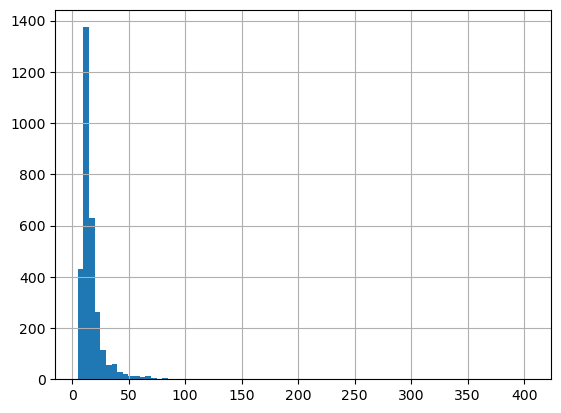

In [33]:
pockets.nres.hist(bins=80)

### Labelling

In [35]:
pockets.loc[
    pockets.loc[
        lambda x: x["site_in_pocket"] >= 0.65
    ].index, 
    "label"
] = 1
pockets["label"] = pockets["label"].fillna(0).astype(int)

pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
0,1fc0,pocket16,10,0.409091,0.9,0
1,1fc0,pocket28,17,0.000000,0.0,0
2,1fc0,pocket76,17,0.000000,0.0,0
3,1fc0,pocket74,11,0.000000,0.0,0
4,1fc0,pocket18,23,0.000000,0.0,0
...,...,...,...,...,...,...
3049,6byr,pocket5,14,0.000000,0.0,0
3050,6byr,pocket8,11,0.000000,0.0,0
3051,6byr,pocket3,16,0.000000,0.0,0
3052,6byr,pocket12,9,0.000000,0.0,0


In [46]:
pocketsf = f"{apos_path}/pockets.pkl"
pockets.to_pickle(pocketsf)

#### No positive-labelled pockets

In [35]:
[pdb for pdb, ps in pockets.groupby("pdb") if ps.label.sum() == 0]

['1a3s',
 '1d2r',
 '1dbq',
 '1dgq',
 '1dqy',
 '1e3g',
 '1ecj',
 '1et5',
 '1hag',
 '1ilg',
 '1jbu',
 '1m14',
 '1nb8',
 '1nex',
 '1nr7',
 '1ogs',
 '1pjk',
 '1pvd',
 '1r39',
 '1roz',
 '1rtd',
 '1t3t',
 '1ubs',
 '1wq7',
 '1y8q',
 '1ygy',
 '1zzw',
 '2ayn',
 '2ceq',
 '2dyl',
 '2hig',
 '2i7q',
 '2jfo',
 '2jfx',
 '2qmv',
 '3geb',
 '3ij4',
 '3jbq',
 '3k8u',
 '3kfp',
 '3kxs',
 '3l3u',
 '3lre',
 '3phl',
 '3q4c',
 '3q71',
 '3qg5',
 '3qwd',
 '3rvy',
 '3uon',
 '3wg9',
 '4ava',
 '4bh9',
 '4cdg',
 '4con',
 '4coo',
 '4gnt',
 '4gqb',
 '4hc4',
 '4neq',
 '4olf',
 '4pwn',
 '4zo1',
 '4zzh',
 '5fn0',
 '5g46',
 '5hgi',
 '5iwk',
 '5jon',
 '5k5t',
 '5kbs',
 '5ng3',
 '5oau',
 '5r7y',
 '5tgz',
 '5v0s',
 '5w1y',
 '5x9z',
 '6byr',
 '6l6z',
 '6li1',
 '6poe',
 '6pwc',
 '6q3w',
 '6s8h',
 '6th2',
 '6zfx',
 '7apj',
 '7ckw',
 '7vvb',
 '7xk2',
 '7xon',
 '7xti',
 '8a11',
 '8fw6',
 '8kgk']

In [36]:
(
    pockets
    .groupby('pdb').filter(lambda g: g.label.sum() == 0)
    .assign(key=lambda x: x.groupby('pdb')['site_in_pocket'].transform('max'))
    .sort_values(['key', 'pdb', 'site_in_pocket'], ascending=False)
    .drop(columns='key')
    .groupby('pdb').head(3)
).iloc[:50]

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
1712,5iwk,pocket30,33,0.647059,0.333333,0
1707,5iwk,pocket27,12,0.470588,0.666667,0
1719,5iwk,pocket3,29,0.176471,0.103448,0
2295,6pwc,pocket10,47,0.642857,0.382979,0
2287,6pwc,pocket15,14,0.214286,0.428571,0
2294,6pwc,pocket9,28,0.214286,0.214286,0
166,1nr7,pocket14,55,0.641026,0.454545,0
164,1nr7,pocket7,12,0.312500,0.416667,0
161,1nr7,pocket18,15,0.230769,0.600000,0
1841,2qmv,pocket2,54,0.634146,0.481481,0


In [101]:
v, colors, sites_colors = view_pocket(*"5iwk	pocket30".split())
v

Viz(bg_color='#F7F7F7', color_data={'data': [{'color': 'white'}], 'nonSelectedColor': None, 'keepColors': Fals…

In [102]:
v.color(colors, keep_colors=True, keep_representations=True)
v.color_residues(sites_colors)

In [103]:
v, colors, sites_colors = view_pocket(*"5fn0	pocket18".split())
v

Viz(bg_color='#F7F7F7', color_data={'data': [{'color': 'white'}], 'nonSelectedColor': None, 'keepColors': Fals…

In [104]:
v.color(colors, keep_colors=True, keep_representations=True)
v.color_residues(sites_colors)

#### Positive pockets

In [49]:
pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
0,1fc0,pocket16,10,0.409091,0.9,0
1,1fc0,pocket28,17,0.000000,0.0,0
2,1fc0,pocket76,17,0.000000,0.0,0
3,1fc0,pocket74,11,0.000000,0.0,0
4,1fc0,pocket18,23,0.000000,0.0,0
...,...,...,...,...,...,...
3049,6byr,pocket5,14,0.000000,0.0,0
3050,6byr,pocket8,11,0.000000,0.0,0
3051,6byr,pocket3,16,0.000000,0.0,0
3052,6byr,pocket12,9,0.000000,0.0,0


In [36]:
dropped = set(pockets.pdb.unique()) - set(pockets.loc[pockets.label == 1].pdb.unique())
# Total initial PDBs, final PDBs, dropped PDBs, % of PDBs dropped, and list of dropped PDBs
len(pockets.pdb.unique()), len(pockets.loc[pockets.label == 1].pdb.unique()), len(dropped), len(dropped)/len(pockets.pdb.unique()), dropped

(182,
 86,
 96,
 0.5274725274725275,
 {'1a3s',
  '1d2r',
  '1dbq',
  '1dgq',
  '1dqy',
  '1e3g',
  '1ecj',
  '1et5',
  '1hag',
  '1ilg',
  '1jbu',
  '1m14',
  '1nb8',
  '1nex',
  '1nr7',
  '1ogs',
  '1pjk',
  '1pvd',
  '1r39',
  '1roz',
  '1rtd',
  '1t3t',
  '1ubs',
  '1wq7',
  '1y8q',
  '1ygy',
  '1zzw',
  '2ayn',
  '2ceq',
  '2dyl',
  '2hig',
  '2i7q',
  '2jfo',
  '2jfx',
  '2qmv',
  '3geb',
  '3ij4',
  '3jbq',
  '3k8u',
  '3kfp',
  '3kxs',
  '3l3u',
  '3lre',
  '3phl',
  '3q4c',
  '3q71',
  '3qg5',
  '3qwd',
  '3rvy',
  '3uon',
  '3wg9',
  '4ava',
  '4bh9',
  '4cdg',
  '4con',
  '4coo',
  '4gnt',
  '4gqb',
  '4hc4',
  '4neq',
  '4olf',
  '4pwn',
  '4zo1',
  '4zzh',
  '5fn0',
  '5g46',
  '5hgi',
  '5iwk',
  '5jon',
  '5k5t',
  '5kbs',
  '5ng3',
  '5oau',
  '5r7y',
  '5tgz',
  '5v0s',
  '5w1y',
  '5x9z',
  '6byr',
  '6l6z',
  '6li1',
  '6poe',
  '6pwc',
  '6q3w',
  '6s8h',
  '6th2',
  '6zfx',
  '7apj',
  '7ckw',
  '7vvb',
  '7xk2',
  '7xon',
  '7xti',
  '8a11',
  '8fw6',
  '8kgk'})

In [37]:
# Total initial pockets, final pockets, positive pockets, and ratio of positive pockets
len(pockets), len(pockets.query(f"pdb not in {list(dropped)}")), sum(pockets.label == 1), sum(pockets.label == 1)/len(pockets.query(f"pdb not in {list(dropped)}"))

(3054, 1494, 94, 0.06291834002677377)

FPocket fails to identify a considerably overlapping pocket with the allosteric site(s) in 25% of the cases (68) for the 278 apo structures, which are ligand-free structures of the holo structures for which FPocket was successful (and etc and were apo-matched) (and had already failed for 10% of total structures). The final % of positive pockets is ~4% of total remaining pockets.

<br>

In [42]:
# final_pockets = pockets.query(f"pdb not in {list(dropped)}")
final_pockets = pockets

## Features per-pocket

In [43]:
final_pockets = pd.concat(
    (
        final_pockets,
        final_pockets.apply(
            lambda row: pd.Series(
                Pocket(f"{apos_pockets_path}/{row['pdb']}/{row['pdb']}_out/pockets/{row['pocket']}_atm.cif").feats
            ), axis=1
        )
    ),
    axis=1
)

final_pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label,Pocket Score,Drug Score,Number of alpha spheres,Mean alpha-sphere radius,...,Local hydrophobic density Score,Number of apolar alpha sphere,Proportion of apolar alpha sphere,Total SASA,Polar SASA,Apolar SASA,Proportion of polar atoms,Alpha sphere density,Cent. of mass - Alpha Sphere max dist,Flexibility
0,1fc0,pocket16,10,0.409091,0.9,0,0.2208,0.1896,43.0,3.2246,...,31.0000,32.0,0.7442,20.279,2.165,18.114,29.630,3.016,6.324,0.103
1,1fc0,pocket28,17,0.000000,0.0,0,0.1342,0.0848,56.0,3.4551,...,20.6923,26.0,0.4643,104.237,35.402,68.835,38.462,4.994,11.215,0.258
2,1fc0,pocket76,17,0.000000,0.0,0,-0.2984,0.3392,72.0,3.6427,...,22.8000,25.0,0.3472,217.644,90.843,126.801,32.653,4.854,15.452,0.195
3,1fc0,pocket74,11,0.000000,0.0,0,-0.1999,0.0017,50.0,3.6358,...,9.2308,13.0,0.2600,183.236,122.854,60.381,40.000,5.071,12.623,0.257
4,1fc0,pocket18,23,0.000000,0.0,0,0.2068,0.7228,171.0,3.4605,...,38.6897,87.0,0.5088,258.861,117.984,140.877,35.052,7.420,16.729,0.400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3049,6byr,pocket5,14,0.000000,0.0,0,0.3220,0.0062,77.0,3.6559,...,21.3200,50.0,0.6494,182.508,73.346,109.162,35.185,7.284,14.126,0.270
3050,6byr,pocket8,11,0.000000,0.0,0,0.1715,0.0030,54.0,3.5497,...,15.7778,18.0,0.3333,110.855,60.134,50.720,42.857,4.335,10.494,0.306
3051,6byr,pocket3,16,0.000000,0.0,0,0.3650,0.0180,68.0,3.4764,...,18.0541,37.0,0.5441,129.456,60.621,68.835,35.714,6.014,15.637,0.264
3052,6byr,pocket12,9,0.000000,0.0,0,0.0834,0.0018,43.0,3.6506,...,14.4444,18.0,0.4186,126.474,64.885,61.589,40.625,4.545,10.110,0.392


In [44]:
final_pockets = pd.concat(
    (
        final_pockets[["pdb", "pocket", 'nres', 'site_in_pocket', 'pocket_in_site']],
        final_pockets["label"],
        final_pockets.drop(columns=['nres', 'site_in_pocket', 'pocket_in_site'] + ["pdb", "pocket", "label"])
    ),
    axis=1,
    keys=["Pockets", "Label", "FPocket"]
)

final_pockets

Pockets                                              Label      FPocket  \
         pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
0       1fc0  pocket16   10       0.409091            0.9     0       0.2208   
1       1fc0  pocket28   17       0.000000            0.0     0       0.1342   
2       1fc0  pocket76   17       0.000000            0.0     0      -0.2984   
3       1fc0  pocket74   11       0.000000            0.0     0      -0.1999   
4       1fc0  pocket18   23       0.000000            0.0     0       0.2068   
...      ...       ...  ...            ...            ...   ...          ...   
3049    6byr   pocket5   14       0.000000            0.0     0       0.3220   
3050    6byr   pocket8   11       0.000000            0.0     0       0.1715   
3051    6byr   pocket3   16       0.000000            0.0     0       0.3650   
3052    6byr  pocket12    9       0.000000            0.0     0       0.0834   
3053    6byr   pocket6    9       0.000000            0.0     0       0.3143   

                                                                  ...  \
     Drug Score Number of alpha spheres Mean alpha-sphere radius  ...   
0        0.1896                    43.0                   3.2246  ...   
1        0.0848                    56.0                   3.4551  ...   
2        0.3392                    72.0                   3.6427  ...   
3        0.0017                    50.0                   3.6358  ...   
4        0.7228                   171.0                   3.4605  ...   
...         ...                     ...                      ...  ...   
3049     0.0062                    77.0                   3.6559  ...   
3050     0.0030                    54.0                   3.5497  ...   
3051     0.0180                    68.0                   3.4764  ...   
3052     0.0018                    43.0                   3.6506  ...   
3053     0.0711                    48.0                   3.3844  ...   

                                                                    \
     Local hydrophobic density Score Number of apolar alpha sphere   
0                            31.0000                          32.0   
1                            20.6923                          26.0   
2                            22.8000                          25.0   
3                             9.2308                          13.0   
4                            38.6897                          87.0   
...                              ...                           ...   
3049                         21.3200                          50.0   
3050                         15.7778                          18.0   
3051                         18.0541                          37.0   
3052                         14.4444                          18.0   
3053                         27.3889                          36.0   

                                                                          \
     Proportion of apolar alpha sphere Total SASA Polar SASA Apolar SASA   
0                               0.7442     20.279      2.165      18.114   
1                               0.4643    104.237     35.402      68.835   
2                               0.3472    217.644     90.843     126.801   
3                               0.2600    183.236    122.854      60.381   
4                               0.5088    258.861    117.984     140.877   
...                                ...        ...        ...         ...   
3049                            0.6494    182.508     73.346     109.162   
3050                            0.3333    110.855     60.134      50.720   
3051                            0.5441    129.456     60.621      68.835   
3052                            0.4186    126.474     64.885      61.589   
3053                            0.7500     51.570      8.749      42.821   

                                                     \
     Proportion of polar atoms Alpha sphere density   
0   

In [45]:
pockets_features = pd.concat(
    (
        final_pockets,
        final_pockets.apply(
            lambda row: get_mean_pocket_features(
                row[("Pockets", "pdb")],
                row[("Pockets", "pocket")],
                pdb_features = featuresd[row[("Pockets", "pdb")]],
                pockets_path = apos_pockets_path # f"{pockets_path}/{pdb}/{pdb}_out/pockets/{pocket}_atm.cif"
            ), 
            axis=1 
        )
    ),
    axis=1
)

pockets_features

Pockets                                              Label      FPocket  \
         pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
0       1fc0  pocket16   10       0.409091            0.9     0       0.2208   
1       1fc0  pocket28   17       0.000000            0.0     0       0.1342   
2       1fc0  pocket76   17       0.000000            0.0     0      -0.2984   
3       1fc0  pocket74   11       0.000000            0.0     0      -0.1999   
4       1fc0  pocket18   23       0.000000            0.0     0       0.2068   
...      ...       ...  ...            ...            ...   ...          ...   
3049    6byr   pocket5   14       0.000000            0.0     0       0.3220   
3050    6byr   pocket8   11       0.000000            0.0     0       0.1715   
3051    6byr   pocket3   16       0.000000            0.0     0       0.3650   
3052    6byr  pocket12    9       0.000000            0.0     0       0.0834   
3053    6byr   pocket6    9       0.000000            0.0     0       0.3143   

                                                                  ...  \
     Drug Score Number of alpha spheres Mean alpha-sphere radius  ...   
0        0.1896                    43.0                   3.2246  ...   
1        0.0848                    56.0                   3.4551  ...   
2        0.3392                    72.0                   3.6427  ...   
3        0.0017                    50.0                   3.6358  ...   
4        0.7228                   171.0                   3.4605  ...   
...         ...                     ...                      ...  ...   
3049     0.0062                    77.0                   3.6559  ...   
3050     0.0030                    54.0                   3.5497  ...   
3051     0.0180                    68.0                   3.4764  ...   
3052     0.0018                    43.0                   3.6506  ...   
3053     0.0711                    48.0                   3.3844  ...   

       HHBlits                                                              \
          M->M      M->I      M->D      I->M      I->I      D->M      D->D   
0     0.960585  0.003782  0.035621  0.512261  0.187765  0.237017  0.762959   
1     0.952510  0.014329  0.033157  0.513768  0.486255  0.279977  0.720071   
2     0.946516  0.006695  0.046756  0.306669  0.634551  0.155757  0.844198   
3     0.974847  0.011276  0.013975  0.394936  0.605050  0.205065  0.794950   
4     0.941238  0.015367  0.043423  0.402971  0.466582  0.207772  0.792254   
...        ...       ...       ...       ...       ...       ...       ...   
3049  0.981942  0.013759  0.004341  0.243460  0.685102  0.245639  0.754320   
3050  0.985004  0.008058  0.007018  0.356536  0.552556  0.213853  0.786206   
3051  0.978237  0.015531  0.006256  0.202368  0.547598  0.186140  0.813858   
3052  0.988615  0.008037  0.003300  0.284389  0.604479  0.286432  0.713525   
3053  0.968456  0.028696  0.002909  0.188087  0.589687  0.144018  0.855984   

                                     
           Neff    Neff_I    Neff_D  
0      6.684700  0.711400  1.700400  
1      8.953824  1.074235  3.269235  
2      9.107353  0.987882  3.432941  
3      9.311273  1.087727  2.325364  
4      9.071565  0.996000  3.486870  
...         ...       ...       ...  
3049  12.587643  1.058786  1.219357  
3050   9.696000  0.972455  1.210182  
3051   9.488312  0.863187  1.120188  
3052   9.969889  0.948667  1.115333  
3053   9.589111  0.931444  1.126333  

[3054 rows x 194 columns]

In [46]:
pockets_featuresf = f"{apos_path}/pockets_features.pkl"

if not os.path.isfile(pockets_featuresf):
    pockets_featuresd = {
        pdb: pks
        for pdb, pks in pockets_features.groupby(("Pockets", "pdb"), sort=False)
    }
    with open(pockets_featuresf, "wb") as f:
        pickle.dump(pockets_featuresd, f)
else:
    with open(pockets_featuresf, "rb") as f:
        pockets_featuresd = pickle.load(f)

len(pockets_featuresd), pockets_featuresd

(182,
 {'1fc0':    Pockets                                              Label      FPocket  \
         pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
  0     1fc0  pocket16   10       0.409091          0.900     0       0.2208   
  1     1fc0  pocket28   17       0.000000          0.000     0       0.1342   
  2     1fc0  pocket76   17       0.000000          0.000     0      -0.2984   
  3     1fc0  pocket74   11       0.000000          0.000     0      -0.1999   
  4     1fc0  pocket18   23       0.000000          0.000     0       0.2068   
  ..     ...       ...  ...            ...            ...   ...          ...   
  71    1fc0  pocket33    8       0.000000          0.000     0       0.1043   
  72    1fc0  pocket36   10       0.000000          0.000     0       0.0888   
  73    1fc0  pocket63   14       0.000000          0.000     0      -0.0713   
  74    1fc0  pocket41   16       0.105263          0.125     0       0.0703   
  75    1fc0   pocket6   1

# Embeddings

In [47]:
seq_embsf = f"{apos_path}/seq_embeddings.pkl"

if not os.path.isfile(seq_embsf):
    from utils.embeddings import get_embs
    
    seq_embsd = {}

    for pdb in tqdm(featuresd, smoothing=0):
        seq_embsd[pdb] = {}
        cif = Cif(pdb)
        entities = pd.DataFrame(cif.cif.data["_entity_poly"], dtype=str)
        for entity_id, entity_res in cif.residues.groupby("label_entity_id"):
            seq = entities.query(f"entity_id == '{entity_id}'")["pdbx_seq_one_letter_code_can"].item().replace("\n", "")
            seq_embsd[pdb][entity_id] = {
                "seq": seq,
                "embs": get_embs(seq)
            }
        
    with open(seq_embsf, "wb") as f:
        pickle.dump(seq_embsd, f)
else:
    with open(seq_embsf, "rb") as f:
        seq_embsd = pickle.load(f)

len(seq_embsd), seq_embsd

(182,
 {'1fc0': {'1': {'seq': 'AKPLTDQEKRRQISIRGIVGVENVAELKKSFNRHLHFTLVKDRNVATTRDYYFALAHTVRDHLVGRWIRTQQHYYDKCPKRVYYLSLEFYMGRTLQNTMINLGLQNACDEAIYQLGLDIEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEYGIFNQKIRDGWQVEEADDWLRYGNPWEKSRPEFMLPVHFYGKVEHTNTGTKWIDTQVVLALPYDTPVPGYMNNTVNTMRLWSARAPNDFNLRDFNVGDYIQAVLDRNLAENISRVLYPNDNFFEGKELRLKQEYFVVAATLQDIIRRFKASKFGSTRGAGTVFDAFPDQVAIQLNDTHPALAIPELMRIFVDIEKLPWSKAWELTQKTFAYTNHTVLPEALERWPVDLVEKLLPRHLEIIYEINQKHLDRIVALFPKDVDRLRRMSLIEEEGSKRINMAHLCIVGSHAVNGVAKIHSDIVKTKVFKDFSELEPDKFQNKTNGITPRRWLLLCNPGLAELIAEKIGEDYVKDLSQLTKLHSFLGDDVFLRELAKVKQENKLKFSQFLETEYKVKINPSSMFDVQVKRIHEYKRQLLNCLHVITMYNRIKKDPKKLFVPRTVIIGGKAAPGYHMAKMIIKLITSVADVVNNDPMVGSKLKVIFLENYRVSLAEKVIPATDLSEQISTAGTEASGTGNMKFMLNGALTIGTMDGANVEMAEEAGEENLFIFGMRIDDVAALDKKGYEAKEYYEALPELKLVIDQIDNGFFSPKQPDLFKDIINMLFYHDRFKVFADYEAYVKCQDKVSQLYMNPKAWNTMVLKNIAASGKFSSDRTIKEYAQNIWNVEPSDLKISLSNESNKVNGN',
    'embs': array([[ 0.04221305,  0.07241926, -0.23124689, ..., -0.03535628,
             0.0777602 ,  0.01580477],
    

In [48]:
embsf = f"{apos_path}/embeddings.pkl"

if not os.path.isfile(embsf):
    embsd = {}
    for pdb, embs in tqdm(seq_embsd.items(), smoothing=0):
        residues = featuresd[pdb][["Residues", "Label"]]

        embsd[pdb] = residues.merge(
            pd.concat((
                pd.concat(
                    (
                        pd.Series([entity_id]*len(entd["seq"]), name="label_entity_id"),
                        pd.Series(range(1, len(entd["seq"])+1), name="label_seq_id", dtype=str),
                        pd.DataFrame(entd["embs"])
                    ),
                    axis=1,
                    keys=["Residues", "Residues", "Embeddings"]
                )
                for entity_id, entd in embs.items()
            )),
            on=[("Residues", "label_entity_id"), ("Residues", "label_seq_id")]
        )
        
    with open(embsf, "wb") as f:
        pickle.dump(embsd, f)
else:
    with open(embsf, "rb") as f:
        embsd = pickle.load(f)

len(embsd), embsd

(182,
 {'1fc0':      Residues                                                          \
            pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
  0        1fc0               1             A           23            A   
  1        1fc0               1             A           24            A   
  2        1fc0               1             A           25            A   
  3        1fc0               1             A           26            A   
  4        1fc0               1             A           27            A   
  ...       ...             ...           ...          ...          ...   
  1580     1fc0               1             B          827            B   
  1581     1fc0               1             B          828            B   
  1582     1fc0               1             B          829            B   
  1583     1fc0               1             B          830            B   
  1584     1fc0               1             B          831            B   
  
        

## Per-pocket

In [49]:
pockets_embeddings = pd.concat(
    (
        final_pockets[[("Pockets", "pdb"), ("Pockets", "pocket"), ("Label", "label")]],
        final_pockets.apply(
            lambda row: get_mean_pocket_features(
                row[("Pockets", "pdb")],
                row[("Pockets", "pocket")],
                pdb_features = embsd[row[("Pockets", "pdb")]],
                pockets_path = apos_pockets_path # # f"{pockets_path}/{pdb}/{pdb}_out/pockets/{pocket}_atm.cif"
            ), 
            axis=1 
        )
    ),
    axis=1,
)

pockets_embeddings

Pockets           Label Embeddings                                \
         pdb    pocket label          0         1         2         3   
0       1fc0  pocket16     0  -0.040608 -0.023668 -0.010113  0.108285   
1       1fc0  pocket28     0  -0.017953 -0.177836 -0.245530 -0.001884   
2       1fc0  pocket76     0   0.122221  0.017327 -0.168660  0.063246   
3       1fc0  pocket74     0   0.101429 -0.140683 -0.122115  0.042176   
4       1fc0  pocket18     0   0.049014 -0.066932 -0.132188  0.049200   
...      ...       ...   ...        ...       ...       ...       ...   
3049    6byr   pocket5     0   0.030124 -0.267380 -0.274589  0.117148   
3050    6byr   pocket8     0   0.018731  0.006164 -0.259944  0.129427   
3051    6byr   pocket3     0   0.073199 -0.232826 -0.282780  0.174155   
3052    6byr  pocket12     0   0.080646 -0.027440 -0.161358  0.197056   
3053    6byr   pocket6     0   0.039873 -0.263691 -0.169991  0.165068   

                                    ...                                \
             4         5         6  ...      1270      1271      1272   
0    -0.016431 -0.006453 -0.091059  ...  0.040980 -0.012536  0.009754   
1    -0.270723 -0.103964  0.024276  ... -0.064821 -0.045217 -0.177759   
2    -0.063048 -0.020129 -0.111269  ...  0.052561  0.015613 -0.159386   
3    -0.041852 -0.011137 -0.273783  ... -0.036996 -0.053960 -0.055062   
4    -0.023414 -0.035818  0.014088  ... -0.031652  0.014542  0.000439   
...        ...       ...       ...  ...       ...       ...       ...   
3049 -0.415406 -0.029167  0.147685  ... -0.076978 -0.089595 -0.099647   
3050 -0.331231  0.088206  0.059770  ... -0.086814 -0.046202 -0.029714   
3051 -0.355205 -0.001342  0.199671  ... -0.170588 -0.120181 -0.068308   
3052 -0.376569 -0.009795  0.168738  ...  0.075875 -0.037775 -0.150470   
3053 -0.283560 -0.045569  0.152278  ... -0.078747 -0.161153 -0.103515   

                                                                            
          1273      1274      1275      1276      1277      1278      1279  
0     0.044179  0.010406  0.043452  0.111194 -0.124277  0.034320 -0.006104  
1    -0.117144 -0.014806  0.002136 -0.020467 -0.266300  0.090958  0.195824  
2    -0.088236 -0.053166  0.065118  0.206053  0.034676  0.011215  0.146154  
3    -0.038974 -0.004685 -0.024917  0.187333  0.204076 -0.023545  0.082144  
4     0.029344 -0.029504 -0.000724  0.134327 -0.110651 -0.013156 -0.018931  
...        ...       ...       ...       ...       ...       ...       ...  
3049  0.141861 -0.024882 -0.240661 -0.048013 -0.266415  0.052593  0.359883  
3050  0.136921  0.041815 -0.181174 -0.115757 -0.287868 -0.002755  0.242992  
3051  0.152974 -0.034532 -0.127431 -0.056611 -0.401984 -0.032853  0.297698  
3052  0.096186 -0.151760 -0.102133 -0.008100 -0.294524  0.179201  0.275094  
3053  0.185885  0.059773 -0.149533 -0.046532 -0.315635  0.033759  0.261633  

[3054 rows x 1283 columns]

In [50]:
pockets_embeddingsf = f"{apos_path}/pockets_embeddings.pkl"

if not os.path.isfile(pockets_embeddingsf):
    pockets_embeddingsd = {
        pdb: pks
        for pdb, pks in pockets_embeddings.groupby(("Pockets", "pdb"))
    }
    with open(pockets_embeddingsf, "wb") as f:
        pickle.dump(pockets_embeddingsd, f)
else:
    with open(pockets_embeddingsf, "rb") as f:
        pockets_embeddingsd = pickle.load(f)

len(pockets_embeddingsd), pockets_embeddingsd

(182,
 {'1a3s':      Pockets          Label Embeddings                                \
           pdb   pocket label          0         1         2         3   
  1097    1a3s  pocket1     0  -0.119464 -0.013073 -0.064493  0.008572   
  1098    1a3s  pocket2     0  -0.101316  0.007484 -0.015195 -0.053310   
  1099    1a3s  pocket4     0  -0.005000 -0.039056 -0.081496  0.018532   
  1100    1a3s  pocket3     0   0.027682 -0.028279 -0.087868  0.028171   
  
                                      ...                                \
               4         5         6  ...      1270      1271      1272   
  1097 -0.083986 -0.103770  0.104599  ...  0.014924 -0.019801 -0.114591   
  1098  0.037820 -0.069016  0.037604  ... -0.011153 -0.070628 -0.007229   
  1099 -0.135874 -0.122566  0.058329  ...  0.091017 -0.124141 -0.144721   
  1100 -0.145476 -0.133796  0.064069  ... -0.001957 -0.023493 -0.038553   
  
                                                                              
       

# Training sets

In [51]:
len(final_apos)

182

In [54]:
with open("6.Training_sets/train_pdbs.pkl", "rb") as f:
    train_set = pickle.load(f)

train_apos = tuple(apo for holo, apo in final_apos.items() if holo in train_set)
train_positive_apos = tuple(apo for holo, apo in final_apos.items() if apo in pockets.loc[pockets.label == 1].pdb.unique() and holo in train_set)

print("Original training set, apos of pdbs in training set, apos of pdbs in training set with a + pocket")
len(train_set), len(train_apos), len(train_positive_apos)

Original training set, apos of pdbs in training set, apos of pdbs in training set with a + pocket


(229, 148, 69)

In [55]:
with open("6.Training_sets/test_pdbs.pkl", "rb") as f:
    test_set = pickle.load(f)

test_apos = tuple(apo for holo, apo in final_apos.items() if holo in test_set)
test_positive_apos = tuple(apo for holo, apo in final_apos.items() if apo in pockets.loc[pockets.label == 1].pdb.unique() and holo in test_set)

print("Original testing set, apos of pdbs in testing set, apos of pdbs in testing set with a + pocket")
len(test_set), len(test_apos), len(test_positive_apos)

Original testing set, apos of pdbs in testing set, apos of pdbs in testing set with a + pocket


(60, 34, 17)

In [56]:
# Test % split, and test % split whe considering only apos with a + pocket
len(test_apos) / ( len(train_apos) + len(test_apos) ), #len(test_positive_apos) / ( len(train_positive_apos) + len(test_positive_apos) )

(0.18681318681318682,)

There are apo-successful structures for PDBs in the train and test set, with a similar test split % than in the original sets.

<br>

In [58]:
with open("8.Apos/train_apos.pkl", "wb") as f:
    pickle.dump(train_apos, f)
    
with open("8.Apos/test_apos.pkl", "wb") as f:
    pickle.dump(test_apos, f)

# Apos of extra set

## Data

In [52]:
extra_holos_featuresf = "7.Extra_set/features.pkl"

with open(extra_holos_featuresf, "rb") as f:
    extra_holos_featuresd = pickle.load(f)

extra_holos_featuresd

{'7gqu':     Residues                                                          \
          pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
 0       7gqu               1             A           12            A   
 1       7gqu               1             A           13            A   
 2       7gqu               1             A           14            A   
 3       7gqu               1             A           15            A   
 4       7gqu               1             A           16            A   
 ..       ...             ...           ...          ...          ...   
 414     7gqu               1             A          426            A   
 415     7gqu               1             A          427            A   
 416     7gqu               1             A          428            A   
 417     7gqu               1             A          429            A   
 418     7gqu               1             A          430            A   
 
                                   Label 

In [53]:
extra_holos_sitesf = "7.Extra_set/news_sites.pkl"

with open(extra_holos_sitesf, "rb") as f:
    extra_holos_sites = {k: v for k, v in pickle.load(f).items() if k in extra_holos_featuresd}

extra_holos_sites

{'7gqu': [{'mod':      label_comp_id label_asym_id label_entity_id label_seq_id  \
   3420           X1L             D               4            .   
   
        pdbx_PDB_ins_code auth_seq_id auth_comp_id auth_asym_id  \
   3420                 ?        1002          X1L            A   
   
        pdbx_PDB_model_num pdbx_label_index pdbx_sifts_xref_db_name  \
   3420                  1             1002                       ?   
   
        pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num pdbx_sifts_xref_db_res  
   3420                      ?                      ?                      ?  ,
   'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
   0            VAL             A               1           55                 ?   
   1            MET             A               1           56                 ?   
   2            ALA             A               1           57                 ?   
   3            THR             A               1         

In [54]:
len(extra_holos_featuresd), len(extra_holos_sites)

(9, 9)

## Apos

In [55]:
extra_apos_path = "8.Apos/Extra_set"

os.makedirs(extra_apos_path, exist_ok=True)

In [56]:
extra_apos_original_cifs_path = f"{extra_apos_path}/origcifs"
os.makedirs(extra_apos_original_cifs_path, exist_ok=True)

extra_apos_structures_path = f"{extra_apos_path}/cifs"
os.makedirs(extra_apos_structures_path, exist_ok=True)

extra_apos_pockets_path = f"{extra_apos_path}/pockets"
os.makedirs(extra_apos_pockets_path, exist_ok=True)

extra_apos_features_path = extra_apos_path
os.makedirs(f"{extra_apos_features_path}/features", exist_ok=True)

### Run

In [57]:
Cif.path = "7.Extra_set/cifs"
Cif.original_cifs_path = "7.Extra_set/origcifs" # <pdb>_updated.cif.gz
Pdb.path = extra_apos_structures_path

In [58]:
def get_extra_apos(pdb):
    pdb = Cif(pdb)
    if "pdbx_sifts_xref_db_acc" not in pdb.residues.columns:
        print(f"{pdb.entry_id}: No Uniprot column in original pdb")
        return []
        
    # protein or others. allo modulators. Ions?
    sites_ups = get_sites_ups(pdb, {i: s for i, s in enumerate(extra_holos_sites[pdb.entry_id])})
    if len(sites_ups) == 0:
        print(f"{pdb.entry_id}: No valid Uniprots in any site")
        
    ups = list(set(u for sd in sites_ups.values() for u in sd["uniprots"].keys()))

    
    pdbs = False
    for q in (
        rcsb_attributes.rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_accession == up
        for up in ups
    ):
        pdbs = q if not pdbs else pdbs & q
    
    if not pdbs:
        print(f"{pdb.entry_id}: No valid Uniprots in any site")
        return []
        
    pdbs = set(i.lower() for i in pdbs()) - dbpdbs - set(extra_holos_featuresd.keys())
    if len(pdbs) == 0: 
        print(f"{pdb.entry_id}: No other PDBs of Uniprots")
        return []

    for newpdb in tqdm(pdbs, smoothing=0, desc=pdb.entry_id):
        for r in check_pdb(newpdb, pdb, sites_ups, ups):
            yield r

In [59]:
extra_matchesf = f"{extra_apos_path}/matches.pkl"

In [60]:
extra_df = pd.DataFrame(columns=pd.MultiIndex.from_tuples(
    (('allodb', 'pdb'), ('allodb', 'site_id'), ('allodb', 'label_asym_id'), ('allodb', 'mod'), ('allodb', 'uniprot'), ('allodb', 'ulabel_asym_id'), ('allodb', 'usiteres'), ('allodb', 'umin'), ('allodb', 'umax'), ('apo', 'pdb'), ('apo', 'label_asym_id'), ('apo', 'site'), ('apo', 'siteres'), ('apo', 'ligands'), ('apo', 'any_apo_chain'), ('apo', 'umin'), ('apo', 'umax'), ('apo', 'usite'), ('overlap', 'a_in_h_minmax'), ('overlap', 'h_in_a_minmax'), ('overlap', 'a_in_h_merge'), ('overlap', 'h_in_a_merge'))
))

In [61]:
# Retrieve processed elements from the DataFrame
extra_processed = extra_df[("allodb", "pdb")].unique().tolist()

In [62]:
# Load the existing DataFrame if it exists
if os.path.exists(extra_matchesf):
    extra_df = pd.read_pickle(extra_matchesf)
    extra_processed.extend(extra_df[("allodb", "pdb")].unique().tolist())

In [50]:
# Process the reps keys in chunks
for p in tqdm(extra_holos_featuresd, smoothing=0):
    if p not in extra_processed:
        p_df = pd.DataFrame(get_extra_apos(p))
        if len(p_df):
            p_df.columns = pd.MultiIndex.from_tuples(p_df.columns)
            extra_df = pd.concat([extra_df, p_df])
            extra_df.to_pickle(extra_matchesf)
        extra_processed.append(p)

  0%|          | 0/9 [00:00<?, ?it/s]

7gqu:   0%|          | 0/19 [00:00<?, ?it/s]

/tmp/ipykernel_3896311/2230244043.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  extra_df = pd.concat([extra_df, p_df])


7yg5:   0%|          | 0/4 [00:00<?, ?it/s]

8aq6:   0%|          | 0/17 [00:00<?, ?it/s]

8f4s:   0%|          | 0/2628 [00:00<?, ?it/s]

8jp0: No other PDBs of Uniprots


8qni:   0%|          | 0/23 [00:00<?, ?it/s]

8uk6: No other PDBs of Uniprots


8v81:   0%|          | 0/57 [00:00<?, ?it/s]

9dnm:   0%|          | 0/14 [00:00<?, ?it/s]

In [92]:
extra_apos = {}
extra_apos_sites = {}

##### No hits

###### 8jp0

The Uniprot in the holo is P32418-2 but in the RCSB PDB is P32418 and it does have an apo structure, 8SGJ.

In [93]:
extra_holos_sites["8jp0"]

[{'mod':      label_comp_id label_asym_id label_entity_id label_seq_id  \
  5644           EKY             B               2            .   
  
       pdbx_PDB_ins_code auth_seq_id auth_comp_id auth_asym_id  \
  5644                 ?        1001          EKY            A   
  
       pdbx_PDB_model_num pdbx_label_index pdbx_sifts_xref_db_name  \
  5644                  1             1001                       ?   
  
       pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num pdbx_sifts_xref_db_res  
  5644                      ?                      ?                      ?  ,
  'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0            GLU             A               1          132                 ?   
  1            THR             A               1          133                 ?   
  2            VAL             A               1          134                 ?   
  3            SER             A               1          135                 ?  

In [94]:
extra_apos["8jp0"] = {
    "8sgj": ['A']
}


temp = extra_holos_sites["8jp0"][0]["site"][["pdbx_sifts_xref_db_acc", "pdbx_sifts_xref_db_num"]]
temp.loc[:, "pdbx_sifts_xref_db_acc"] = ["P32418"]*len(temp)

extra_apos_sites["8sgj"] = {
    (0, 'P32418', "A"): {
        "site": temp
    }
}

###### 8uk6

There is an AlphaFold model which will be used to measure performance on this kind of structures. 

The original .cif of the model from PDBe "AF-A0A1D8PQM9-F1-model_v4.cif" is placed manually in the `origcifs` folder. The filename is changed to "AF-A0A1D8PQM9-F1" so that the filename and the first line (data_AF-A0A1D8PQM9-F1) match and avoids problem with the first lines of cifs being expected to be all upper-case. The '_updated' suffix is added and is compressed in the gunzip format.

<br>

In [95]:
extra_holos_sites["8uk6"]

[{'mod':      label_comp_id label_asym_id label_entity_id label_seq_id  \
  4678           WVK             C               3            .   
  
       pdbx_PDB_ins_code auth_seq_id auth_comp_id auth_asym_id  \
  4678                 ?         802          WVK            A   
  
       pdbx_PDB_model_num pdbx_label_index pdbx_sifts_xref_db_name  \
  4678                  1              802                       ?   
  
       pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num pdbx_sifts_xref_db_res  
  4678                      ?                      ?                      ?  ,
  'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0            GLY             A               1          281                 ?   
  1            PHE             A               1          282                 ?   
  2            LEU             A               1          283                 ?   
  3            HIS             A               1          284                 ?  

In [96]:
extra_apos["8uk6"] = {
    "AF-A0A1D8PQM9-F1": ['A']
}

extra_apos_sites["AF-A0A1D8PQM9-F1"] = {
    (0, 'A0A1D8PQM9', "A"): {
        "site": extra_holos_sites["8uk6"][0]["site"][["pdbx_sifts_xref_db_acc", "pdbx_sifts_xref_db_num"]]
    }
}

In [97]:
extra_apos, extra_apos_sites

({'8jp0': {'8sgj': ['A']}, '8uk6': {'AF-A0A1D8PQM9-F1': ['A']}},
 {'8sgj': {(0,
    'P32418',
    'A'): {'site':    pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num
    0                  P32418                    132
    1                  P32418                    133
    2                  P32418                    134
    3                  P32418                    135
    4                  P32418                    137
    5                  P32418                    138
    6                  P32418                    141
    7                  P32418                    200
    8                  P32418                    203
    9                  P32418                    206
    10                 P32418                    207
    11                 P32418                    208
    12                 P32418                    210
    13                 P32418                    211
    14                 P32418                    241
    15                 P32418              

## Analysis

In [98]:
extra_df = extra_df.reset_index(drop=True)
extra_df

allodb                                                    \
       pdb site_id label_asym_id  mod uniprot ulabel_asym_id   
0     7gqu       0           [A]  [D]  Q14191            [A]   
1     7gqu       0           [A]  [D]  Q14191            [A]   
2     7gqu       0           [A]  [D]  Q14191            [A]   
3     7gqu       0           [A]  [D]  Q14191            [A]   
4     7gqu       0           [A]  [D]  Q14191            [A]   
..     ...     ...           ...  ...     ...            ...   
135   9dnm       0           [C]  [D]  P29066            [C]   
136   9dnm       0           [C]  [D]  P29066            [C]   
137   9dnm       0           [C]  [D]  P29066            [C]   
138   9dnm       0           [C]  [D]  P29066            [C]   
139   9dnm       0           [C]  [D]  P29066            [C]   

                                                                   apo  ...  \
                                              usiteres umin umax   pdb  ...   
0       label_comp_id label_asym_id label_entity_id...  527  945  8pfo  ...   
1       label_comp_id label_asym_id label_entity_id...  527  945  6yhr  ...   
2       label_comp_id label_asym_id label_entity_id...  527  945  8yle  ...   
3       label_comp_id label_asym_id label_entity_id...  527  945  7gqt  ...   
4       label_comp_id label_asym_id label_entity_id...  527  945  8pfp  ...   
..                                                 ...  ...  ...   ...  ...   
135    label_comp_id label_asym_id label_entity_id ...    6  391  9bt8  ...   
136    label_comp_id label_asym_id label_entity_id ...    6  391  8i0n  ...   
137    label_comp_id label_asym_id label_entity_id ...    6  391  8hsv  ...   
138    label_comp_id label_asym_id label_entity_id ...    6  391  8go8  ...   
139    label_comp_id label_asym_id label_entity_id ...    6  391  9cx9  ...   

                                                                           \
                                               ligands any_apo_chain umin   
0    {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False  523   
1                   {'A': {('apo', 'has_lig'): False}}          True  528   
2                   {'A': {('apo', 'has_lig'): False}}          True  526   
3                   {'A': {('apo', 'has_lig'): False}}          True  527   
4                   {'A': {('apo', 'has_lig'): False}}          True  525   
..                                                 ...           ...  ...   
135                 {'E': {('apo', 'has_lig'): False}}          True    6   
136  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    7   
137  {'A': {('apo', 'has_lig'): False}, 'C': {('apo...          True    4   
138  {'A': {('apo', 'has_lig'): True, ('apo', 'lig_...         False    7   
139                 {'D': {('apo', 'has_lig'): False}}          True    6   

                      overlap                                          \
     umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge h_in_a_merge   
0     944   1.0      0.990521      0.997613     0.990453     0.990453   
1    1072   1.0      0.766972      0.997613     0.772643     0.997613   
2     945   1.0      0.997619      1.000000     0.997596     0.990453   
3     945   1.0      1.000000      1.000000     1.000000     0.988067   
4     944   1.0      0.995238      0.997613     0.995110     0.971360   
..    ...   ...           ...           ...          ...          ...   
135   356   1.0      1.000000      0.909326     0.944785     0.936170   
136   368   1.0      1.000000      0.937824     0.886740     0.975684   
137   394   1.0      0.987212      1.000000     0.906336     1.000000   
138   368   1.0      1.000000      0.937824     0.886740     0.975684   
139   356   1.0      1.000000      0.909326     0.965732     0.942249   

                                                allodb  
                                               siteres  
0       label_comp_id label_asym_id label_entity_id...  
1       label_comp_i

In [99]:
len(extra_df[("allodb", "pdb")].unique())

7

##### No matches

In [100]:
set(extra_holos_featuresd.keys()) - set(extra_df[("allodb", "pdb")].unique())

{'8jp0', '8uk6'}

Already processed

<br>

##### No site overlap

In [101]:
set(
    extra_df[("allodb", "pdb")].unique()
) - set(
    extra_df[extra_df[("apo", "site")] >= 0.8][("allodb", "pdb")].unique()
) 

set()

None.

<br>

In [102]:
extra_filt_df = extra_df[extra_df[("apo", "site")] >= 0.8]

##### No chain overlap

In [103]:
# No chain overlap
set(
    extra_filt_df[("allodb", "pdb")].unique()
) - set(
    extra_filt_df[extra_filt_df["overlap"].mean(axis=1) >= 0.8][("allodb", "pdb")].unique()
) 

{'8f4s'}

###### 8f4s

All of the residues of the 'holo' are in the 'apo' (by Uniprot residues) but not vice versa, due to the structures having an accessory protein of the same organism and that has the same Uniprot (probably a very long expression frame from SARS-CoV-2) that is taken into account when retrieving the Uniprot residue numbers in the apo. An apo is selected manually 

In [104]:
extra_holos_sites["8f4s"]

[{'mod':      label_comp_id label_asym_id label_entity_id label_seq_id  \
  3219           XDU             D               4            .   
  
       pdbx_PDB_ins_code auth_seq_id auth_comp_id auth_asym_id  \
  3219                 ?        7102          XDU            A   
  
       pdbx_PDB_model_num pdbx_label_index pdbx_sifts_xref_db_name  \
  3219                  1             7102                       ?   
  
       pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num pdbx_sifts_xref_db_res  
  3219                      ?                      ?                      ?  ,
  'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0            ILE             A               1           71                 ?   
  1            PHE             A               1           73                 ?   
  2            GLY             A               1           74                 ?   
  3            VAL             A               1           99                 ?  

In [105]:
(
    extra_df[ extra_df[("allodb", "pdb")] == "8f4s" ]
    .drop(columns=[("allodb", "usiteres"), ("allodb", "siteres"), ("apo", "siteres"), ("apo", "ligands"),])
    .sort_values([("overlap", "a_in_h_merge"), ("overlap", "h_in_a_merge")], ascending=False)
)

allodb                                                                 apo  \
      pdb site_id label_asym_id  mod uniprot ulabel_asym_id  umin  umax   pdb   
40   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7l6r   
77   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8f4y   
73   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8a23   
52   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7r1u   
60   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7bq7   
..    ...     ...           ...  ...     ...            ...   ...   ...   ...   
30   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  6wvn   
51   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7ult   
88   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8vuo   
85   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7jyy   
87   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7jz0   

                                                            overlap  \
   label_asym_id site any_apo_chain  umin  umax usite a_in_h_minmax   
40        [A, B]  1.0          True  4272  7096   1.0      0.105487   
77        [A, B]  1.0         False  4276  7096   1.0      0.105636   
73        [A, B]  1.0          True  4275  7092   1.0      0.104329   
52        [A, B]  1.0          True  4271  7095   1.0      0.105133   
60        [A, B]  1.0          True  4271  7095   1.0      0.105133   
..           ...  ...           ...   ...   ...   ...           ...   
30        [A, B]  1.0          True  4263  7096   1.0      0.105152   
51        [A, B]  1.0          True  4271  7096   1.0      0.105449   
88  [A, B, C, D]  1.0          True  4260  7092   1.0      0.103777   
85        [A, B]  1.0          True  4264  7096   1.0      0.105189   
87        [A, B]  1.0          True  4264  7096   1.0      0.105189   

                                            
   h_in_a_minmax a_in_h_merge h_in_a_merge  
40      1.000000     0.732187     1.000000  
77      1.000000     0.730392     1.000000  
73      0.986577     0.728180     0.979866  
52      0.996644     0.724390     0.996644  
60      0.996644     0.724390     0.996644  
..           ...          ...          ...  
30      1.000000     0.707838     1.000000  
51      1.000000     0.705314     0.979866  
88      0.986577     0.699284     0.983221  
85      1.000000     0.697892     1.000000  
87      1.000000     0.697892     1.000000  

[69 rows x 19 columns]

In [120]:
(
    extra_df[ extra_df[("allodb", "pdb")] == "8f4s" ]
    .drop(columns=[("allodb", "usiteres"), ("allodb", "siteres"), ("apo", "siteres"), ("apo", "ligands"),])
    .sort_values([("overlap", "a_in_h_merge"), ("overlap", "h_in_a_merge")], ascending=False)
).iloc[:40]

allodb                                                                 apo  \
      pdb site_id label_asym_id  mod uniprot ulabel_asym_id  umin  umax   pdb   
40   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7l6r   
77   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8f4y   
73   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8a23   
52   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7r1u   
60   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7bq7   
75   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  6yz1   
25   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7l6t   
26   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7jib   
33   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8ov2   
39   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8s8x   
48   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  6wks   
61   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7lw4   
31   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7r1t   
84   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8s8w   
81   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8tyj   
21   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8ov3   
22   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9gs4   
23   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rv4   
34   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8c5m   
36   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rv6   
44   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  6xkm   
46   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9eun   
49   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rv8   
55   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rv7   
56   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7jhe   
62   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7jpe   
63   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9gny   
64   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9grq   
65   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7lw3   
66   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  7c2j   
68   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rva   
69   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8ot0   
70   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rvb   
71   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9grp   
82   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9gwo   
89   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9guy   
43   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rv9   
54   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  9emv   
29   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rze   
58   8f4s       0           [A]  [D]  P0DTD1            [A]  6799  7096  8rzd   

                                                            overlap  \
   label_asym_id site any_apo_chain  umin  umax usite a_in_h_minmax   
40        [A, B]  1.0          True  4272  7096   1.0      0.105487   
77        [A, B]  1.0         False  4276  7096   1.0      0.105636   
73        [A, B]  1.0          True  4275  7092   1.0      0.104329   
52        [A, B]  1.0          True  4271  7095   1.0      0.105133   
60        [A, B]  1.0          True  4271  7095   1.0      0.105133   
75        [A, B]  1.0          True  4271  7095   1.0      0.105133   
25        [A, B]  1.0          T

In [106]:
extra_apos["8f4s"] = {
    "7l6r": ['A']
}


extra_apos_sites["7l6r"] = {
    (0, 'P0DTD1', "A"): {
        "site": extra_holos_sites["8f4s"][0]["site"][["pdbx_sifts_xref_db_acc", "pdbx_sifts_xref_db_num"]]
    }
}

In [107]:
extra_filt_df = extra_filt_df[extra_filt_df["overlap"].mean(axis=1) >= 0.8]

##### No apos

In [108]:
set(
    extra_filt_df[("allodb", "pdb")].unique()
) - set(
    extra_filt_df[extra_filt_df[("apo", "any_apo_chain")] == True][("allodb", "pdb")].unique()
) 

{'8qni'}

None.

<br>

###### 8qni

The only appropriate structures with considerable overlap and apo chains have a just-below-threshold site overlap, so the first one is going to be kept.

In [109]:
extra_holos_sites["8qni"]

[{'mod':      label_comp_id label_asym_id label_entity_id label_seq_id  \
  3044           W7R             B               2            .   
  
       pdbx_PDB_ins_code auth_seq_id auth_comp_id auth_asym_id  \
  3044                 ?         501          W7R            A   
  
       pdbx_PDB_model_num pdbx_label_index pdbx_sifts_xref_db_name  \
  3044                  1              501                       ?   
  
       pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num pdbx_sifts_xref_db_res  
  3044                      ?                      ?                      ?  ,
  'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
  0            ARG             A               1          108                 ?   
  1            THR             A               1          111                 ?   
  2            LYS             A               1          112                 ?   
  3            LEU             A               1          113                 ?  

In [110]:
(
    extra_filt_df[ extra_filt_df[("allodb", "pdb")] == "8qni" ]
    .drop(columns=[("allodb", "usiteres"), ("allodb", "siteres"), ("apo", "siteres"), ("apo", "ligands"),])
    .sort_values([("overlap", "a_in_h_merge"), ("overlap", "h_in_a_merge")], ascending=False)
)

allodb                                                               apo  \
       pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
103   8qni       0           [A]  [B]  Q13191            [A]   38  420  8qng   
94    8qni       0           [A]  [B]  Q13191            [A]   38  420  8gcy   
90    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qnh   
95    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtk   
96    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtj   
97    8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqj   
99    8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqh   
100   8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtg   
101   8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqi   
91    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qth   
104   8qni       0           [A]  [B]  Q13191            [A]   38  420  3zni   

                                                           overlap  \
    label_asym_id site any_apo_chain umin umax usite a_in_h_minmax   
103           [A]  1.0         False   38  427   1.0      0.982051   
94            [A]  1.0         False   38  427   1.0      0.982051   
90            [A]  1.0         False   37  427   1.0      0.979540   
95            [A]  1.0         False   37  427   1.0      0.979540   
96            [A]  1.0         False   37  427   1.0      0.979540   
97            [A]  1.0         False   37  427   1.0      0.979540   
99            [A]  1.0         False   37  427   1.0      0.979540   
100           [A]  1.0         False   37  427   1.0      0.979540   
101           [A]  1.0         False   37  427   1.0      0.979540   
91            [A]  1.0         False   37  427   1.0      0.979540   
104           [A]  1.0         False   38  427   1.0      0.982051   

                                             
    h_in_a_minmax a_in_h_merge h_in_a_merge  
103           1.0     0.981771     1.000000  
94            1.0     0.981333     0.976127  
90            1.0     0.979167     0.997347  
95            1.0     0.979167     0.997347  
96            1.0     0.979167     0.997347  
97            1.0     0.979167     0.997347  
99            1.0     0.979167     0.997347  
100           1.0     0.979167     0.997347  
101           1.0     0.979167     0.997347  
91            1.0     0.976684     1.000000  
104           1.0     0.966667     1.000000

In [111]:
(
    extra_df[ extra_df[("allodb", "pdb")] == "8qni" ]
    .drop(columns=[("allodb", "usiteres"), ("allodb", "siteres"), ("apo", "siteres"), ("apo", "ligands"),])
    .sort_values([("overlap", "a_in_h_merge"), ("overlap", "h_in_a_merge")], ascending=False)
)

allodb                                                               apo  \
       pdb site_id label_asym_id  mod uniprot ulabel_asym_id umin umax   pdb   
98    8qni       0           [A]  [B]  Q13191            [A]   38  420  8vw5   
105   8qni       0           [A]  [B]  Q13191            [A]   38  420  8vw4   
92    8qni       0           [A]  [B]  Q13191            [A]   38  420  3pfv   
102   8qni       0           [A]  [B]  Q13191            [A]   38  420  3vgo   
103   8qni       0           [A]  [B]  Q13191            [A]   38  420  8qng   
94    8qni       0           [A]  [B]  Q13191            [A]   38  420  8gcy   
90    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qnh   
95    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtk   
96    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtj   
97    8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqj   
99    8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqh   
100   8qni       0           [A]  [B]  Q13191            [A]   38  420  8qtg   
101   8qni       0           [A]  [B]  Q13191            [A]   38  420  9fqi   
91    8qni       0           [A]  [B]  Q13191            [A]   38  420  8qth   
104   8qni       0           [A]  [B]  Q13191            [A]   38  420  3zni   
93    8qni       0           [A]  [B]  Q13191            [A]   38  420  2ldr   

                                                            overlap  \
    label_asym_id  site any_apo_chain umin umax usite a_in_h_minmax   
98            [A]  0.77          True   38  341  0.77      1.000000   
105           [A]  0.77         False   38  341  0.77      1.000000   
92            [A]  0.77          True   44  344  0.77      1.000000   
102           [A]  0.77          True   43  339  0.77      1.000000   
103           [A]  1.00         False   38  427  1.00      0.982051   
94            [A]  1.00         False   38  427  1.00      0.982051   
90            [A]  1.00         False   37  427  1.00      0.979540   
95            [A]  1.00         False   37  427  1.00      0.979540   
96            [A]  1.00         False   37  427  1.00      0.979540   
97            [A]  1.00         False   37  427  1.00      0.979540   
99            [A]  1.00         False   37  427  1.00      0.979540   
100           [A]  1.00         False   37  427  1.00      0.979540   
101           [A]  1.00         False   37  427  1.00      0.979540   
91            [A]  1.00         False   37  427  1.00      0.979540   
104           [A]  1.00         False   38  427  1.00      0.982051   
93            [A]  0.23          True  351  426  0.23      0.921053   

                                             
    h_in_a_minmax a_in_h_merge h_in_a_merge  
98       0.793734     1.000000     0.806366  
105      0.793734     1.000000     0.806366  
92       0.785901     1.000000     0.798408  
102      0.775457     1.000000     0.761273  
103      1.000000     0.981771     1.000000  
94       1.000000     0.981333     0.976127  
90       1.000000     0.979167     0.997347  
95       1.000000     0.979167     0.997347  
96       1.000000     0.979167     0.997347  
97       1.000000     0.979167     0.997347  
99       1.000000     0.979167     0.997347  
100      1.000000     0.979167     0.997347  
101      1.000000     0.979167     0.997347  
91       1.000000     0.976684     1.000000  
104      1.000000     0.966667     1.000000  
93       0.182768     0.881579     0.177719

In [112]:
extra_apos["8qni"] = {
    "8vw5": ['A']
}


extra_apos_sites["8vw5"] = {
    (0, 'Q13191', "A"): {
        "site": extra_holos_sites["8qni"][0]["site"][["pdbx_sifts_xref_db_acc", "pdbx_sifts_xref_db_num"]]
    }
}

In [113]:
extra_filt_df = extra_filt_df[extra_filt_df[("apo", "any_apo_chain")] == True]

##### Multiple sites

In [114]:
{
    p: {
        sid: sid in extra_df[("allodb", "site_id")].unique()
        for sid in sids
    }
    for p, g in extra_df.groupby(("allodb", "pdb"))
    for sids in [
        df.loc[lambda x: x[("allodb", "pdb")] == p]
        .loc[:, ("allodb", "site_id")]
        .unique(),
    ]
    if len(sids) > 1
}

{}

None.

<br>

##### Heteromers

In [115]:
[
    p for p, g in extra_df.groupby(("allodb", "pdb"))
    if len(
        df.loc[lambda x: x[("allodb", "pdb")] == p]
        .loc[:, ("allodb", "uniprot")]
        .unique()
    ) > 1
]

[]

##### Homomers and monomers

In [116]:
extra_mers_d = {}

for holo, holog in extra_df.groupby(("allodb", "pdb")):
    if holo in extra_apos:
        continue
    d = {}
    
    # Iterate through the apos sorted by the mean of their site and chain overlaps
    for apo, g in (
        holog
        .sort_values(
            by = ("apo", "pdb"), 
            key = lambda x: (
                holog
                .groupby(("apo", "pdb"))[[
                    ("apo", "site"), ("overlap", "h_in_a_merge"), ("overlap", "a_in_h_merge")
                ]].transform('mean').mean(axis=1)
            ),
            ascending=False
        )
        .groupby(("apo", "pdb"))
    ):
        ups = extra_df.loc[lambda x: x[("allodb", "pdb")] == holo][("allodb", "uniprot")].unique()
        
        # Skip if the apo pdb (len of the group) doesn't have all uniprots
        if len(ups) != len(g[("allodb", "uniprot")].unique()):
            d[apo] = "Doesn't have all uniprots"
            continue

        # Skip if each uniprot doesn't have the same number of chains in the holo and in the apo
        if not all(
            len(row[("allodb", "ulabel_asym_id")]) == len(row[("apo", "label_asym_id")])
            for i, row in g.iterrows()
        ): 
            d[apo] = "Some Uniprots have diff. # of chains"
            continue

        # Skip if not all chains are apo
        if not all(g[("apo", "any_apo_chain")]):
            d[apo] = "Not all apo chains"
            continue
            
        apo_chains = set(c for l in g[("apo", "label_asym_id")] for c in l)
        
        # Skip if the total chains identified in the apo structure doesn't match the total number of chains in the holo
        if len(apo_chains) != len(set(c for l in g[("allodb", "label_asym_id")] for c in l)):
            d[apo] = "Total apo # of chains is different than holo"
            continue

        d = {}
        d[apo] = list(apo_chains)            
        break
            
    extra_mers_d[holo] = d

extra_mers_d

{'7gqu': {'6yhr': ['A']},
 '7yg5': {'7xlq': ['A']},
 '8aq6': {'5b0u': ['A']},
 '8v81': {'5uak': ['A']},
 '9dnm': {'4jqi': ['A']}}

##### Sanity checks

In [117]:
pd.concat((
    extra_df.loc[lambda x: ( x[("allodb", "pdb")] == '7gqu' ) & ( x[("apo", "pdb")] == '6yhr' )],
    extra_df.loc[lambda x: ( x[("allodb", "pdb")] == '7yg5' ) & ( x[("apo", "pdb")] == '7xlq' )],
    extra_df.loc[lambda x: ( x[("allodb", "pdb")] == '8aq6' ) & ( x[("apo", "pdb")] == '5b0u' )],
    extra_df.loc[lambda x: ( x[("allodb", "pdb")] == '8v81' ) & ( x[("apo", "pdb")] == '5uak' )],
    extra_df.loc[lambda x: ( x[("allodb", "pdb")] == '9dnm' ) & ( x[("apo", "pdb")] == '4jqi' )],
)).drop(columns=[("allodb", "usiteres"), ("allodb", "siteres"), ("apo", "siteres")])

allodb                                                                \
       pdb site_id label_asym_id   mod uniprot ulabel_asym_id umin  umax   
1     7gqu       0           [A]   [D]  Q14191            [A]  527   945   
9     7yg5       0           [A]   [V]  Q15878            [A]   76  1871   
12    8aq6       0           [G]  [IA]  Q9GV45            [G]   28   196   
110   8v81       0           [A]   [L]  P13569            [A]    3  1440   
134   9dnm       0           [C]   [D]  P29066            [C]    6   391   

      apo                                                         \
      pdb label_asym_id site                             ligands   
1    6yhr           [A]  1.0  {'A': {('apo', 'has_lig'): False}}   
9    7xlq           [A]  1.0  {'A': {('apo', 'has_lig'): False}}   
12   5b0u           [A]  1.0  {'A': {('apo', 'has_lig'): False}}   
110  5uak           [A]  1.0  {'A': {('apo', 'has_lig'): False}}   
134  4jqi           [A]  1.0  {'A': {('apo', 'has_lig'): False}}   

                                         overlap                             \
    any_apo_chain umin  umax usite a_in_h_minmax h_in_a_minmax a_in_h_merge   
1            True  528  1072   1.0      0.766972      0.997613     0.772643   
9            True   76  1871   1.0      1.000000      1.000000     1.000000   
12           True   28   195   1.0      1.000000      0.994083     1.000000   
110          True    5  1436   1.0      1.000000      0.995828     0.978929   
134          True    6   361   1.0      1.000000      0.922280     0.903683   

                  
    h_in_a_merge  
1       0.997613  
9       1.000000  
12      0.994083  
110     0.984982  
134     0.969605

These selected apos are correct.

<br>

In [118]:
extra_apos.update(extra_mers_d)

extra_apos

{'8jp0': {'8sgj': ['A']},
 '8uk6': {'AF-A0A1D8PQM9-F1': ['A']},
 '8f4s': {'7l6r': ['A']},
 '8qni': {'8vw5': ['A']},
 '7gqu': {'6yhr': ['A']},
 '7yg5': {'7xlq': ['A']},
 '8aq6': {'5b0u': ['A']},
 '8v81': {'5uak': ['A']},
 '9dnm': {'4jqi': ['A']}}

In [119]:
extra_aposf = f"{extra_apos_path}/apos.pkl"

if not os.path.isfile(extra_aposf):
    with open(extra_aposf, "wb") as f:
        pickle.dump(extra_apos, f)
else:
    with open(extra_aposf, "rb") as f:
        extra_apos = pickle.load(f)

extra_apos

{'8jp0': {'8sgj': ['A']},
 '8uk6': {'AF-A0A1D8PQM9-F1': ['A']},
 '8f4s': {'7l6r': ['A']},
 '8qni': {'8vw5': ['A']},
 '7gqu': {'6yhr': ['A']},
 '7yg5': {'7xlq': ['A']},
 '8aq6': {'5b0u': ['A']},
 '8v81': {'5uak': ['A']},
 '9dnm': {'4jqi': ['A']}}

In [151]:
extra_apos_sites.keys(), extra_apos_sites

(dict_keys(['8sgj', 'AF-A0A1D8PQM9-F1', '7l6r']),
 {'8sgj': {(0,
    'P32418',
    'A'): {'site':    pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num
    0                  P32418                    132
    1                  P32418                    133
    2                  P32418                    134
    3                  P32418                    135
    4                  P32418                    137
    5                  P32418                    138
    6                  P32418                    141
    7                  P32418                    200
    8                  P32418                    203
    9                  P32418                    206
    10                 P32418                    207
    11                 P32418                    208
    12                 P32418                    210
    13                 P32418                    211
    14                 P32418                    241
    15                 P32418                    244
    1

## "Minimal" structures

In [121]:
Cif.path = extra_apos_structures_path
Cif.original_cifs_path = extra_apos_original_cifs_path # <pdb>_updated.cif.gz
Pdb.path = extra_apos_structures_path

In [122]:
extra_errors = {}

for holo, apod in tqdm(extra_apos.items(), smoothing=0):
    [(apo, chains)] = apod.items()
    
    pdb = Pdb(apo)
    if "AF" in apo:
        pdb.entry_id = apo # to keep the capital letters in the filename for the AlphaFold model
    
    origciff = f"{extra_apos_original_cifs_path}/{apo}_updated.cif.gz"
    if not os.path.isfile(origciff):
        with open(origciff, "wb") as f:
            f.write(pdb.cif._cif_content)
    else:
        pdb.cif = CifFile(pdb, origciff)

    p = pdb
    if (
        "_pdbx_struct_assembly_gen" in pdb.cif.data # extra argument to avoid assembly in the AlphaFold model, which it doesn't have
        and pdb.assembly is not None and pdb.assembly._repetitions is None
    ):
        p = pdb.assembly

    ciff = f"{extra_apos_structures_path}/{apo}.cif"
    if not os.path.isfile(ciff):
        try:
            assert all(c in p.residues.label_asym_id.unique() for c in chains), "Not all selected chains in selected structure"
        
            get_fixed_structure(pdb, p, chains, extra_apos_structures_path, save=True)
        except Exception as e:
            print(apo, e)
            extra_errors[apo] = e
            continue

    
    cif = Cif(apo, ciff)

    holo = Cif(holo, f"7.Extra_set/cifs/{holo}.cif")
    holo.origcif.filename = f"7.Extra_set/origcifs/{holo.entry_id}_updated.cif.gz" 

    if apo not in extra_apos_sites:
        sites_ups = get_sites_ups(holo, {i: s for i, s in enumerate(extra_holos_sites[holo.entry_id])})
    
        sites = {
            (sid, u, label_asym_id): {"site": label_asym_id_res}
                for sid, sited in sites_ups.items()
                    for u, ud in sited["uniprots"].items()
                        for ures in [
                            cif.residues.merge(
                                ud["usiteres"][['pdbx_sifts_xref_db_acc', 'pdbx_sifts_xref_db_num']].drop_duplicates()
                            ),
                        ]
                        if len(ures) > 0
                            for label_asym_id, label_asym_id_res in ures.groupby("label_asym_id")
        }
    
        for sid, sited in sites_ups.items():
            if sid not in set(s[0] for s in sites):
                print(f"\tSite {sid} of holo {holo.entry_id} is not in apo {apo}")
            else:
                for u in sited["uniprots"]:
                    if u not in set(s[1] for s in sites):
                        print(f"\tUniprot {u} of site {sid} of holo {holo.entry_id} is not in apo {apo}")
                        
    elif apo in extra_apos_sites:
        sites = {
            (sid[0], sid[1], label_asym_id): {"site": label_asym_id_res}
            for sid, sited in extra_apos_sites[apo].items()
                for ures in [
                    cif.residues.merge(
                        sited["site"].drop_duplicates()
                    ),
                ]
                if len(ures) > 0
                    for label_asym_id, label_asym_id_res in ures.groupby("label_asym_id")
        }
        assert set(extra_apos_sites[apo].keys()) == set(sites.keys()), f"Manually added extra_apos_sites of {apo} doesn't coincide with processed"
        

    extra_apos_sites[apo] = sites

  0%|          | 0/9 [00:00<?, ?it/s]

In [123]:
extra_apos_sites.keys(), extra_apos_sites

(dict_keys(['8sgj', 'AF-A0A1D8PQM9-F1', '7l6r', '8vw5', '6yhr', '7xlq', '5b0u', '5uak', '4jqi']),
 {'8sgj': {(0,
    'P32418',
    'A'): {'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
    0            GLU             A               1          132                 ?   
    1            THR             A               1          133                 ?   
    2            VAL             A               1          134                 ?   
    3            SER             A               1          135                 ?   
    4            LEU             A               1          137                 ?   
    5            THR             A               1          138                 ?   
    6            ALA             A               1          141                 ?   
    7            HIS             A               1          200                 ?   
    8            VAL             A               1          203                 ?   
    9   

In [124]:
extra_errors

{}

In [125]:
extra_apos_sitesf = f"{extra_apos_path}/apos_sites.pkl"

if not os.path.isfile(extra_apos_sitesf):
    with open(extra_apos_sitesf, "wb") as f:
        pickle.dump(extra_apos_sites, f)
else:
    with open(extra_apos_sitesf, "rb") as f:
        extra_apos_sites = pickle.load(f)

extra_apos_sites

{'8sgj': {(0,
   'P32418',
   'A'): {'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
   0            GLU             A               1          132                 ?   
   1            THR             A               1          133                 ?   
   2            VAL             A               1          134                 ?   
   3            SER             A               1          135                 ?   
   4            LEU             A               1          137                 ?   
   5            THR             A               1          138                 ?   
   6            ALA             A               1          141                 ?   
   7            HIS             A               1          200                 ?   
   8            VAL             A               1          203                 ?   
   9            VAL             A               1          206                 ?   
   10           THR             A 

## Features

In [167]:
os.system(f"ln -s {os.getcwd()}/{extra_apos_structures_path}/AF-A0A1D8PQM9-F1.cif {extra_apos_structures_path}/{'AF-A0A1D8PQM9-F1.cif'.lower()}")

0

Copied and edited the features_scripts into `8.Apos/Extra_set`, then ran:

In [126]:
import subprocess

In [127]:
subprocess.run("""
cd 8.Apos/Extra_set &&
python features.py > features.log 2>&1 &&
python transferentropy_features.py > transferentropy.log 2>&1 &&
python prody_features.py > prody.log 2>&1 &&
python hhblits_features.py > hhblits.log 2>&1
""", shell=True)

CompletedProcess(args='\ncd 8.Apos/Extra_set &&\npython features.py > features.log 2>&1 &&\npython transferentropy_features.py > transferentropy.log 2>&1 &&\npython prody_features.py > prody.log 2>&1 &&\npython hhblits_features.py > hhblits.log 2>&1\n', returncode=0)

In [170]:
extra_errors = pd.concat((
    pd.read_csv(f"{extra_apos_features_path}/{f}", sep="\t", header=None) 
    for f in os.listdir(extra_apos_features_path)
        if f.endswith("errors.txt")
)).sort_values(0)

extra_errors

,0,1
0,AF-A0A1D8PQM9-F1,DSSPF


In [180]:
import time
from utils.features_classes import BiopythonF, DSSPF

BiopythonF.dssp_path = "utils/external/mkdssp-4.4.0-linux-x64"

In [185]:
pdb = "AF-A0A1D8PQM9-F1"

for fc in [DSSPF,]:
    pdbpath = f"{extra_apos_features_path}/features/{pdb}"
    file = f"{pdbpath}/{fc.__name__}.pkl"
    
    cif = Cif(pdb)
    cif.origcif.filename = f"{extra_apos_original_cifs_path}/{pdb}_updated.cif.gz"
    
    name = fc.__name__
    setattr(cif, name, fc(cif))
    feats = fc.features
    
    results = []
    for feat in feats:
        start = time.time()
        result = getattr(getattr(cif, name), feat)()
        results.append({
            "pdb": pdb,
            "feature": feat,
            "result": result,
            "time": time.time() - start
        })
    
    with open(file, "wb") as f:
        pickle.dump(results, f)

In [128]:
extra_errors_pdbs = []
extra_missing = []

for pdb in extra_apos_sites:
    if pdb not in extra_errors_pdbs:
        files = tuple(f for f in os.listdir(f"{extra_apos_features_path}/features/{pdb}") if f.endswith(".pkl"))
        miss = tuple(
            fc 
            for fc in ('GrapheinF', 'FreeSASAF', 'DSSPF', 'MelodiaF', 'BiopythonF', 'ProDyF', 'PyRosettaF', 'TransferEntropyF', 'HHBlitsF') 
            if f"{fc}.pkl" not in files
        )
        if len(miss):
            missing.append((pdb, miss))

extra_missing

[]

In [129]:
extra_final_apos = {
    k: p
    for k, v in extra_apos.items()
    for p in v
    if p not in extra_errors_pdbs
}

len(extra_final_apos), extra_final_apos

(9,
 {'8jp0': '8sgj',
  '8uk6': 'AF-A0A1D8PQM9-F1',
  '8f4s': '7l6r',
  '8qni': '8vw5',
  '7gqu': '6yhr',
  '7yg5': '7xlq',
  '8aq6': '5b0u',
  '8v81': '5uak',
  '9dnm': '4jqi'})

### Processing

In [154]:
from importlib import reload
import utils.features_utils

reload(utils.features_utils)
from utils.features_utils import get_pdb_features

In [155]:
extra_featuresf = f"{extra_apos_path}/features.pkl"

if not os.path.isfile(extra_featuresf):
    extra_featuresd = {}
    for pdb in tqdm(extra_final_apos.values(), smoothing=0):
        cif = Cif(pdb)
        if "AF" in pdb:
            cif.entry_id = pdb
        feats = get_pdb_features(
            cif,
            sites = [s["site"] for s in extra_apos_sites[pdb].values()],
            features_path = extra_apos_features_path
        )
        extra_featuresd[pdb] = pd.concat(
            (
                pd.DataFrame([pdb]*len(feats), columns=pd.MultiIndex.from_tuples([("Residues", "pdb")])),
                feats
            ),
            axis=1
        )
    with open(extra_featuresf, "wb") as f:
        pickle.dump(extra_featuresd, f)
else:
    with open(extra_featuresf, "rb") as f:
        extra_featuresd = pickle.load(f)

len(extra_featuresd), extra_featuresd

  0%|          | 0/9 [00:00<?, ?it/s]

(9,
 {'8sgj':     Residues                                                          \
           pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
  0       8sgj               1             A           52            A   
  1       8sgj               1             A           53            A   
  2       8sgj               1             A           54            A   
  3       8sgj               1             A           55            A   
  4       8sgj               1             A           56            A   
  ..       ...             ...           ...          ...          ...   
  746     8sgj               1             A          941            A   
  747     8sgj               1             A          942            A   
  748     8sgj               1             A          943            A   
  749     8sgj               1             A          944            A   
  750     8sgj               1             A          945            A   
  
                       

## Pockets

### FPocket utils

In [131]:
view_pocket = lambda pdb, pocket: get_pocket_view(
    pdb = pdb, 
    cif = Cif(pdb),
    pocket = pocket,
    pockets_path = extra_apos_pockets_path,
    sites = list(extra_apos_sites[pdb].values()),
    elements_colors = (("site", "black"),)
)

### "Old" FPocket

In [132]:
def hunt_pockets(pdb):    
    path = f"{extra_apos_pockets_path}/{pdb}"
    if os.path.isdir(path):
        return
    else:
        print(pdb)
        os.makedirs(path, exist_ok=True)
        os.system(f"cp {extra_apos_structures_path}/{pdb}.cif {path}/")
        os.system(f"utils/external/fpocket/bin/fpocket -m 3 -M 6 -i 35 --file {path}/{pdb}.cif")

In [133]:
for pdb in tqdm(extra_featuresd.keys(), smoothing=0):
    hunt_pockets(pdb)

  0%|          | 0/9 [00:00<?, ?it/s]

8vw5
***** POCKET HUNTING BEGINS ***** 
***** POCKET HUNTING ENDS ***** 


### Overlap

In [134]:
extra_pockets = pd.DataFrame((
    pocket
    for pdb in tqdm(extra_featuresd.keys(), smoothing=0)
    for cif in (Cif(pdb),)
    for _ in (setattr(cif, "entry_id", pdb if "AF" in pdb else cif.entry_id),)
    for pocket in get_pockets_info(
        cif, 
        sites = list(extra_apos_sites[pdb].values()),
        pockets_path = extra_apos_pockets_path
    )
))

extra_pockets

  0%|          | 0/9 [00:00<?, ?it/s]

,pdb,pocket,nres,site_in_pocket,pocket_in_site
0,8sgj,pocket16,12,0.00000,0.000000
1,8sgj,pocket28,14,0.00000,0.000000
2,8sgj,pocket18,13,0.03125,0.076923
3,8sgj,pocket11,19,0.00000,0.000000
4,8sgj,pocket25,13,0.00000,0.000000
...,...,...,...,...,...
265,4jqi,pocket8,14,0.20000,0.142857
266,4jqi,pocket3,16,0.00000,0.000000
267,4jqi,pocket12,12,0.00000,0.000000
268,4jqi,pocket19,16,0.00000,0.000000


In [135]:
len(extra_final_apos.values()), len(extra_pockets.pdb.unique())

(9, 9)

In [156]:
extra_pockets.sort_values("nres", ascending=False)

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
201,5uak,pocket1,186,0.962963,0.139785,1
207,5uak,pocket2,92,0.000000,0.000000,0
250,5uak,pocket6,91,0.000000,0.000000,0
12,8sgj,pocket1,90,0.531250,0.188889,0
92,6yhr,pocket1,74,0.379310,0.148649,0
...,...,...,...,...,...,...
106,7xlq,pocket28,7,0.000000,0.000000,0
83,8vw5,pocket12,7,0.000000,0.000000,0
231,5uak,pocket56,7,0.000000,0.000000,0
254,4jqi,pocket15,6,0.000000,0.000000,0


<Axes: >

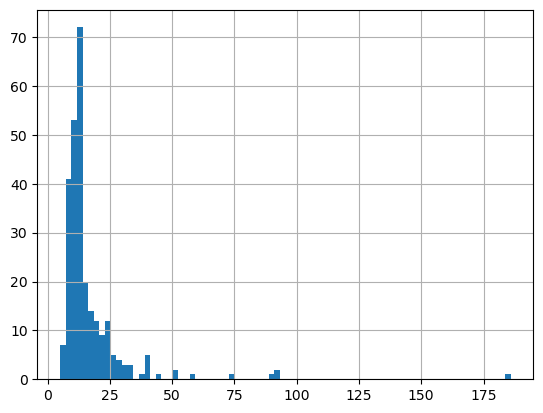

In [157]:
extra_pockets.nres.hist(bins=80)

### Labelling

In [158]:
extra_pockets.loc[
    extra_pockets.loc[
        lambda x: x["site_in_pocket"] >= 0.65
    ].index, 
    "label"
] = 1
extra_pockets["label"] = extra_pockets["label"].fillna(0).astype(int)

extra_pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
0,8sgj,pocket16,12,0.00000,0.000000,0
1,8sgj,pocket28,14,0.00000,0.000000,0
2,8sgj,pocket18,13,0.03125,0.076923,0
3,8sgj,pocket11,19,0.00000,0.000000,0
4,8sgj,pocket25,13,0.00000,0.000000,0
...,...,...,...,...,...,...
265,4jqi,pocket8,14,0.20000,0.142857,0
266,4jqi,pocket3,16,0.00000,0.000000,0
267,4jqi,pocket12,12,0.00000,0.000000,0
268,4jqi,pocket19,16,0.00000,0.000000,0


In [159]:
extra_pocketsf = f"{extra_apos_path}/pockets.pkl"
extra_pockets.to_pickle(extra_pocketsf)

##### No positive-labelled pockets

In [160]:
[pdb for pdb, ps in extra_pockets.groupby("pdb") if ps.label.sum() == 0]

['4jqi', '5b0u', '6yhr', '7l6r', '8sgj']

In [161]:
(
    extra_pockets
    .groupby('pdb').filter(lambda g: g.label.sum() == 0)
    .assign(key=lambda x: x.groupby('pdb')['site_in_pocket'].transform('max'))
    .sort_values(['key', 'pdb', 'site_in_pocket'], ascending=False)
    .drop(columns='key')
    .groupby('pdb').head(3)
).iloc[:50]

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
12,8sgj,pocket1,90,0.531250,0.188889,0
27,8sgj,pocket6,34,0.187500,0.176471,0
10,8sgj,pocket14,9,0.062500,0.222222,0
65,7l6r,pocket9,19,0.384615,0.526316,0
62,7l6r,pocket1,10,0.115385,0.300000,0
60,7l6r,pocket13,9,0.076923,0.222222,0
92,6yhr,pocket1,74,0.379310,0.148649,0
98,6yhr,pocket10,13,0.310345,0.692308,0
102,6yhr,pocket12,12,0.310345,0.750000,0
261,4jqi,pocket17,24,0.300000,0.125000,0


In [162]:
v, colors, sites_colors = view_pocket(*"8sgj	pocket1".split())
v

Viz(bg_color='#F7F7F7', color_data={'data': [{'color': 'white'}], 'nonSelectedColor': None, 'keepColors': Fals…

In [163]:
v.color(colors, keep_colors=True, keep_representations=True)
v.color_residues(sites_colors)

In [164]:
v, colors, sites_colors = view_pocket(*"7l6r	pocket9".split())
v

Viz(bg_color='#F7F7F7', color_data={'data': [{'color': 'white'}], 'nonSelectedColor': None, 'keepColors': Fals…

In [165]:
v.color(colors, keep_colors=True, keep_representations=True)
v.color_residues(sites_colors)

##### Positive pockets

In [166]:
extra_pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label
0,8sgj,pocket16,12,0.00000,0.000000,0
1,8sgj,pocket28,14,0.00000,0.000000,0
2,8sgj,pocket18,13,0.03125,0.076923,0
3,8sgj,pocket11,19,0.00000,0.000000,0
4,8sgj,pocket25,13,0.00000,0.000000,0
...,...,...,...,...,...,...
265,4jqi,pocket8,14,0.20000,0.142857,0
266,4jqi,pocket3,16,0.00000,0.000000,0
267,4jqi,pocket12,12,0.00000,0.000000,0
268,4jqi,pocket19,16,0.00000,0.000000,0


In [167]:
extra_dropped = set(extra_pockets.pdb.unique()) - set(extra_pockets.loc[extra_pockets.label == 1].pdb.unique())
# Total initial PDBs, final PDBs, dropped PDBs, % of PDBs dropped, and list of dropped PDBs
len(extra_pockets.pdb.unique()), len(extra_pockets.loc[extra_pockets.label == 1].pdb.unique()), len(extra_dropped), len(extra_dropped)/len(extra_pockets.pdb.unique()), extra_dropped

(9, 4, 5, 0.5555555555555556, {'4jqi', '5b0u', '6yhr', '7l6r', '8sgj'})

In [168]:
# extra_final_pockets = extra_pockets.query(f"pdb not in {list(extra_dropped)}")
extra_final_pockets = extra_pockets

## Features per-pocket

In [169]:
extra_final_pockets = pd.concat(
    (
        extra_final_pockets,
        extra_final_pockets.apply(
            lambda row: pd.Series(
                Pocket(f"{extra_apos_pockets_path}/{row['pdb']}/{row['pdb']}_out/pockets/{row['pocket']}_atm.cif").feats
            ), axis=1
        )
    ),
    axis=1
)

extra_final_pockets

,pdb,pocket,nres,site_in_pocket,pocket_in_site,label,Pocket Score,Drug Score,Number of alpha spheres,Mean alpha-sphere radius,...,Local hydrophobic density Score,Number of apolar alpha sphere,Proportion of apolar alpha sphere,Total SASA,Polar SASA,Apolar SASA,Proportion of polar atoms,Alpha sphere density,Cent. of mass - Alpha Sphere max dist,Flexibility
0,8sgj,pocket16,12,0.00000,0.000000,0,-0.0342,0.3070,53.0,3.4745,...,43.5111,45.0,0.8491,94.532,35.358,59.174,33.333,3.556,8.425,0.267
1,8sgj,pocket28,14,0.00000,0.000000,0,-0.1447,0.0047,71.0,3.4962,...,15.4286,21.0,0.2958,228.737,138.165,90.572,46.000,6.965,16.552,0.387
2,8sgj,pocket18,13,0.03125,0.076923,0,-0.0508,0.0055,45.0,3.7490,...,8.1429,14.0,0.3111,151.622,69.503,82.119,36.111,5.570,15.773,0.240
3,8sgj,pocket11,19,0.00000,0.000000,0,0.0417,0.1571,82.0,3.2878,...,20.5714,35.0,0.4268,156.862,88.027,68.835,41.176,5.967,15.146,0.112
4,8sgj,pocket25,13,0.00000,0.000000,0,-0.1152,0.0046,58.0,3.5925,...,15.7647,17.0,0.2931,140.498,65.625,74.873,51.282,4.356,9.870,0.216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,4jqi,pocket8,14,0.20000,0.142857,0,0.0042,0.0047,42.0,3.5379,...,3.5556,9.0,0.2143,131.237,43.080,88.157,48.276,5.280,14.131,0.430
266,4jqi,pocket3,16,0.00000,0.000000,0,0.2233,0.0927,55.0,3.4106,...,19.0370,27.0,0.4909,66.991,5.402,61.589,21.212,4.633,10.815,0.267
267,4jqi,pocket12,12,0.00000,0.000000,0,-0.0437,0.0029,54.0,3.6728,...,7.0000,16.0,0.2963,174.286,66.807,107.479,36.842,6.107,15.234,0.419
268,4jqi,pocket19,16,0.00000,0.000000,0,-0.1457,0.0054,80.0,3.7185,...,17.4167,24.0,0.3000,205.427,85.872,119.555,42.857,5.335,14.904,0.544


In [170]:
extra_final_pockets = pd.concat(
    (
        extra_final_pockets[["pdb", "pocket", 'nres', 'site_in_pocket', 'pocket_in_site']],
        extra_final_pockets["label"],
        extra_final_pockets.drop(columns=['nres', 'site_in_pocket', 'pocket_in_site'] + ["pdb", "pocket", "label"])
    ),
    axis=1,
    keys=["Pockets", "Label", "FPocket"]
)

extra_final_pockets

Pockets                                              Label      FPocket  \
        pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
0      8sgj  pocket16   12        0.00000       0.000000     0      -0.0342   
1      8sgj  pocket28   14        0.00000       0.000000     0      -0.1447   
2      8sgj  pocket18   13        0.03125       0.076923     0      -0.0508   
3      8sgj  pocket11   19        0.00000       0.000000     0       0.0417   
4      8sgj  pocket25   13        0.00000       0.000000     0      -0.1152   
..      ...       ...  ...            ...            ...   ...          ...   
265    4jqi   pocket8   14        0.20000       0.142857     0       0.0042   
266    4jqi   pocket3   16        0.00000       0.000000     0       0.2233   
267    4jqi  pocket12   12        0.00000       0.000000     0      -0.0437   
268    4jqi  pocket19   16        0.00000       0.000000     0      -0.1457   
269    4jqi   pocket6   18        0.00000       0.000000     0       0.0327   

                                                                 ...  \
    Drug Score Number of alpha spheres Mean alpha-sphere radius  ...   
0       0.3070                    53.0                   3.4745  ...   
1       0.0047                    71.0                   3.4962  ...   
2       0.0055                    45.0                   3.7490  ...   
3       0.1571                    82.0                   3.2878  ...   
4       0.0046                    58.0                   3.5925  ...   
..         ...                     ...                      ...  ...   
265     0.0047                    42.0                   3.5379  ...   
266     0.0927                    55.0                   3.4106  ...   
267     0.0029                    54.0                   3.6728  ...   
268     0.0054                    80.0                   3.7185  ...   
269     0.0099                    72.0                   3.7133  ...   

                                                                   \
    Local hydrophobic density Score Number of apolar alpha sphere   
0                           43.5111                          45.0   
1                           15.4286                          21.0   
2                            8.1429                          14.0   
3                           20.5714                          35.0   
4                           15.7647                          17.0   
..                              ...                           ...   
265                          3.5556                           9.0   
266                         19.0370                          27.0   
267                          7.0000                          16.0   
268                         17.4167                          24.0   
269                         16.5455                          22.0   

                                                                         \
    Proportion of apolar alpha sphere Total SASA Polar SASA Apolar SASA   
0                              0.8491     94.532     35.358      59.174   
1                              0.2958    228.737    138.165      90.572   
2                              0.3111    151.622     69.503      82.119   
3                              0.4268    156.862     88.027      68.835   
4                              0.2931    140.498     65.625      74.873   
..                                ...        ...        ...         ...   
265                            0.2143    131.237     43.080      88.157   
266                            0.4909     66.991      5.402      61.589   
267                            0.2963    174.286     66.807     107.479   
268                            0.3000    205.427     85.872     119.555   
269                            0.3056    138.871     72.452      66.420   

                                                    \
    Proportion of polar atoms Alpha sphere density   
0                      33.333                3.556   
1  

In [171]:
extra_pockets_features = pd.concat(
    (
        extra_final_pockets,
        extra_final_pockets.apply(
            lambda row: get_mean_pocket_features(
                row[("Pockets", "pdb")],
                row[("Pockets", "pocket")],
                pdb_features = extra_featuresd[row[("Pockets", "pdb")]],
                pockets_path = extra_apos_pockets_path # f"{pockets_path}/{pdb}/{pdb}_out/pockets/{pocket}_atm.cif"
            ), 
            axis=1 
        )
    ),
    axis=1
)

extra_pockets_features

Pockets                                              Label      FPocket  \
        pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
0      8sgj  pocket16   12        0.00000       0.000000     0      -0.0342   
1      8sgj  pocket28   14        0.00000       0.000000     0      -0.1447   
2      8sgj  pocket18   13        0.03125       0.076923     0      -0.0508   
3      8sgj  pocket11   19        0.00000       0.000000     0       0.0417   
4      8sgj  pocket25   13        0.00000       0.000000     0      -0.1152   
..      ...       ...  ...            ...            ...   ...          ...   
265    4jqi   pocket8   14        0.20000       0.142857     0       0.0042   
266    4jqi   pocket3   16        0.00000       0.000000     0       0.2233   
267    4jqi  pocket12   12        0.00000       0.000000     0      -0.0437   
268    4jqi  pocket19   16        0.00000       0.000000     0      -0.1457   
269    4jqi   pocket6   18        0.00000       0.000000     0       0.0327   

                                                                 ...  \
    Drug Score Number of alpha spheres Mean alpha-sphere radius  ...   
0       0.3070                    53.0                   3.4745  ...   
1       0.0047                    71.0                   3.4962  ...   
2       0.0055                    45.0                   3.7490  ...   
3       0.1571                    82.0                   3.2878  ...   
4       0.0046                    58.0                   3.5925  ...   
..         ...                     ...                      ...  ...   
265     0.0047                    42.0                   3.5379  ...   
266     0.0927                    55.0                   3.4106  ...   
267     0.0029                    54.0                   3.6728  ...   
268     0.0054                    80.0                   3.7185  ...   
269     0.0099                    72.0                   3.7133  ...   

      HHBlits                                                              \
         M->M      M->I      M->D      I->M      I->I      D->M      D->D   
0    0.960393  0.013573  0.026106  0.258887  0.491092  0.049368  0.950513   
1    0.881871  0.030298  0.087796  0.383562  0.616425  0.018516  0.981423   
2    0.899622  0.030244  0.070014  0.401700  0.598274  0.106505  0.893517   
3    0.876903  0.036800  0.086349  0.289485  0.710526  0.047774  0.952233   
4    0.936656  0.023770  0.039556  0.351106  0.572006  0.165316  0.834701   
..        ...       ...       ...       ...       ...       ...       ...   
265  0.903910  0.020998  0.075087  0.359765  0.640269  0.103486  0.896543   
266  0.964962  0.009062  0.025914  0.298281  0.639198  0.224343  0.775659   
267  0.957657  0.028217  0.014108  0.418731  0.497841  0.307800  0.692181   
268  0.944717  0.018328  0.037005  0.286179  0.588822  0.091041  0.908843   
269  0.818487  0.053249  0.128251  0.364035  0.635970  0.302670  0.697328   

                                    
          Neff    Neff_I    Neff_D  
0     7.402167  0.777083  4.546750  
1     8.198214  1.068071  4.327357  
2     8.226231  1.096231  3.046538  
3    10.482684  1.128737  3.646263  
4     8.005692  1.033462  2.943231  
..         ...       ...       ...  
265  11.652929  1.203571  6.393357  
266  11.691562  1.083687  2.318750  
267  11.358750  1.477750  1.626333  
268  11.506875  1.060500  3.739063  
269  11.367500  1.758778  4.348611  

[270 rows x 194 columns]

In [172]:
extra_pockets_featuresf = f"{extra_apos_path}/pockets_features.pkl"

if not os.path.isfile(extra_pockets_featuresf):
    extra_pockets_featuresd = {
        pdb: pks
        for pdb, pks in extra_pockets_features.groupby(("Pockets", "pdb"), sort=False)
    }
    with open(extra_pockets_featuresf, "wb") as f:
        pickle.dump(extra_pockets_featuresd, f)
else:
    with open(extra_pockets_featuresf, "rb") as f:
        extra_pockets_featuresd = pickle.load(f)

len(extra_pockets_featuresd), extra_pockets_featuresd

(9,
 {'8sgj':    Pockets                                              Label      FPocket  \
         pdb    pocket nres site_in_pocket pocket_in_site label Pocket Score   
  0     8sgj  pocket16   12        0.00000       0.000000     0      -0.0342   
  1     8sgj  pocket28   14        0.00000       0.000000     0      -0.1447   
  2     8sgj  pocket18   13        0.03125       0.076923     0      -0.0508   
  3     8sgj  pocket11   19        0.00000       0.000000     0       0.0417   
  4     8sgj  pocket25   13        0.00000       0.000000     0      -0.1152   
  5     8sgj  pocket15    9        0.03125       0.111111     0      -0.0332   
  6     8sgj   pocket7    8        0.03125       0.125000     0       0.1316   
  7     8sgj  pocket22   10        0.00000       0.000000     0      -0.0848   
  8     8sgj  pocket13    8        0.00000       0.000000     0       0.0031   
  9     8sgj  pocket23   40        0.00000       0.000000     0      -0.1057   
  10    8sgj  pocket14    9 

# Embeddings

In [149]:
extra_seq_embsf = f"{extra_apos_path}/seq_embeddings.pkl"

if not os.path.isfile(extra_seq_embsf):
    from utils.embeddings import get_embs
    
    extra_seq_embsd = {}

    for pdb in tqdm(extra_featuresd, smoothing=0):
        extra_seq_embsd[pdb] = {}
        cif = Cif(pdb)
        entities = pd.DataFrame(cif.cif.data["_entity_poly"], dtype=str)
        for entity_id, entity_res in cif.residues.groupby("label_entity_id"):
            seq = entities.query(f"entity_id == '{entity_id}'")["pdbx_seq_one_letter_code_can"].item().replace("\n", "")
            extra_seq_embsd[pdb][entity_id] = {
                "seq": seq,
                "embs": get_embs(seq)
            }
        
    with open(extra_seq_embsf, "wb") as f:
        pickle.dump(extra_seq_embsd, f)
else:
    with open(extra_seq_embsf, "rb") as f:
        extra_seq_embsd = pickle.load(f)

len(extra_seq_embsd), extra_seq_embsd

Some weights of EsmModel were not initialized from the model checkpoint at /data/fnerin/huggingface/hub/models--facebook--esm2_t33_650M_UR50D/snapshots/08e4846e537177426273712802403f7ba8261b6c and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/9 [00:00<?, ?it/s]

(9,
 {'8sgj': {'1': {'seq': 'MYNMRRLSLSPTFSMGFHLLVTVSLLFSHVDHVIAETEMEGEGNETGECTGSYYCKKGVILPIWEPQDPSFGDKIARATVYFVAMVYMFLGVSIIADRFMSSIEVITSQEKEITIKKPNGETTKTTVRIWNETVSNLTLMALGSSAPEILLSVIEVCGHNFTAGDLGPSTIVGSAAFNMFIIIALCVYVVPDGETRKIKHLRVFFVTAAWSIFAYTWLYIILSVISPGVVEVWEGLLTFFFFPICVVFAWVADRRLLFYKYVYKRYRAGKQRGMIIEHEGDRPSSKTEIEMDGKVVNSHVENFLDGALVLEVDERDQDDEEARREMARILKELKQKHPDKEIEQLIELANYQVLSQQQKSRAFYRIQATRLMTGATENDPVSKIFFEQGTYQCLENCGTVALTIIRRGGDLTNTVFVDFRTEDGTANAGSDYEFTEGTVVFKPGDTQKEIRVGIIDDDIFEEDENFLVHLSNVKVSSEASEDGILEANHVSTLACLGSPSTATVTIFDDDHAGIFTFEEPVTHVSESIGIMEVKVLRTSGARGNVIVPYKTIEGTARGGGEDFEDTCGELEFQNDEIVKTISVKVIDDEEYEKNKTFFLEIGEPRLVEMSEKKALLLNELGGFTITGKYLFGQPVFRKVHAREHPILSTVITIADEYDDKQPLTSKEEEERRIAEMGRPILGEHTKLEVIIEESYEFKSTVDKLIKKTNLALVVGTNSWREQFIEAITVSAGEDDDDDECGEEKLPSCFDYVMHFLTVFWKVLFAFVPPTEYWNGWACFIVSILMIGLLTAFIGDLASHFGCTIGLKDSVTAVVFVALGTSVPDTFASKVAATQDQYADASIGNVTGSNAVNVFLGIGVAWSIAAIYHAANGEQFKVSPGTLAFSVTLFTIFAFINVGVLLYRRRPEIGGELGGPRTAKLLTSCLFVLLWLLYIFFSSLEAYCHIKGFAAAGGSWSHPQFEKGGGSGGGSG

In [173]:
extra_embsf = f"{extra_apos_path}/embeddings.pkl"

if not os.path.isfile(extra_embsf):
    extra_embsd = {}
    for pdb, embs in tqdm(extra_seq_embsd.items(), smoothing=0):
        residues = extra_featuresd[pdb][["Residues", "Label"]]

        extra_embsd[pdb] = residues.merge(
            pd.concat((
                pd.concat(
                    (
                        pd.Series([entity_id]*len(entd["seq"]), name="label_entity_id"),
                        pd.Series(range(1, len(entd["seq"])+1), name="label_seq_id", dtype=str),
                        pd.DataFrame(entd["embs"])
                    ),
                    axis=1,
                    keys=["Residues", "Residues", "Embeddings"]
                )
                for entity_id, entd in embs.items()
            )),
            on=[("Residues", "label_entity_id"), ("Residues", "label_seq_id")]
        )
        
    with open(extra_embsf, "wb") as f:
        pickle.dump(extra_embsd, f)
else:
    with open(extra_embsf, "rb") as f:
        extra_embsd = pickle.load(f)

len(extra_embsd), extra_embsd

  0%|          | 0/9 [00:00<?, ?it/s]

(9,
 {'8sgj':     Residues                                                          \
           pdb label_entity_id label_asym_id label_seq_id auth_asym_id   
  0       8sgj               1             A           52            A   
  1       8sgj               1             A           53            A   
  2       8sgj               1             A           54            A   
  3       8sgj               1             A           55            A   
  4       8sgj               1             A           56            A   
  ..       ...             ...           ...          ...          ...   
  746     8sgj               1             A          941            A   
  747     8sgj               1             A          942            A   
  748     8sgj               1             A          943            A   
  749     8sgj               1             A          944            A   
  750     8sgj               1             A          945            A   
  
                       

## Per-pocket

In [174]:
extra_pockets_embeddings = pd.concat(
    (
        extra_final_pockets[["Pockets", "Label"]],
        extra_final_pockets.apply(
            lambda row: get_mean_pocket_features(
                row[("Pockets", "pdb")],
                row[("Pockets", "pocket")],
                pdb_features = extra_embsd[row[("Pockets", "pdb")]],
                pockets_path = extra_apos_pockets_path # # f"{pockets_path}/{pdb}/{pdb}_out/pockets/{pocket}_atm.cif"
            ), 
            axis=1 
        )
    ),
    axis=1,
)

extra_pockets_embeddings

Pockets                                              Label Embeddings  \
        pdb    pocket nres site_in_pocket pocket_in_site label          0   
0      8sgj  pocket16   12        0.00000       0.000000     0   0.028783   
1      8sgj  pocket28   14        0.00000       0.000000     0   0.139050   
2      8sgj  pocket18   13        0.03125       0.076923     0   0.046803   
3      8sgj  pocket11   19        0.00000       0.000000     0   0.046050   
4      8sgj  pocket25   13        0.00000       0.000000     0   0.038079   
..      ...       ...  ...            ...            ...   ...        ...   
265    4jqi   pocket8   14        0.20000       0.142857     0   0.191902   
266    4jqi   pocket3   16        0.00000       0.000000     0  -0.059920   
267    4jqi  pocket12   12        0.00000       0.000000     0  -0.054147   
268    4jqi  pocket19   16        0.00000       0.000000     0  -0.127444   
269    4jqi   pocket6   18        0.00000       0.000000     0   0.028700   

                                   ...                                \
            1         2         3  ...      1270      1271      1272   
0   -0.031149  0.191640 -0.013690  ...  0.070864  0.028384 -0.100363   
1   -0.052265  0.033050  0.018375  ...  0.115896 -0.050707 -0.123461   
2   -0.086999 -0.136003  0.064608  ...  0.050835  0.007173 -0.067693   
3   -0.131512  0.015863 -0.049492  ...  0.148296 -0.016747 -0.042103   
4   -0.032414  0.010978 -0.004761  ...  0.046150 -0.057953 -0.143491   
..        ...       ...       ...  ...       ...       ...       ...   
265 -0.378033 -0.236745  0.249556  ... -0.249063 -0.069211 -0.217294   
266 -0.257329 -0.174459  0.188639  ... -0.121158 -0.016214 -0.178867   
267 -0.204177 -0.195251  0.215009  ... -0.155306  0.029848 -0.239005   
268 -0.049242 -0.170669  0.030148  ... -0.073143  0.059140 -0.103310   
269 -0.234352  0.082504  0.097684  ... -0.264285  0.016725 -0.157583   

                                                                           
         1273      1274      1275      1276      1277      1278      1279  
0    0.024317 -0.045612  0.012636  0.126807 -0.100536  0.091864 -0.095267  
1    0.033784  0.027543 -0.043926  0.108608 -0.138154  0.045834  0.024575  
2    0.037636 -0.009038  0.051537  0.070069 -0.047049 -0.028762  0.008821  
3    0.052640 -0.031768  0.034563  0.052106 -0.130997 -0.035290  0.139433  
4    0.013288 -0.044231 -0.070388 -0.006477 -0.071294  0.009349 -0.008458  
..        ...       ...       ...       ...       ...       ...       ...  
265  0.030753  0.168663 -0.131082 -0.056180 -0.398059  0.044847  0.133917  
266  0.066785 -0.074025 -0.031570  0.127627 -0.414618  0.121872  0.269865  
267 -0.018739 -0.072623 -0.030928  0.090791 -0.371006  0.150718  0.164425  
268 -0.016545  0.084769  0.010497  0.172896 -0.279472 -0.033598  0.053703  
269  0.141470 -0.167130 -0.199579  0.033846 -0.182239 -0.036845  0.161450  

[270 rows x 1286 columns]

In [175]:
extra_pockets_embeddingsf = f"{extra_apos_path}/pockets_embeddings.pkl"

if not os.path.isfile(extra_pockets_embeddingsf):
    extra_pockets_embeddingsd = {
        pdb: pks
        for pdb, pks in extra_pockets_embeddings.groupby(("Pockets", "pdb"))
    }
    with open(extra_pockets_embeddingsf, "wb") as f:
        pickle.dump(extra_pockets_embeddingsd, f)
else:
    with open(extra_pockets_embeddingsf, "rb") as f:
        extra_pockets_embeddingsd = pickle.load(f)

len(extra_pockets_embeddingsd), extra_pockets_embeddingsd

(9,
 {'4jqi':     Pockets                                              Label Embeddings  \
          pdb    pocket nres site_in_pocket pocket_in_site label          0   
  251    4jqi  pocket16   20            0.0       0.000000     0  -0.079640   
  252    4jqi  pocket18    9            0.0       0.000000     0   0.018289   
  253    4jqi  pocket11    9            0.0       0.000000     0  -0.025624   
  254    4jqi  pocket15    6            0.0       0.000000     0  -0.092973   
  255    4jqi   pocket7   10            0.0       0.000000     0   0.030116   
  256    4jqi  pocket13    9            0.0       0.000000     0   0.006657   
  257    4jqi  pocket14    9            0.0       0.000000     0  -0.014008   
  258    4jqi   pocket1   59            0.1       0.016949     0   0.091035   
  259    4jqi   pocket2   27            0.0       0.000000     0   0.002264   
  260    4jqi   pocket4    9            0.0       0.000000     0   0.000893   
  261    4jqi  pocket17   24            